# Analyze Boston City of Boston 


311 SERVICE REQUESTS
This data set includes all channels of engagement in which a service request is created.

Refer to this link to learn more about BOS:311: https://www.cityofboston.gov/311/

Refer to this link for the Boston 311 Open Data Source:  https://data.boston.gov/dataset/311-service-requests
THEME	City services

LOCATION	Boston (all)

CONTACT POINT	Boston 311

CONTACT POINT EMAIL	311supervisors@boston.gov

CONTACT POINT PHONE NUMBER	617-635-4500

LICENSE	Open Data Commons Public Domain Dedication and License (PDDL)

# Data links for the project

Boston 311 calls:  https://data.boston.gov/dataset/311-service-requests

NYC 311 Calls:  https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9/data

Chicago 311 Calls:  https://data.cityofchicago.org/Service-Requests/311-Service-Requests/v6vf-nfxy

San Fransisco 311 Calls: https://data.sfgov.org/City-Infrastructure/311-Cases/vw6y-z8j6/data

In [1]:
## Loading libraries for the Boston 311
import pandas as pd
import json
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.io.json import json_normalize
from itertools import chain
from scipy.stats import norm
import plotly
import missingno as msno
import plotly.graph_objs as go
import numpy as np
from sklearn.preprocessing import LabelEncoder 

## Plotting for geopanda 
import descartes 
import geopandas as gpd
from shapely.geometry import Point, Polygon
from IPython import display
%matplotlib inline

# t-test for independent samples
from math import sqrt
from numpy import mean
from scipy.stats import sem
from scipy.stats import t

## Regression Models
# Models for the splitting the samples into train_test
from sklearn.model_selection import train_test_split
from sklearn import model_selection


## Models for Logistic Regression
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_classification
from sklearn import linear_model, datasets
from sklearn.neural_network import MLPClassifier
from collections import Counter
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve
from sklearn import linear_model
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC, LinearSVC
from xgboost import XGBClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold, cross_val_score
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE

from scipy import stats
import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multicomp import MultiComparison


# Model Metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, roc_auc_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import f1_score

# Model Optimization
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve

## Word Clouds 
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

C:\Users\jlpar\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning:

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.



In [2]:
## Loading the Boston 311 Dataset

df_raw_bos = pd.read_csv("C:/Users/jlpar/Documents/Springboard Curriculum/Course/Course Material/Unit 15/Capstone II Datasets/boston311.csv")
type(df_raw_bos)

pandas.core.frame.DataFrame

In [3]:
## Quick look a Boston 311 dataset
df_raw_bos.head(5)

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,1.010000e+11,7/1/2011 2:28,8/15/2011 2:28,8/1/2011 15:21,ONTIME,Closed,Case Closed Case Resolved No Sidewalk and poor...,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Corey St & Lagrange St,NaN,42.3003,-71.1698,Self Service
1,1.010000e+11,7/1/2011 3:03,7/15/2011 3:03,7/22/2011 16:13,OVERDUE,Closed,Case Closed Case Resolved completed,Street Light Outages,Public Works Department,Street Lights,...,E18,Hyde Park,10,Ward 18,1816,235 Fairmount Ave,2136.0,42.2496,-71.1156,Self Service
2,1.010000e+11,7/1/2011 3:12,NaN,7/1/2011 6:12,ONTIME,Closed,Case Closed Case Resolved,Highway Maintenance,Public Works Department,Highway Maintenance,...,C11,Dorchester,7,Ward 13,1309,INTERSECTION Dorchester Ave & Hallam St,NaN,42.3144,-71.0569,Constituent Call
3,1.010000e+11,7/1/2011 3:43,NaN,7/5/2011 9:16,ONTIME,Closed,Case Closed Case Noted,Notification,Mayor's 24 Hour Hotline,Notification,...,E13,Jamaica Plain,11,Ward 10,1006,7 Edge Hill St,2130.0,42.3243,-71.1060,Constituent Call
4,1.010000e+11,7/1/2011 5:35,8/15/2011 5:35,10/17/2011 12:33,OVERDUE,Closed,Case Closed Case Noted Duplicate request,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,D4,Fenway / Kenmore / Audubon Circle / Longwood,14,Ward 21,2102,INTERSECTION Arundel St & Beacon St,NaN,42.3471,-71.1033,Self Service


In [4]:
## Reviewing the integers for the dataset
df_raw_bos.describe()

,case_enquiry_id,location_zipcode,latitude,longitude
count,1.048575e+06,806329.000000,1.048575e+06,1.048575e+06
mean,1.010015e+11,2127.368274,4.232830e+01,-7.108270e+01
std,9.452273e+05,18.454020,3.445641e-02,3.544502e-02
min,1.010000e+11,2026.000000,4.223020e+01,-7.118540e+01
25%,1.010010e+11,2120.000000,4.229910e+01,-7.110570e+01
50%,1.010010e+11,2126.000000,4.233640e+01,-7.107200e+01
75%,1.010020e+11,2131.000000,4.235940e+01,-7.105870e+01
max,1.010030e+11,2467.000000,4.239520e+01,-7.099490e+01


In [5]:
# looking for missing and unique values from the df_raw training dataset  
df_raw_bos_stats = pd.DataFrame(columns = ['column', 'values', 'values_count_incna', 'values_count_nona', 
                                       'num_miss', 'pct_miss'])
tmp = pd.DataFrame()

for c in df_raw_bos.columns:
    tmp['column'] = [c]
    tmp['values'] = [df_raw_bos[c].unique()]
    tmp['values_count_incna'] = len(list(df_raw_bos[c].unique()))
    tmp['values_count_nona'] = int(df_raw_bos[c].nunique())
    tmp['num_miss'] = df_raw_bos[c].isnull().sum()
    tmp['pct_miss'] = (df_raw_bos[c].isnull().sum()/ len(df_raw_bos)).round(3)*100
    df_raw_bos_stats = df_raw_bos_stats.append(tmp)

In [6]:
# Ascending sort on the attributes for each of the Variables
df_raw_bos_stats.sort_values(by = 'values_count_incna', inplace = True, ascending = True)

# And set the index to Column Names
df_raw_bos_stats.set_index('column', inplace = True)
df_raw_bos_stats 

,values,values_count_incna,values_count_nona,num_miss,pct_miss
column,,,,,
case_status,"[Closed, Open]",2,2,0,0.0
ontime,"[ONTIME, OVERDUE, nan]",3,2,562,0.1
case_enquiry_id,"[101000000000.0, 101001000000.0, 101002000000....",4,4,0,0.0
source,"[Self Service, Constituent Call, Employee Gene...",7,7,0,0.0
city_council_district,"[6, 5, 3, 8, 2, 7, 4, 1, 9, , 0, nan]",12,11,168,0.0
fire_district,"[nan, 12, 7, 9, 4, 6, 8, 1, 3, 11, , 5, 10]",13,12,2516,0.2
subject,"[Transportation - Traffic Division, Public Wor...",14,14,0,0.0
pwd_district,"[6, 8, 3, 10A, 7, 1C, 10B, 5, 9, 1A, 1B, 4, 2,...",15,14,635,0.1
department,"[BTDT, PWDx, INFO, ISD, PARK, PROP, BWSC, DISB...",16,16,0,0.0


In [7]:
# Total missing values for each feature from the df_raw_bos
print(df_raw_bos.isnull().sum())

case_enquiry_id                        0
open_dt                                0
target_dt                         201286
closed_dt                          82105
ontime                               562
case_status                            0
closure_reason                         0
case_title                           362
subject                                0
reason                                 0
type                                   0
queue                                  0
department                             0
submittedphoto                    828771
closedphoto                       922640
location                               0
fire_district                       2516
pwd_district                         635
city_council_district                168
police_district                      437
neighborhood                        1086
neighborhood_services_district       167
ward                                 154
precinct                             709
location_street_

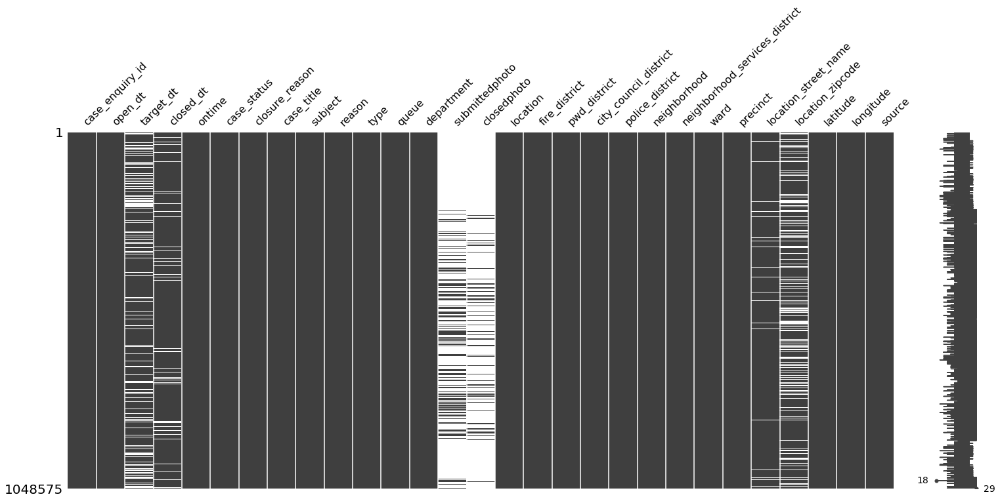

In [8]:
## Missing Value Matrix displaying the distribution of the missing values for Boston 311
msno.matrix(df_raw_bos)

In [9]:
## Looking at the columns or attributes for the df_raw_bos
df_raw_bos.columns

Index(['case_enquiry_id', 'open_dt', 'target_dt', 'closed_dt', 'ontime',
       'case_status', 'closure_reason', 'case_title', 'subject', 'reason',
       'type', 'queue', 'department', 'submittedphoto', 'closedphoto',
       'location', 'fire_district', 'pwd_district', 'city_council_district',
       'police_district', 'neighborhood', 'neighborhood_services_district',
       'ward', 'precinct', 'location_street_name', 'location_zipcode',
       'latitude', 'longitude', 'source'],
      dtype='object')

In [10]:
## Looking at the time open_dt variable
df_raw_bos.open_dt.describe()

count            1048575
unique            794736
top       7/6/2011 11:14
freq                  60
Name: open_dt, dtype: object

In [11]:
## Describe statement for all attributes of the df_raw_bos
df_raw_bos.describe(include='all')

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
count,1.048575e+06,1048575,847289,966470,1048013,1048575,1048575,1048213,1048575,1048575,...,1048138,1047489,1048408,1048421,1047866,1017935,806329.000000,1.048575e+06,1.048575e+06,1048575
unique,NaN,794736,459306,611769,2,2,608375,11800,14,54,...,24,24,17,46,255,128883,NaN,NaN,NaN,7
top,NaN,7/6/2011 11:14,2/13/2013 8:30,2/14/2013 6:46,ONTIME,Closed,,Schedule a Bulk Item Pickup,Public Works Department,Sanitation,...,D4,Dorchester,13,Ward 18,,1 City Hall Plz,NaN,NaN,NaN,Constituent Call
freq,NaN,60,12777,353,840854,966470,81929,88214,634084,168356,...,130433,155864,106978,76097,33606,3000,NaN,NaN,NaN,478220
mean,1.010015e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2127.368274,4.232830e+01,-7.108270e+01,NaN
std,9.452273e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,18.454020,3.445641e-02,3.544502e-02,NaN
min,1.010000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2026.000000,4.223020e+01,-7.118540e+01,NaN
25%,1.010010e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2120.000000,4.229910e+01,-7.110570e+01,NaN
50%,1.010010e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2126.000000,4.233640e+01,-7.107200e+01,NaN
75%,1.010020e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2131.000000,4.235940e+01,-7.105870e+01,NaN


In [12]:
## Converting the open_dt attribute to a timestamp for analysis
df_raw2=df_raw_bos

df_raw2['open_dt'] = pd.to_datetime (df_raw2['open_dt'])
df_raw2

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,1.010000e+11,2011-07-01 02:28:00,8/15/2011 2:28,8/1/2011 15:21,ONTIME,Closed,Case Closed Case Resolved No Sidewalk and poor...,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Corey St & Lagrange St,NaN,42.3003,-71.1698,Self Service
1,1.010000e+11,2011-07-01 03:03:00,7/15/2011 3:03,7/22/2011 16:13,OVERDUE,Closed,Case Closed Case Resolved completed,Street Light Outages,Public Works Department,Street Lights,...,E18,Hyde Park,10,Ward 18,1816,235 Fairmount Ave,2136.0,42.2496,-71.1156,Self Service
2,1.010000e+11,2011-07-01 03:12:00,NaN,7/1/2011 6:12,ONTIME,Closed,Case Closed Case Resolved,Highway Maintenance,Public Works Department,Highway Maintenance,...,C11,Dorchester,7,Ward 13,1309,INTERSECTION Dorchester Ave & Hallam St,NaN,42.3144,-71.0569,Constituent Call
3,1.010000e+11,2011-07-01 03:43:00,NaN,7/5/2011 9:16,ONTIME,Closed,Case Closed Case Noted,Notification,Mayor's 24 Hour Hotline,Notification,...,E13,Jamaica Plain,11,Ward 10,1006,7 Edge Hill St,2130.0,42.3243,-71.1060,Constituent Call
4,1.010000e+11,2011-07-01 05:35:00,8/15/2011 5:35,10/17/2011 12:33,OVERDUE,Closed,Case Closed Case Noted Duplicate request,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,D4,Fenway / Kenmore / Audubon Circle / Longwood,14,Ward 21,2102,INTERSECTION Arundel St & Beacon St,NaN,42.3471,-71.1033,Self Service
5,1.010000e+11,2011-07-01 06:44:00,7/4/2011 6:44,7/1/2011 6:44,ONTIME,Closed,Case Closed Internal Case,Pick up Dead Animal,Public Works Department,Street Cleaning,...,C11,Dorchester,7,Ward 16,1602,305 Freeport St,2122.0,42.3020,-71.0519,Employee Generated
6,1.010000e+11,2011-07-01 07:14:00,7/5/2011 7:14,7/11/2011 12:13,OVERDUE,Closed,Case Closed Case Resolved The Construction Ins...,Utility Call-In,Public Works Department,Highway Maintenance,...,E18,Hyde Park,10,Ward 18,1817,124 Chittick Rd,2136.0,42.2449,-71.1204,Constituent Call
7,1.010000e+11,2011-07-01 07:16:00,7/31/2011 7:16,7/8/2011 10:44,ONTIME,Closed,Case Closed VIOISS: Violation Filed,Rodent Activity,Inspectional Services,Environmental Services,...,A1,Back Bay,6,Ward 5,501,26 Fayette St,2116.0,42.3488,-71.0675,Constituent Call
8,1.010000e+11,2011-07-01 07:28:00,7/5/2011 7:28,7/8/2011 10:26,OVERDUE,Closed,Case Closed Case Resolved Location has been ma...,Sidewalk Repair (Make Safe),Public Works Department,Highway Maintenance,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Carroll St & Lasell St,NaN,42.2876,-71.1686,Constituent Call
9,1.010000e+11,2011-07-01 07:31:00,7/5/2011 7:31,7/1/2011 12:00,ONTIME,Closed,Case Closed Case Resolved this has been colle...,Missed Recycling: District 06,Public Works Department,Sanitation,...,E5,Roslindale,10,Ward 18,1810,15 Lilac Ter,2131.0,42.2819,-71.1306,Employee Generated


In [13]:
## Converting the target_dt attribute to a timestamp for analysis
df_raw2['target_dt'] = pd.to_datetime (df_raw2['target_dt'])
df_raw2

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,1.010000e+11,2011-07-01 02:28:00,2011-08-15 02:28:00,8/1/2011 15:21,ONTIME,Closed,Case Closed Case Resolved No Sidewalk and poor...,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Corey St & Lagrange St,NaN,42.3003,-71.1698,Self Service
1,1.010000e+11,2011-07-01 03:03:00,2011-07-15 03:03:00,7/22/2011 16:13,OVERDUE,Closed,Case Closed Case Resolved completed,Street Light Outages,Public Works Department,Street Lights,...,E18,Hyde Park,10,Ward 18,1816,235 Fairmount Ave,2136.0,42.2496,-71.1156,Self Service
2,1.010000e+11,2011-07-01 03:12:00,NaT,7/1/2011 6:12,ONTIME,Closed,Case Closed Case Resolved,Highway Maintenance,Public Works Department,Highway Maintenance,...,C11,Dorchester,7,Ward 13,1309,INTERSECTION Dorchester Ave & Hallam St,NaN,42.3144,-71.0569,Constituent Call
3,1.010000e+11,2011-07-01 03:43:00,NaT,7/5/2011 9:16,ONTIME,Closed,Case Closed Case Noted,Notification,Mayor's 24 Hour Hotline,Notification,...,E13,Jamaica Plain,11,Ward 10,1006,7 Edge Hill St,2130.0,42.3243,-71.1060,Constituent Call
4,1.010000e+11,2011-07-01 05:35:00,2011-08-15 05:35:00,10/17/2011 12:33,OVERDUE,Closed,Case Closed Case Noted Duplicate request,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,D4,Fenway / Kenmore / Audubon Circle / Longwood,14,Ward 21,2102,INTERSECTION Arundel St & Beacon St,NaN,42.3471,-71.1033,Self Service
5,1.010000e+11,2011-07-01 06:44:00,2011-07-04 06:44:00,7/1/2011 6:44,ONTIME,Closed,Case Closed Internal Case,Pick up Dead Animal,Public Works Department,Street Cleaning,...,C11,Dorchester,7,Ward 16,1602,305 Freeport St,2122.0,42.3020,-71.0519,Employee Generated
6,1.010000e+11,2011-07-01 07:14:00,2011-07-05 07:14:00,7/11/2011 12:13,OVERDUE,Closed,Case Closed Case Resolved The Construction Ins...,Utility Call-In,Public Works Department,Highway Maintenance,...,E18,Hyde Park,10,Ward 18,1817,124 Chittick Rd,2136.0,42.2449,-71.1204,Constituent Call
7,1.010000e+11,2011-07-01 07:16:00,2011-07-31 07:16:00,7/8/2011 10:44,ONTIME,Closed,Case Closed VIOISS: Violation Filed,Rodent Activity,Inspectional Services,Environmental Services,...,A1,Back Bay,6,Ward 5,501,26 Fayette St,2116.0,42.3488,-71.0675,Constituent Call
8,1.010000e+11,2011-07-01 07:28:00,2011-07-05 07:28:00,7/8/2011 10:26,OVERDUE,Closed,Case Closed Case Resolved Location has been ma...,Sidewalk Repair (Make Safe),Public Works Department,Highway Maintenance,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Carroll St & Lasell St,NaN,42.2876,-71.1686,Constituent Call
9,1.010000e+11,2011-07-01 07:31:00,2011-07-05 07:31:00,7/1/2011 12:00,ONTIME,Closed,Case Closed Case Resolved this has been colle...,Missed Recycling: District 06,Public Works Department,Sanitation,...,E5,Roslindale,10,Ward 18,1810,15 Lilac Ter,2131.0,42.2819,-71.1306,Employee Generated


In [14]:
## Converting the closed_dt attribute to a timestamp for analysis
df_raw2['closed_dt'] = pd.to_datetime (df_raw2['closed_dt'])
df_raw2

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,1.010000e+11,2011-07-01 02:28:00,2011-08-15 02:28:00,2011-08-01 15:21:00,ONTIME,Closed,Case Closed Case Resolved No Sidewalk and poor...,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Corey St & Lagrange St,NaN,42.3003,-71.1698,Self Service
1,1.010000e+11,2011-07-01 03:03:00,2011-07-15 03:03:00,2011-07-22 16:13:00,OVERDUE,Closed,Case Closed Case Resolved completed,Street Light Outages,Public Works Department,Street Lights,...,E18,Hyde Park,10,Ward 18,1816,235 Fairmount Ave,2136.0,42.2496,-71.1156,Self Service
2,1.010000e+11,2011-07-01 03:12:00,NaT,2011-07-01 06:12:00,ONTIME,Closed,Case Closed Case Resolved,Highway Maintenance,Public Works Department,Highway Maintenance,...,C11,Dorchester,7,Ward 13,1309,INTERSECTION Dorchester Ave & Hallam St,NaN,42.3144,-71.0569,Constituent Call
3,1.010000e+11,2011-07-01 03:43:00,NaT,2011-07-05 09:16:00,ONTIME,Closed,Case Closed Case Noted,Notification,Mayor's 24 Hour Hotline,Notification,...,E13,Jamaica Plain,11,Ward 10,1006,7 Edge Hill St,2130.0,42.3243,-71.1060,Constituent Call
4,1.010000e+11,2011-07-01 05:35:00,2011-08-15 05:35:00,2011-10-17 12:33:00,OVERDUE,Closed,Case Closed Case Noted Duplicate request,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,D4,Fenway / Kenmore / Audubon Circle / Longwood,14,Ward 21,2102,INTERSECTION Arundel St & Beacon St,NaN,42.3471,-71.1033,Self Service
5,1.010000e+11,2011-07-01 06:44:00,2011-07-04 06:44:00,2011-07-01 06:44:00,ONTIME,Closed,Case Closed Internal Case,Pick up Dead Animal,Public Works Department,Street Cleaning,...,C11,Dorchester,7,Ward 16,1602,305 Freeport St,2122.0,42.3020,-71.0519,Employee Generated
6,1.010000e+11,2011-07-01 07:14:00,2011-07-05 07:14:00,2011-07-11 12:13:00,OVERDUE,Closed,Case Closed Case Resolved The Construction Ins...,Utility Call-In,Public Works Department,Highway Maintenance,...,E18,Hyde Park,10,Ward 18,1817,124 Chittick Rd,2136.0,42.2449,-71.1204,Constituent Call
7,1.010000e+11,2011-07-01 07:16:00,2011-07-31 07:16:00,2011-07-08 10:44:00,ONTIME,Closed,Case Closed VIOISS: Violation Filed,Rodent Activity,Inspectional Services,Environmental Services,...,A1,Back Bay,6,Ward 5,501,26 Fayette St,2116.0,42.3488,-71.0675,Constituent Call
8,1.010000e+11,2011-07-01 07:28:00,2011-07-05 07:28:00,2011-07-08 10:26:00,OVERDUE,Closed,Case Closed Case Resolved Location has been ma...,Sidewalk Repair (Make Safe),Public Works Department,Highway Maintenance,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Carroll St & Lasell St,NaN,42.2876,-71.1686,Constituent Call
9,1.010000e+11,2011-07-01 07:31:00,2011-07-05 07:31:00,2011-07-01 12:00:00,ONTIME,Closed,Case Closed Case Resolved this has been colle...,Missed Recycling: District 06,Public Works Department,Sanitation,...,E5,Roslindale,10,Ward 18,1810,15 Lilac Ter,2131.0,42.2819,-71.1306,Employee Generated


In [15]:
## Filtering all data for dates greator than October 1 of 2017 for 3 year analysis 
df_raw2=df_raw2[df_raw2['open_dt'] >= '10/1/2017']
df_raw2.count()

case_enquiry_id                   267375
open_dt                           267375
target_dt                         233767
closed_dt                         235385
ontime                            267374
case_status                       267375
closure_reason                    267375
case_title                        267348
subject                           267375
reason                            267375
type                              267375
queue                             267375
department                        267375
submittedphoto                    106705
closedphoto                        61962
location                          267375
fire_district                     266728
pwd_district                      267222
city_council_district             267341
police_district                   267227
neighborhood                      267045
neighborhood_services_district    267343
ward                              267374
precinct                          267150
location_street_

In [16]:
## Data check for the three year data set
df_raw2.head()

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
592709,1.010020e+11,2017-12-13 21:25:00,NaT,NaT,ONTIME,Open,,Animal Lost,Animal Control,Animal Issues,...,C11,Dorchester,7,Ward 16,1606,609 Adams St,2124.0,42.2890,-71.0558,Constituent Call
593771,1.010020e+11,2017-10-10 14:15:00,2017-10-24 14:15:00,NaT,OVERDUE,Open,,Other: Comment,Mayor's 24 Hour Hotline,Employee & General Comments,...,,,,,,NaN,NaN,42.3594,-71.0587,Constituent Call
593828,1.010020e+11,2017-10-27 22:11:00,2017-11-14 08:30:00,NaT,OVERDUE,Open,,BTDT: Complaint,Mayor's 24 Hour Hotline,Employee & General Comments,...,,,,,,NaN,NaN,42.3594,-71.0587,Constituent Call
594133,1.010020e+11,2017-11-18 20:54:00,NaT,NaT,ONTIME,Open,,Animal Found,Animal Control,Animal Issues,...,D14,Allston / Brighton,15,Ward 22,2203,28 Shepard St,2135.0,42.3468,-71.1503,Constituent Call
594213,1.010020e+11,2017-12-13 21:26:00,2017-12-29 08:30:00,NaT,OVERDUE,Open,,Other: Complaint,Mayor's 24 Hour Hotline,Employee & General Comments,...,,,,,,NaN,NaN,42.3594,-71.0587,Constituent Call


In [17]:
# looking for missing and unique data from the 3 year df_raw2 training dataset  
df_raw2_stats = pd.DataFrame(columns = ['column', 'values', 'values_count_incna', 'values_count_nona', 
                                       'num_miss', 'pct_miss'])
tmp = pd.DataFrame()

for c in df_raw2.columns:
    tmp['column'] = [c]
    tmp['values'] = [df_raw2[c].unique()]
    tmp['values_count_incna'] = len(list(df_raw2[c].unique()))
    tmp['values_count_nona'] = int(df_raw2[c].nunique())
    tmp['num_miss'] = df_raw2[c].isnull().sum()
    tmp['pct_miss'] = (df_raw2[c].isnull().sum()/ len(df_raw2)).round(3)*100
    df_raw2_stats = df_raw2_stats.append(tmp)

In [18]:
# Ascending sort on the Number of Distinct Categories for each categorical Variables
df_raw2_stats.sort_values(by = 'values_count_incna', inplace = True, ascending = True)

# And set the index to Column Names
df_raw2_stats.set_index('column', inplace = True)
df_raw2_stats 

,values,values_count_incna,values_count_nona,num_miss,pct_miss
column,,,,,
case_enquiry_id,"[101002000000.0, 101003000000.0]",2,2,0,0.0
case_status,"[Open, Closed]",2,2,0,0.0
ontime,"[ONTIME, OVERDUE, nan]",3,2,1,0.0
source,"[Constituent Call, Employee Generated, Self Se...",7,7,0,0.0
subject,"[Animal Control, Mayor's 24 Hour Hotline, Insp...",11,11,0,0.0
fire_district,"[8, , 11, 4, 9, 1, 3, 7, 12, 6, nan, 10]",12,11,647,0.2
city_council_district,"[3, , 9, 2, 5, 8, 7, 1, 4, 6, 0, nan]",12,11,34,0.0
police_district,"[C11, , D14, D4, E5, E18, B2, A7, A1, B3, E13...",14,13,148,0.1
pwd_district,"[7, , 4, 1C, 6, 8, 2, 9, 1B, 3, 10A, 10B, 1A,...",15,14,153,0.1


In [19]:
# Importing and running pandas profile statement on the 3 year data set
import pandas_profiling
pandas_profiling.ProfileReport(df_raw2)

Number of variables,30
Number of observations,267375
Total Missing (%),6.3%
Total size in memory,61.2 MiB
Average record size in memory,240.0 B
Numeric,4
Categorical,22
Boolean,1
Date,3
Text (Unique),0
Rejected,0


In [20]:
## Converting the raw_df to the df1 file for analysis
df1=df_raw2

In [21]:
################################################ Dropping Select NAN

In [22]:
## Checking to see what values are missing and were dropped from df1
df1.dropna(subset=['ontime'], inplace=True)
df1.count()

case_enquiry_id                   267374
open_dt                           267374
target_dt                         233766
closed_dt                         235384
ontime                            267374
case_status                       267374
closure_reason                    267374
case_title                        267347
subject                           267374
reason                            267374
type                              267374
queue                             267374
department                        267374
submittedphoto                    106705
closedphoto                        61962
location                          267374
fire_district                     266727
pwd_district                      267221
city_council_district             267340
police_district                   267226
neighborhood                      267044
neighborhood_services_district    267342
ward                              267373
precinct                          267149
location_street_

In [23]:
## Checking to see what values are missing and were dropped from df1 for city_council_district
df1.dropna(subset=['city_council_district'], inplace=True)
df1.count()

case_enquiry_id                   267340
open_dt                           267340
target_dt                         233740
closed_dt                         235357
ontime                            267340
case_status                       267340
closure_reason                    267340
case_title                        267313
subject                           267340
reason                            267340
type                              267340
queue                             267340
department                        267340
submittedphoto                    106692
closedphoto                        61957
location                          267340
fire_district                     266724
pwd_district                      267210
city_council_district             267340
police_district                   267215
neighborhood                      267015
neighborhood_services_district    267339
ward                              267339
precinct                          267146
location_street_

In [24]:
## Checking to see what values are missing and were dropped from df1 for neighborhood_services_district
df1.dropna(subset=['neighborhood_services_district'], inplace=True)
df1.count()

case_enquiry_id                   267339
open_dt                           267339
target_dt                         233739
closed_dt                         235356
ontime                            267339
case_status                       267339
closure_reason                    267339
case_title                        267312
subject                           267339
reason                            267339
type                              267339
queue                             267339
department                        267339
submittedphoto                    106692
closedphoto                        61956
location                          267339
fire_district                     266723
pwd_district                      267209
city_council_district             267339
police_district                   267214
neighborhood                      267014
neighborhood_services_district    267339
ward                              267339
precinct                          267145
location_street_

In [25]:
## Checking to see what values are missing and were dropped from df1 for ward
df1.dropna(subset=['ward'], inplace=True)
df1.count()

case_enquiry_id                   267339
open_dt                           267339
target_dt                         233739
closed_dt                         235356
ontime                            267339
case_status                       267339
closure_reason                    267339
case_title                        267312
subject                           267339
reason                            267339
type                              267339
queue                             267339
department                        267339
submittedphoto                    106692
closedphoto                        61956
location                          267339
fire_district                     266723
pwd_district                      267209
city_council_district             267339
police_district                   267214
neighborhood                      267014
neighborhood_services_district    267339
ward                              267339
precinct                          267145
location_street_

In [26]:
## ## Checking to see what values are missing and were dropped from df_raw for case_title 
df1.dropna(subset=['case_title'], inplace=True)
df1.count()

case_enquiry_id                   267312
open_dt                           267312
target_dt                         233712
closed_dt                         235329
ontime                            267312
case_status                       267312
closure_reason                    267312
case_title                        267312
subject                           267312
reason                            267312
type                              267312
queue                             267312
department                        267312
submittedphoto                    106692
closedphoto                        61956
location                          267312
fire_district                     266697
pwd_district                      267182
city_council_district             267312
police_district                   267187
neighborhood                      266987
neighborhood_services_district    267312
ward                              267312
precinct                          267118
location_street_

In [27]:
# looking for missing and unique data from the df1 training dataset  
df1_stats = pd.DataFrame(columns = ['column', 'values', 'values_count_incna', 'values_count_nona', 
                                       'num_miss', 'pct_miss'])
tmp = pd.DataFrame()

for c in df_raw2.columns:
    tmp['column'] = [c]
    tmp['values'] = [df1[c].unique()]
    tmp['values_count_incna'] = len(list(df1[c].unique()))
    tmp['values_count_nona'] = int(df1[c].nunique())
    tmp['num_miss'] = df1[c].isnull().sum()
    tmp['pct_miss'] = (df1[c].isnull().sum()/ len(df1)).round(3)*100
    df1_stats = df1_stats.append(tmp)

In [28]:
# Ascending sort on the Number of Distinct Categories for each categorical Variables
df1_stats.sort_values(by = 'values_count_incna', inplace = True, ascending = True)

# And set the index to Column Names
df1_stats.set_index('column', inplace = True)
df1_stats 

,values,values_count_incna,values_count_nona,num_miss,pct_miss
column,,,,,
case_enquiry_id,"[101002000000.0, 101003000000.0]",2,2,0,0.0
case_status,"[Open, Closed]",2,2,0,0.0
ontime,"[ONTIME, OVERDUE]",2,2,0,0.0
source,"[Constituent Call, Employee Generated, Self Se...",7,7,0,0.0
city_council_district,"[3, , 9, 2, 5, 8, 7, 1, 4, 6, 0]",11,11,0,0.0
subject,"[Animal Control, Mayor's 24 Hour Hotline, Insp...",11,11,0,0.0
fire_district,"[8, , 11, 4, 9, 1, 3, 7, 12, 6, nan, 10]",12,11,615,0.2
police_district,"[C11, , D14, D4, E5, E18, B2, A7, A1, B3, E13...",14,13,125,0.0
pwd_district,"[7, , 4, 1C, 6, 8, 2, 9, 1B, 3, 10A, 10B, 1A,...",15,14,130,0.0


In [29]:
## Creating the dataset that will be used for the analysis of 311 boston 
df1=df_raw2[['ontime', 'source', 'city_council_district', 'fire_district', 'subject', 'pwd_district', 'department',
       'neighborhood_services_district','police_district','type','precinct','latitude', 'longitude', 'ward', 'neighborhood',
        'reason','submittedphoto', 'closed_dt', 'open_dt','target_dt']]

df1.columns

Index(['ontime', 'source', 'city_council_district', 'fire_district', 'subject',
       'pwd_district', 'department', 'neighborhood_services_district',
       'police_district', 'type', 'precinct', 'latitude', 'longitude', 'ward',
       'neighborhood', 'reason', 'submittedphoto', 'closed_dt', 'open_dt',
       'target_dt'],
      dtype='object')

In [30]:
################################### Data Wrangling Section for boston 311  ####################################

In [31]:
# Creating another column for the new binned ontime_t variable for analysis 
df1["ontime_t"]=df1["ontime"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,latitude,longitude,ward,neighborhood,reason,submittedphoto,closed_dt,open_dt,target_dt,ontime_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,42.289,-71.0558,Ward 16,Dorchester,Animal Issues,NaN,NaT,2017-12-13 21:25:00,NaT,ONTIME


In [32]:
## Establising the new bin values for a binary target variable 
df1.ontime_t[df1.ontime == "ONTIME"] = 0
df1.ontime_t[df1.ontime == "OVERDUE"] = 1

In [33]:
## Creating a Bar Chart and Inferential Statistics for any individual attribute
def categorical_summarized(dataframe, x=None, y=None, hue=None, palette='Set1', verbose=True):
    if x == None:
        column_interested = y
    else:
        column_interested = x
    series = dataframe[column_interested]
    print(series.describe())
    print('mode: ', series.mode())
    if verbose:
        print('='*80)
        print(series.value_counts())

    sns.countplot(x=x, y=y, hue=hue, data=df1, palette=palette)
    plt.show()

count     267312
unique         2
top            0
freq      217605
Name: ontime_t, dtype: int64
mode:  0    0
dtype: object
0    217605
1     49707
Name: ontime_t, dtype: int64


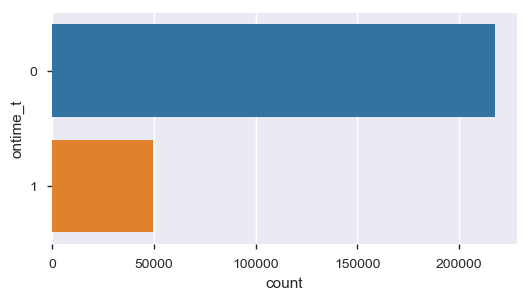

In [34]:
# Target Variable ontime_t 
count, ax = plt.subplots(figsize=(6,3))
c_palette = ['tab:blue', 'tab:orange']
categorical_summarized(df1, y = 'ontime_t', palette=c_palette)
plt.show()

In [35]:
# Creating another column for the new binned attribute source_t
df1["source_t"]=df1["source"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,longitude,ward,neighborhood,reason,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,-71.0558,Ward 16,Dorchester,Animal Issues,NaN,NaT,2017-12-13 21:25:00,NaT,0,Constituent Call


In [36]:
## Viewing the unique values for the source
df1.source.unique()

array(['Constituent Call', 'Employee Generated', 'Self Service',
       'Citizens Connect App', 'City Worker App', 'Twitter',
       'Maximo Integration'], dtype=object)

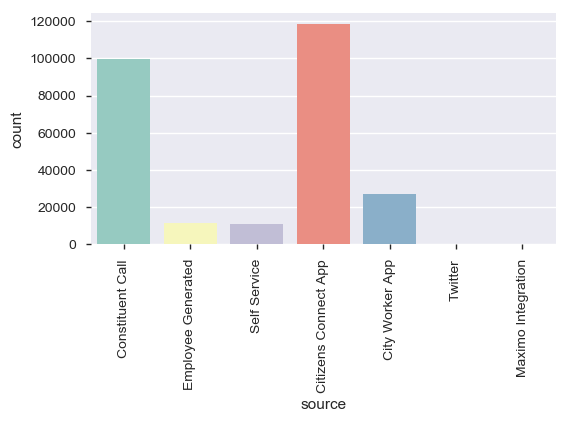

In [37]:
## SNS Countplot for the source variable
count, ax = plt.subplots(figsize=(6,3))
g=sns.countplot(x="source", data=df1, palette="Set3")
for item in g.get_xticklabels():
    item.set_rotation(90)

In [38]:
## Binnng the source_t into seven numerical bins
df1.source_t[df1.source == "Citizens Connect App"] = 1
df1.source_t[df1.source == "City Worker App"] = 2
df1.source_t[df1.source == "Constituent Call"] = 3
df1.source_t[df1.source == "Employee Generated"] = 4
df1.source_t[df1.source == "Maximo Integration"] = 5
df1.source_t[df1.source == "Self Service"] = 6
df1.source_t[df1.source == "Twitter"] = 7

df1.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,longitude,ward,neighborhood,reason,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,-71.0558,Ward 16,Dorchester,Animal Issues,NaN,NaT,2017-12-13 21:25:00,NaT,0,3
593771,OVERDUE,Constituent Call,,,Mayor's 24 Hour Hotline,,INFO,,,General Comments For a Program or Policy,...,-71.0587,,,Employee & General Comments,NaN,NaT,2017-10-10 14:15:00,2017-10-24 14:15:00,1,3
593828,OVERDUE,Constituent Call,,,Mayor's 24 Hour Hotline,,INFO,,,General Comments For a Program or Policy,...,-71.0587,,,Employee & General Comments,NaN,NaT,2017-10-27 22:11:00,2017-11-14 08:30:00,1,3


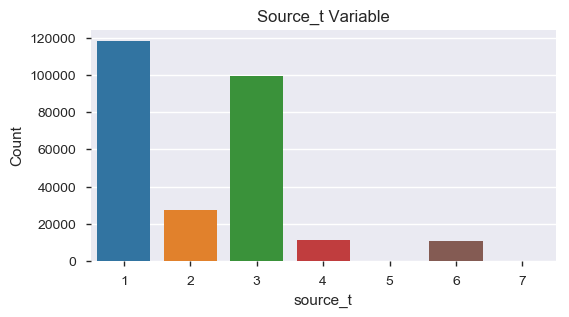

In [39]:
# Printing the Bar and Count Plot for Source_t Variable 
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('source_t', data=df1)
ax.set_title('Source_t Variable')
ax.set_xlabel('source_t')
ax.set_ylabel('Count')

plt.show()

In [40]:
# Cross Tabulation for Categorical souce_t variable and target variable "ontime"

source=pd.crosstab(df1.ontime_t, df1.source_t, margins=True)
source

source_t,1,2,3,4,5,6,7,All
ontime_t,,,,,,,,
0,95911,24985,77948,9306,2,9401,52,217605
1,22520,2287,21637,1994,0,1254,15,49707
All,118431,27272,99585,11300,2,10655,67,267312


In [41]:
# Creating another column for the new binned source_t2 attribute
df1["source_t2"]=df1["source_t"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,ward,neighborhood,reason,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t,source_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,Ward 16,Dorchester,Animal Issues,NaN,NaT,2017-12-13 21:25:00,NaT,0,3,3


In [42]:
## Binning the rare source_t variables 5 and 7 to 6
df1.source_t2[df1.source_t == 5] = 6
df1.source_t2[df1.source_t == 7] = 6

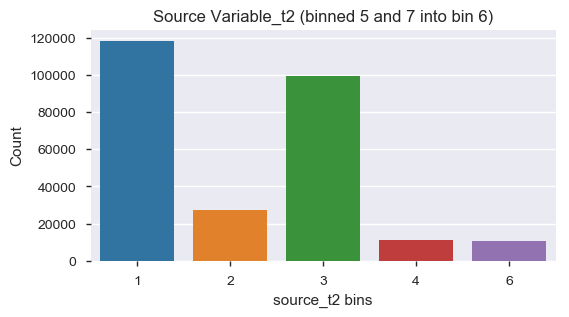

In [43]:
# Printing the Bar and Count Plot for the source_t2
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('source_t2', data=df1)
ax.set_title('Source Variable_t2 (binned 5 and 7 into bin 6)')
ax.set_xlabel('source_t2 bins')
ax.set_ylabel('Count')

plt.show()

In [44]:
# Cross Tabulation for Categorical souce_t2 variable and target variale "ontime"

source=pd.crosstab(df1.ontime_t, df1.source_t2, margins=True)
source

source_t2,1,2,3,4,6,All
ontime_t,,,,,,
0,95911,24985,77948,9306,9455,217605
1,22520,2287,21637,1994,1269,49707
All,118431,27272,99585,11300,10724,267312


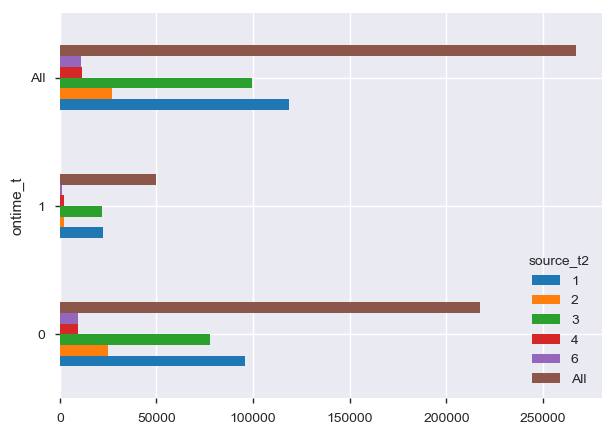

In [45]:
## Plotting the cross tab distribution for source_t2
source.plot.barh(figsize=(7,5))
plt.show()

In [46]:
########################################################################

In [47]:
## Viewing the unique values for the city_council_district
df1.city_council_district.unique()

array(['3', ' ', '9', '2', '5', '8', '7', '1', '4', '6', '0'],
      dtype=object)

In [48]:
## Replacing the nan values with 33
df1['city_council_district'] = df1['city_council_district'].replace(np.nan, 33)

In [49]:
## Binning the missing variables "" to the 33 bin and will be the standard missing bin number
df1.city_council_district[df1.city_council_district == ' '] = 33

In [50]:
## Viewing the unique values for the city_council_district
df1.city_council_district.unique()

array(['3', 33, '9', '2', '5', '8', '7', '1', '4', '6', '0'], dtype=object)

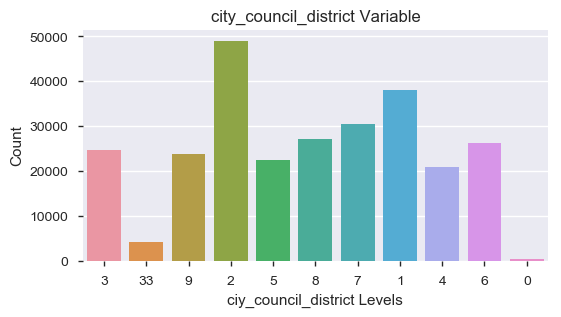

In [51]:
# Printing the Bar and Count Plot for city_council_district
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('city_council_district', data=df1)
ax.set_title('city_council_district Variable')
ax.set_xlabel('ciy_council_district Levels')
ax.set_ylabel('Count')

plt.show()

In [52]:
# Cross Tabulation for Categorical city council district and target variale "ontime_t"
city_council=pd.crosstab(df1.ontime_t, df1.city_council_district, margins=True)
city_council

city_council_district,33,0,1,2,3,4,5,6,7,8,9,All
ontime_t,,,,,,,,,,,,
0,2896,244,31850,40916,20206,16772,18159,20713,24237,22182,19430,217605
1,1320,139,6168,8109,4520,4106,4349,5630,6236,4861,4269,49707
All,4216,383,38018,49025,24726,20878,22508,26343,30473,27043,23699,267312


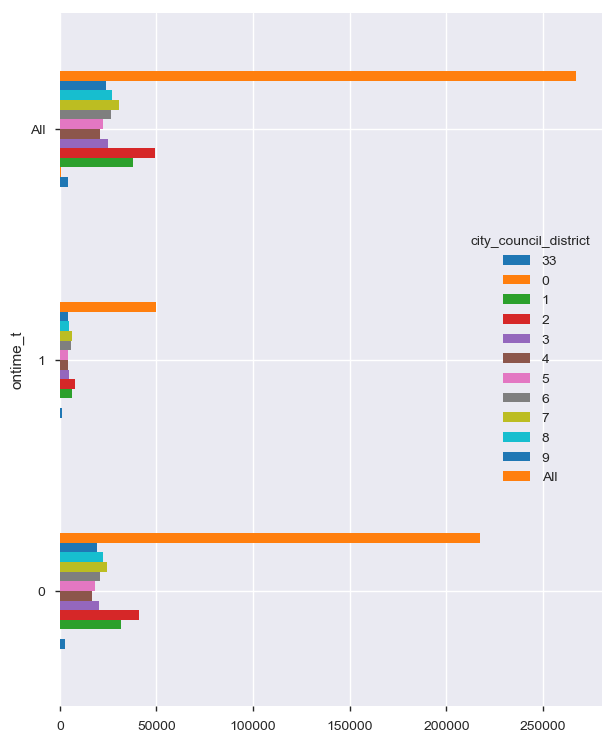

In [53]:
## Plotting the cross tab distribution for city council district
city_council.plot.barh(figsize=(7,9))
plt.show()

In [54]:
# Creating another column for the new binned source_t2 attribute
df1["city_council_district_t"]=df1["city_council_district"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,neighborhood,reason,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t,source_t2,city_council_district_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,Dorchester,Animal Issues,NaN,NaT,2017-12-13 21:25:00,NaT,0,3,3,3


In [55]:
## Binning the 0 with 33 because its a rare event for city council district
df1.city_council_district_t[df1.city_council_district == "0"] = 33

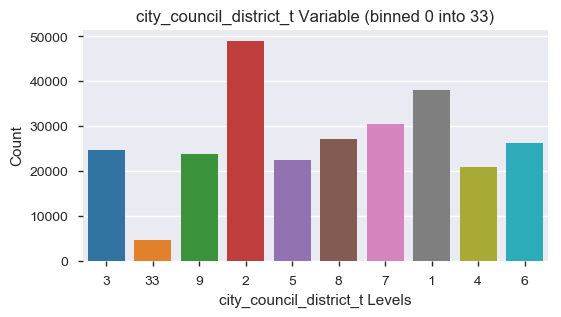

In [56]:
# Printing the Bar and Count Plot for city_council_district_t
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('city_council_district_t', data=df1)
ax.set_title('city_council_district_t Variable (binned 0 into 33)')
ax.set_xlabel('city_council_district_t Levels')
ax.set_ylabel('Count')

plt.show()

In [57]:
# Cross Tabulation for Categorical city council district_t and target variable "ontime_t"
city_council2=pd.crosstab(df1.ontime_t, df1.city_council_district_t, margins=True)
city_council2

city_council_district_t,33,1,2,3,4,5,6,7,8,9,All
ontime_t,,,,,,,,,,,
0,3140,31850,40916,20206,16772,18159,20713,24237,22182,19430,217605
1,1459,6168,8109,4520,4106,4349,5630,6236,4861,4269,49707
All,4599,38018,49025,24726,20878,22508,26343,30473,27043,23699,267312


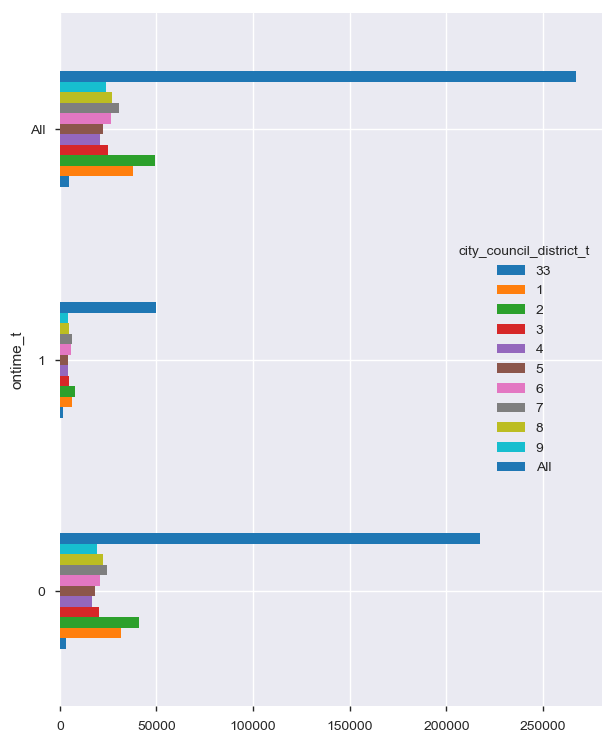

In [58]:
## Plotting the cross tab distribution for city council district_t
city_council2.plot.barh(figsize=(7,9))
plt.show()

In [59]:
########################################  Fire District Variable ########################################

In [60]:
## Viewing the unique values for the Fire District
df1.fire_district.unique()

array(['8', ' ', '11', '4', '9', '1', '3', '7', '12', '6', nan, '10'],
      dtype=object)

In [61]:
## Replacing the empty values with NAN for fire district
df1.replace(' ', np.nan, inplace=True)

In [62]:
## Viewing the unique values for the Fire District
df1.fire_district.unique()

array(['8', nan, '11', '4', '9', '1', '3', '7', '12', '6', '10'],
      dtype=object)

In [63]:
## Replacing the nan values with 33
df1['fire_district'] = df1['fire_district'].replace(np.nan, 33)

In [64]:
## Viewing the unique values for the Fire District
df1.fire_district.unique()

array(['8', 33, '11', '4', '9', '1', '3', '7', '12', '6', '10'],
      dtype=object)

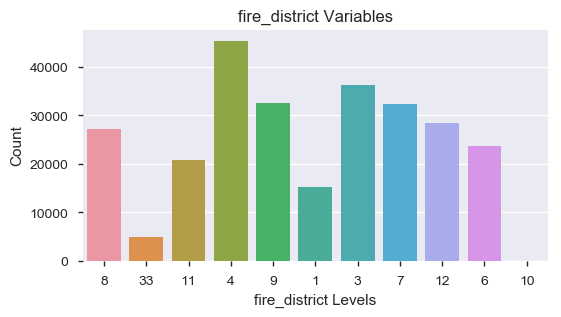

In [65]:
# Printing the Bar and Count Plot for Fire District Variable
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('fire_district', data=df1)
ax.set_title('fire_district Variables')
ax.set_xlabel('fire_district Levels')
ax.set_ylabel('Count')

plt.show()

In [66]:
# Cross Tabulation for Categorical Variable fire district and target variale "ontime_t"
fire_dist=pd.crosstab(df1.ontime_t, df1.fire_district, margins=True)
fire_dist

fire_district,33,1,10,11,12,3,4,6,7,8,9,All
ontime_t,,,,,,,,,,,,
0,3456,12796,2,17132,23009,30114,37197,19958,26689,21679,25573,217605
1,1537,2348,0,3760,5498,6285,8251,3735,5743,5444,7106,49707
All,4993,15144,2,20892,28507,36399,45448,23693,32432,27123,32679,267312


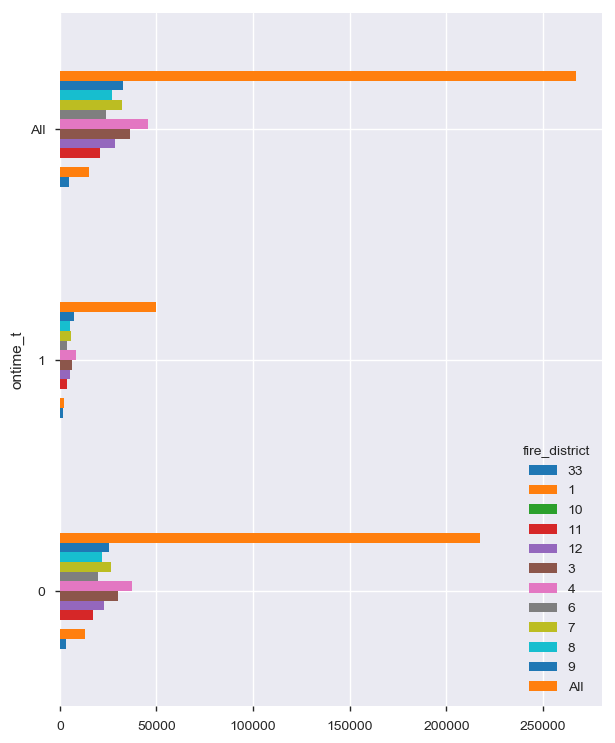

In [67]:
## Plotting the cross tab distribution for fire_district
fire_dist.plot.barh(figsize=(7,9))
plt.show()

In [68]:
# Creating another column for the binning of 33 and 10 for fire_district
df1["fire_district_t"]=df1["fire_district"]
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,reason,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,Animal Issues,NaN,NaT,2017-12-13 21:25:00,NaT,0,3,3,3,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,NaN,INFO,NaN,NaN,General Comments For a Program or Policy,...,Employee & General Comments,NaN,NaT,2017-10-10 14:15:00,2017-10-24 14:15:00,1,3,3,33,33


In [69]:
## Binning the level 10 fire district with the 33 level
df1.fire_district_t[df1.fire_district == "10"] = 33

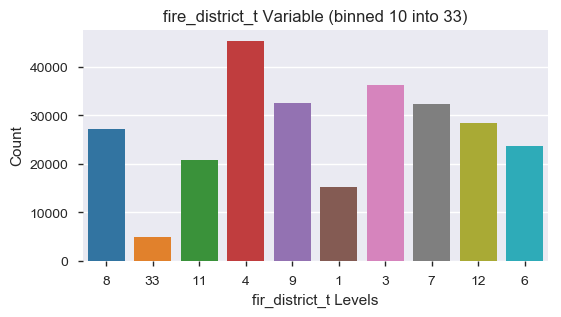

In [70]:
# Printing the Bar and Count Plot for fire_district_t
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('fire_district_t', data=df1)
ax.set_title('fire_district_t Variable (binned 10 into 33)')
ax.set_xlabel('fir_district_t Levels')
ax.set_ylabel('Count')

plt.show()

In [71]:
# Cross Tabulation for Categorical Variable fire district_t and target variale "ontime_t"
fire_dist2=pd.crosstab(df1.ontime_t, df1.fire_district_t, margins=True)
fire_dist2

fire_district_t,33,1,11,12,3,4,6,7,8,9,All
ontime_t,,,,,,,,,,,
0,3458,12796,17132,23009,30114,37197,19958,26689,21679,25573,217605
1,1537,2348,3760,5498,6285,8251,3735,5743,5444,7106,49707
All,4995,15144,20892,28507,36399,45448,23693,32432,27123,32679,267312


In [72]:
# Creating another column for the new binned variable for Fire District into two districts
df1["fire_district_t2"]=df1["fire_district"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,NaN,NaT,2017-12-13 21:25:00,NaT,0,3,3,3,8,8


In [73]:
## Dividing the fire districts into the Division 1 and 2 for Boston
## Please note that the missing values and 10 were grouped into Distict 2
df1.fire_district_t2[df1.fire_district == "1"] = 1
df1.fire_district_t2[df1.fire_district == "3"] = 1
df1.fire_district_t2[df1.fire_district == "4"] = 1
df1.fire_district_t2[df1.fire_district == "6"] = 1
df1.fire_district_t2[df1.fire_district == "11"] = 1

df1.fire_district_t2[df1.fire_district == "7"] = 2
df1.fire_district_t2[df1.fire_district == "8"] = 2
df1.fire_district_t2[df1.fire_district == "9"] = 2
df1.fire_district_t2[df1.fire_district == "12"] = 2
df1.fire_district_t2[df1.fire_district == "10"] = 2
df1.fire_district_t2[df1.fire_district == 33] = 2

df1.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto,closed_dt,open_dt,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,NaN,NaT,2017-12-13 21:25:00,NaT,0,3,3,3,8,2
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,NaN,INFO,NaN,NaN,General Comments For a Program or Policy,...,NaN,NaT,2017-10-10 14:15:00,2017-10-24 14:15:00,1,3,3,33,33,2
593828,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,NaN,INFO,NaN,NaN,General Comments For a Program or Policy,...,NaN,NaT,2017-10-27 22:11:00,2017-11-14 08:30:00,1,3,3,33,33,2


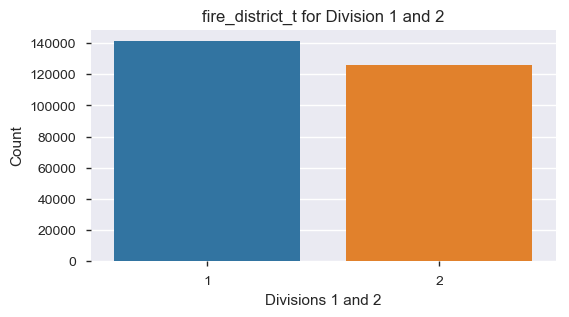

In [74]:
# Printing the Bar and Count Plot for two districts for fire_district and target variable ontime_t
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('fire_district_t2', data=df1)
ax.set_title('fire_district_t for Division 1 and 2')
ax.set_xlabel('Divisions 1 and 2')
ax.set_ylabel('Count')

plt.show()

In [75]:
# Cross Tabulation for Categorical Variable fire district_t2
fire_dist3=pd.crosstab(df1.ontime_t, df1.fire_district_t2, margins=True)
fire_dist3

fire_district_t2,1,2,All
ontime_t,,,
0,117197,100408,217605
1,24379,25328,49707
All,141576,125736,267312


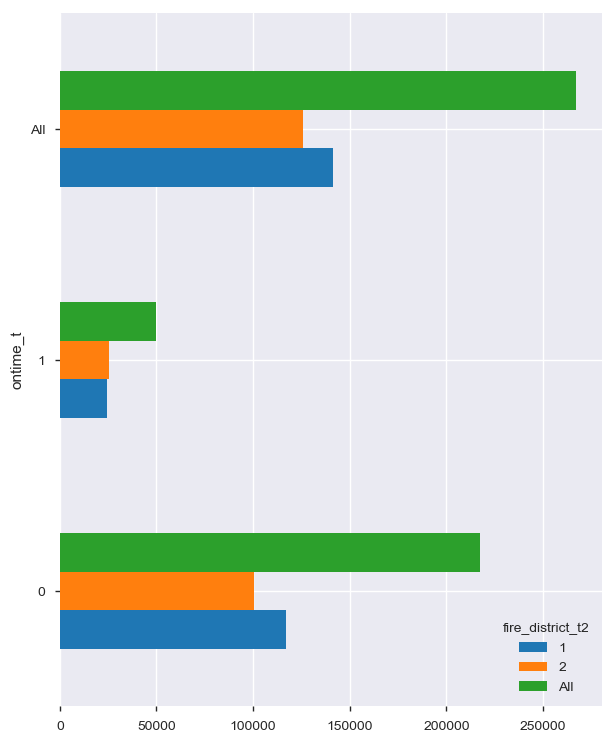

In [76]:
## Plotting the cross tab distribution for fire_district_t2
fire_dist3.plot.barh(figsize=(7,9))
plt.show()

In [77]:
######################################################### Subject  ###############################

In [78]:
## Viewing the unique values for subject attribute
df1.subject.unique()

array(['Animal Control', "Mayor's 24 Hour Hotline",
       'Inspectional Services', 'Public Works Department',
       'Boston Water & Sewer Commission', 'Property Management',
       'Transportation - Traffic Division',
       'Parks & Recreation Department', 'Boston Police Department',
       'Neighborhood Services', 'Consumer Affairs & Licensing'],
      dtype=object)

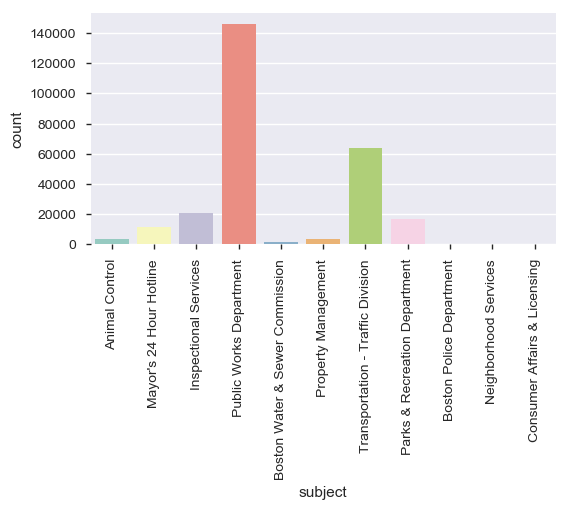

In [79]:
## SNS Countplot for the subject variable
count, ax = plt.subplots(figsize=(6,3))
g=sns.countplot(x="subject", data=df1, palette="Set3")
for item in g.get_xticklabels():
    item.set_rotation(90)

In [80]:
# Creating another column for the new binned subject variable
df1["subject_t"]=df1["subject"]
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,closed_dt,open_dt,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,NaT,2017-12-13 21:25:00,NaT,0,3,3,3,8,2,Animal Control
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,NaN,INFO,NaN,NaN,General Comments For a Program or Policy,...,NaT,2017-10-10 14:15:00,2017-10-24 14:15:00,1,3,3,33,33,2,Mayor's 24 Hour Hotline


In [81]:
## Creating a unique number or bin for each of the 11 subject categories
df1.subject_t[df1.subject == "Animal Control"] = 1
df1.subject_t[df1.subject == "Boston Police Department"] = 2
df1.subject_t[df1.subject == "Boston Water & Sewer Commission"] = 3
df1.subject_t[df1.subject == "Consumer Affairs & Licensing"] = 4
df1.subject_t[df1.subject == "Inspectional Services"] = 5
df1.subject_t[df1.subject == "Mayor's 24 Hour Hotline"] = 6
df1.subject_t[df1.subject == "Neighborhood Services"] = 7
df1.subject_t[df1.subject == "Parks & Recreation Department"] = 8
df1.subject_t[df1.subject == "Property Management"] = 9
df1.subject_t[df1.subject == "Public Works Department"] = 10
df1.subject_t[df1.subject == "Transportation - Traffic Division"] = 11

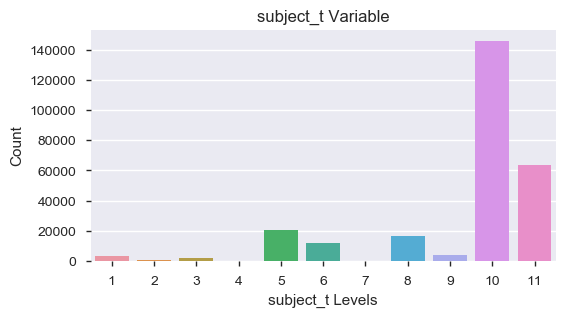

In [82]:
# Printing the Bar and Count Plot for subject_t variable
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('subject_t', data=df1)
ax.set_title('subject_t Variable')
ax.set_xlabel('subject_t Levels')
ax.set_ylabel('Count')

plt.show()

In [83]:
# Cross Tabulation for Categorical Variable  subject_t and target variale "ontime_t"
subject=pd.crosstab(df1.ontime_t, df1.subject_t, margins=True)
subject

subject_t,1,2,3,4,5,6,7,8,9,10,11,All
ontime_t,,,,,,,,,,,,
0,3242,215,1609,41,10923,10631,28,13548,2516,121573,53279,217605
1,0,0,0,0,9658,888,0,3081,1050,24587,10443,49707
All,3242,215,1609,41,20581,11519,28,16629,3566,146160,63722,267312


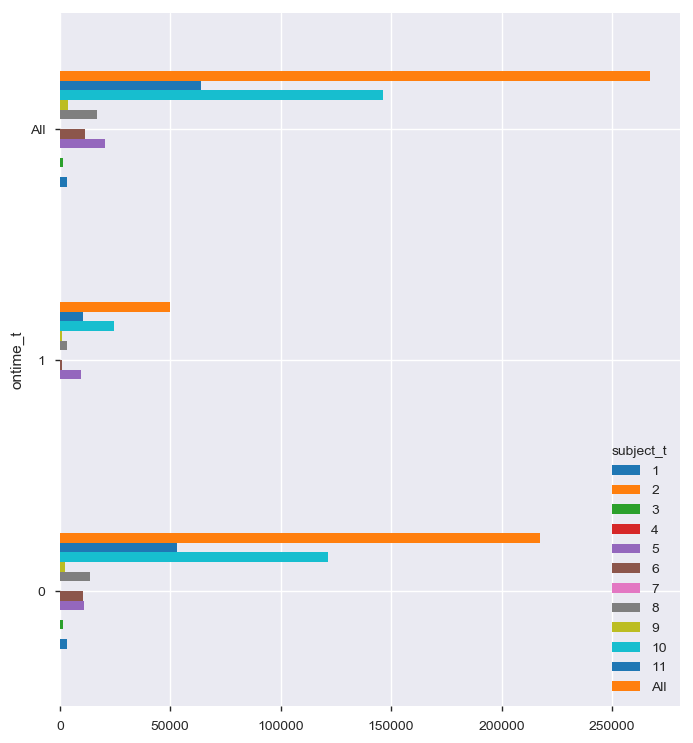

In [84]:
## Plotting the cross tab distribution for subject_t
subject.plot.barh(figsize=(8,9))
plt.show()

In [85]:
# Creating another variable to bin the rare values into the 7 level for subject_t2
df1["subject_t2"]=df1["subject_t"]
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,open_dt,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,2017-12-13 21:25:00,NaT,0,3,3,3,8,2,1,1
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,NaN,INFO,NaN,NaN,General Comments For a Program or Policy,...,2017-10-10 14:15:00,2017-10-24 14:15:00,1,3,3,33,33,2,6,6


In [86]:
## Binning the subject variables 1,2,3,4 into 7
df1.subject_t2[df1.subject_t == 1] = 7
df1.subject_t2[df1.subject_t == 2] = 7
df1.subject_t2[df1.subject_t == 3] = 7
df1.subject_t2[df1.subject_t == 4] = 7

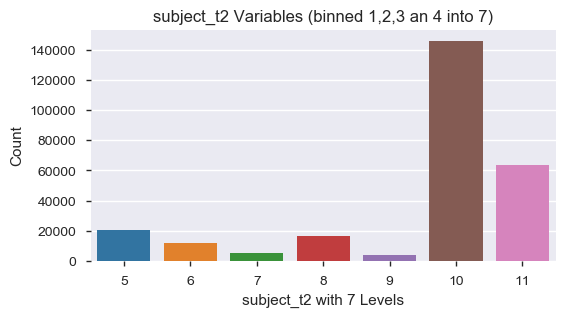

In [94]:
# Printing the Bar and Count Plot for the binned subject_t2 variable
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('subject_t2', data=df1)
ax.set_title('subject_t2 Variables (binned 1,2,3 an 4 into 7)')
ax.set_xlabel('subject_t2 with 7 Levels')
ax.set_ylabel('Count')
plt.show()

In [95]:
#################################### Power District ##############################

In [96]:
## unique values for power district variable 
df1.pwd_district.unique()

array(['7', 33, '4', '1C', '6', '8', '2', '9', '1B', '3', '10A', '10B',
       '1A', '5'], dtype=object)

In [97]:
## replacing the nan values with a "0" for pwd_district
df1['pwd_district'] = df1['pwd_district'].replace(np.nan, 0)

In [98]:
## unique values for pwd_district
df1.pwd_district.unique()

array(['7', 33, '4', '1C', '6', '8', '2', '9', '1B', '3', '10A', '10B',
       '1A', '5'], dtype=object)

In [99]:
## Replacing the nan and 0 value with a number of 33 and will be the missing bin
df1.pwd_district[df1.pwd_district == 0] = 33

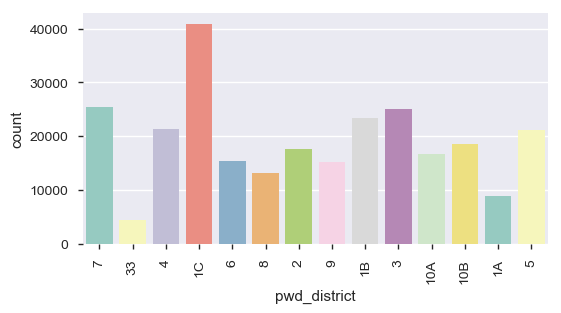

In [100]:
## SNS Countplot for the pwd_district variable
count, ax = plt.subplots(figsize=(6,3))
g=sns.countplot(x="pwd_district", data=df1, palette="Set3")
for item in g.get_xticklabels():
    item.set_rotation(90)

In [101]:
# Creating another column for the pwd_district Variable 
df1["pwd_district_t"]=df1["pwd_district"]
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,NaT,0,3,3,3,8,2,1,7,7
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,NaN,NaN,General Comments For a Program or Policy,...,2017-10-24 14:15:00,1,3,3,33,33,2,6,6,33


In [102]:
## Renaming the Power Districts that have letters to have unique number for Analysis 
df1.pwd_district_t[df1.pwd_district == "1A"] = 20
df1.pwd_district_t[df1.pwd_district == "1B"] = 21
df1.pwd_district_t[df1.pwd_district == "1C"] = 22
df1.pwd_district_t[df1.pwd_district == "10A"] = 23
df1.pwd_district_t[df1.pwd_district == "10B"] = 24
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,target_dt,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,NaT,0,3,3,3,8,2,1,7,7


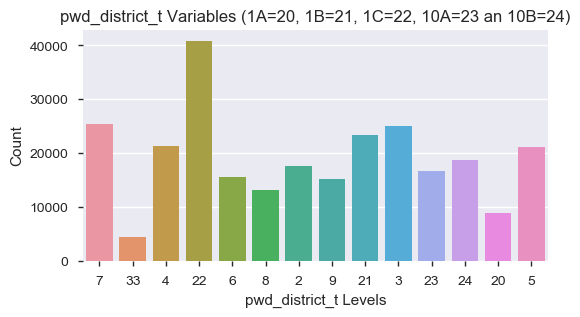

In [103]:
# Printing the Bar and Count Plot for the cleaned pwd_district bin
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('pwd_district_t', data=df1)
ax.set_title('pwd_district_t Variables (1A=20, 1B=21, 1C=22, 10A=23 an 10B=24)')
ax.set_xlabel('pwd_district_t Levels')
ax.set_ylabel('Count')

plt.show()

In [104]:
# Cross Tabulation for Categorical Variable pwd_district_t and target variale "ontime"
power=pd.crosstab(df1.ontime_t, df1.pwd_district_t, margins=True)
power

pwd_district_t,20,21,22,23,24,33,2,3,4,5,6,7,8,9,All
ontime_t,,,,,,,,,,,,,,,
0,6954,19978,33806,12646,15212,3023,13679,20651,17466,17855,12582,20316,10641,12796,217605
1,1870,3451,7068,4034,3422,1400,3958,4416,3895,3299,2893,5102,2551,2348,49707
All,8824,23429,40874,16680,18634,4423,17637,25067,21361,21154,15475,25418,13192,15144,267312


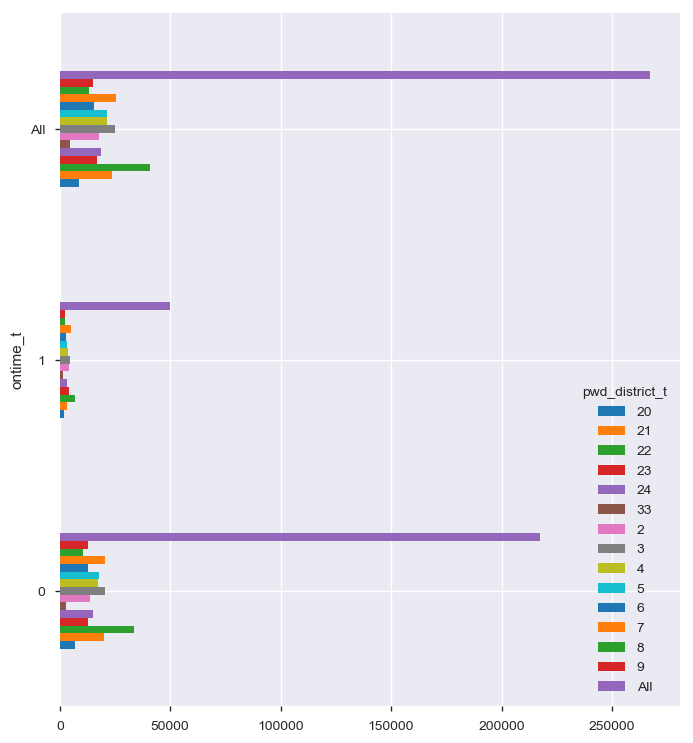

In [105]:
## Plotting the cross tab distribution for pwd_district_t and ontime_t
power.plot.barh(figsize=(8,9))
plt.show()

In [106]:
########################################## Department ###############################################

In [107]:
## unique values for department variable
df1.department.unique()

array(['ANML', 'INFO', 'ISD', 'PWDx', 'BWSC', 'PROP', 'BTDT', 'PARK',
       'GEN_', 'BHA_', 'ONS_', 'DND_', 'BPD_', 'BPS_', 'DISB'],
      dtype=object)

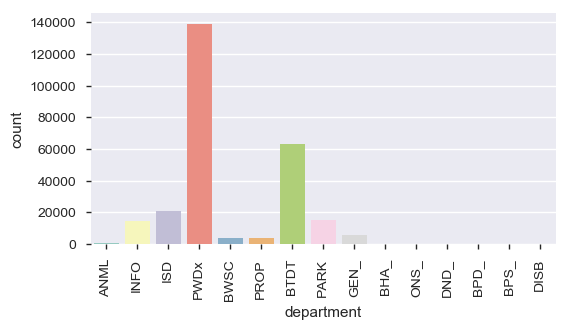

In [108]:
## SNS Countplot for the department variable
count, ax = plt.subplots(figsize=(6,3))
g=sns.countplot(x="department", data=df1, palette="Set3")
for item in g.get_xticklabels():
    item.set_rotation(90)

In [109]:
# Creating another column for the department variable
df1["department_t"]=df1["department"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t,department_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,0,3,3,3,8,2,1,7,7,ANML


In [110]:
## Creating a unique number for each department attribute for analysis

df1.department_t[df1.department == "ANML"] = 1
df1.department_t[df1.department == "BHA_"] = 2
df1.department_t[df1.department == "BPD_"] = 3
df1.department_t[df1.department == "BPS_"] = 4
df1.department_t[df1.department == "BTDT"] = 5
df1.department_t[df1.department == "BWSC"] = 6
df1.department_t[df1.department == "DISB"] = 7
df1.department_t[df1.department == "DND_"] = 8
df1.department_t[df1.department == "GEN_"] = 9
df1.department_t[df1.department == "INFO"] = 10
df1.department_t[df1.department == "ISD"] =  11
df1.department_t[df1.department == "ONS_"] = 12
df1.department_t[df1.department == "PARK"] = 13
df1.department_t[df1.department == "PROP"] = 14
df1.department_t[df1.department == "PWDx"] = 15

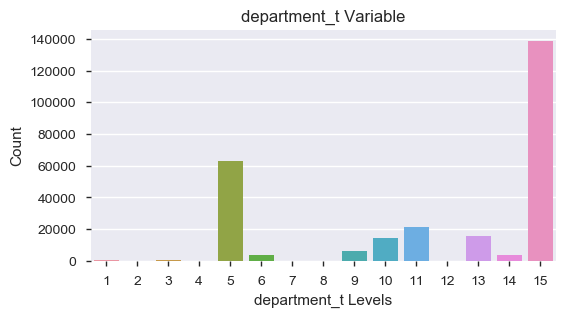

In [111]:
# Printing the Bar and Count Plot for Department Variable
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('department_t', data=df1)
ax.set_title('department_t Variable')
ax.set_xlabel('department_t Levels')
ax.set_ylabel('Count')

plt.show()

In [112]:
# Cross Tabulation for Categorical Department Variable Department Type and target variale "ontime"
department=pd.crosstab(df1.ontime_t, df1.department_t, margins=True)
department

department_t,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,All
ontime_t,,,,,,,,,,,,,,,,
0,533,9,24,10,54857,1679,9,6,5955,5726,11035,33,13309,2529,121891,217605
1,31,60,193,109,8143,2190,8,17,6,8665,10124,60,2017,1142,16942,49707
All,564,69,217,119,63000,3869,17,23,5961,14391,21159,93,15326,3671,138833,267312


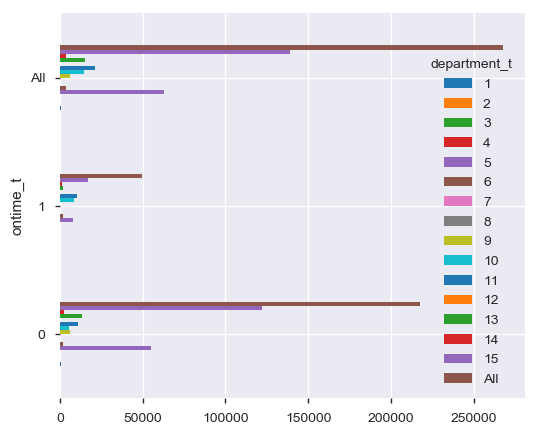

In [113]:
## Plotting the cross tab distribution for department variable 
department.plot.barh(figsize=(6,5))
plt.show()

In [114]:
# Creating another column for binning the department levels with minimal values bin 12
df1["department_t2"]=df1["department_t"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t,department_t,department_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,3,3,3,8,2,1,7,7,1,1


In [115]:
# Binning the department levels 1, 2, 3, 4, 7, 8 into 12 with minimal values to number 7
df1.department_t2[df1.department_t == 1] = 12
df1.department_t2[df1.department_t == 2] = 12
df1.department_t2[df1.department_t == 3] = 12
df1.department_t2[df1.department_t == 4] = 12
df1.department_t2[df1.department_t == 7] = 12
df1.department_t2[df1.department_t == 8] = 12

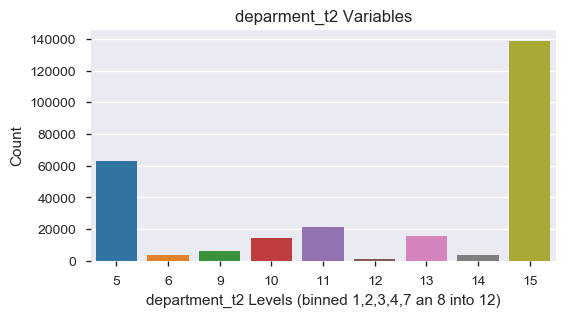

In [116]:
# Printing the Bar and Count Plot for department_t2
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('department_t2', data=df1)
ax.set_title('deparment_t2 Variables')
ax.set_xlabel("department_t2 Levels (binned 1,2,3,4,7 an 8 into 12)")
ax.set_ylabel('Count')

plt.show()

In [117]:
########################################### Neighborhood

In [118]:
## unique values for neighborhood variables
df1.neighborhood_services_district.unique()

array(['7', nan, '15', '4', '6', '10', '14', '13', '1', '9', '8', '3',
       '12', '11', '2', '5', '0'], dtype=object)

In [119]:
## replacing all nan values with the number 33 for this neighborhood variable
df1['neighborhood_services_district'] = df1['neighborhood_services_district'].replace(np.nan, 33)

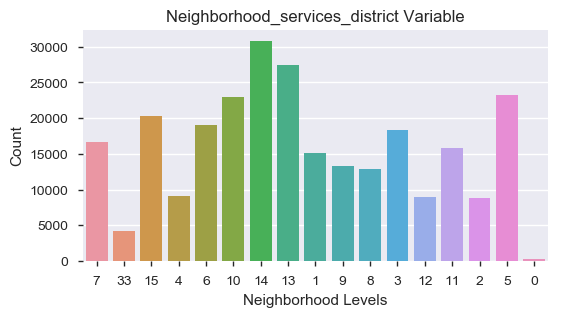

In [120]:
# Printing the Bar and Count Plot for Neighborhood Services District
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('neighborhood_services_district', data=df1)
ax.set_title('Neighborhood_services_district Variable')
ax.set_xlabel('Neighborhood Levels')
ax.set_ylabel('Count')

plt.show()

In [121]:
# Cross Tabulation for Categorical Variable neighborhood services district and target variable ontime
neigh=pd.crosstab(df1.ontime_t, df1.neighborhood_services_district, margins=True)
neigh

neighborhood_services_district,33,0,1,10,11,12,13,14,15,2,3,4,5,6,7,8,9,All
ontime_t,,,,,,,,,,,,,,,,,,
0,2896,150,12796,18630,12041,7301,22204,24807,16731,6951,15264,7386,19558,16199,13397,10748,10546,217605
1,1320,124,2348,4390,3715,1646,5234,6025,3622,1862,3041,1770,3641,2773,3217,2185,2794,49707
All,4216,274,15144,23020,15756,8947,27438,30832,20353,8813,18305,9156,23199,18972,16614,12933,13340,267312


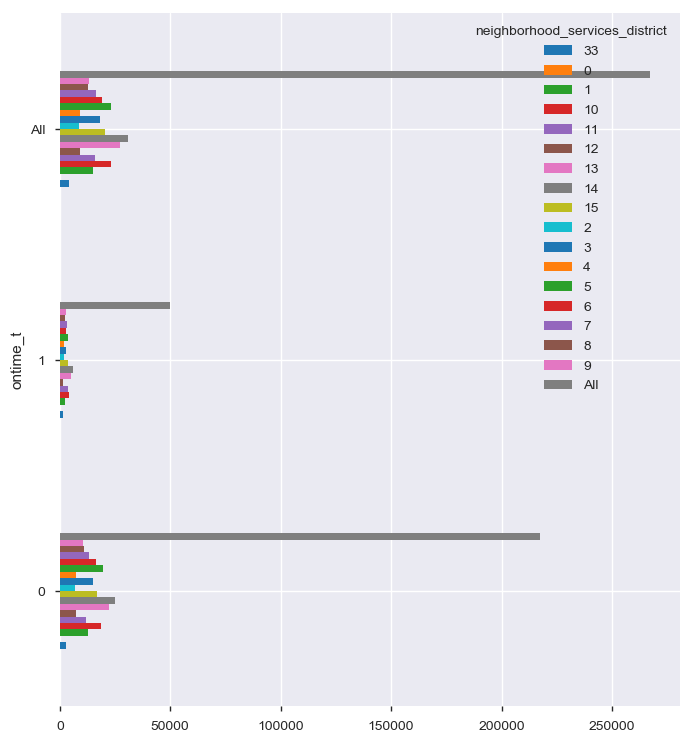

In [122]:
## Plotting the cross tab distribution for neighborhood services district
neigh.plot.barh(figsize=(8,9))
plt.show()

In [123]:
################################################### police district variables #####################################

In [124]:
## unique values for police district variables
df1.police_district.unique()

array(['C11', nan, 'D14', 'D4', 'E5', 'E18', 'B2', 'A7', 'A1', 'B3',
       'E13', 'A15', 'C6'], dtype=object)

In [125]:
## Count for police_distict
df1.police_district.count()

262894

In [126]:
## Creating another variable for the transformed police district variable
df1['police_district'] = df1['police_district'].replace(np.NAN, 33)

In [127]:
## Double checking the count for the police distict
df1.police_district.count()

267312

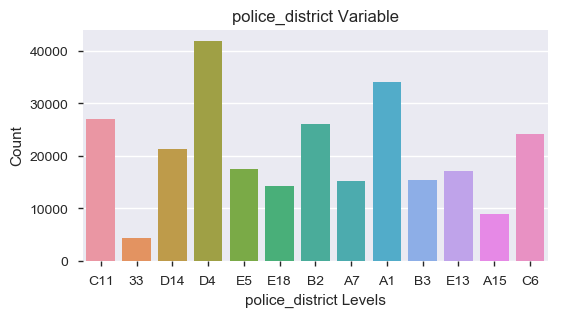

In [128]:
# Printing the Bar and Count Plot for police_district
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('police_district', data=df1)
ax.set_title('police_district Variable')
ax.set_xlabel('police_district Levels')
ax.set_ylabel('Count')

plt.show()

In [129]:
# Creating another column for binning the police_district create unique numbers for analysis 
df1["police_district_t"]=df1["police_district"]
df1.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t,department_t,department_t2,police_district_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,3,3,8,2,1,7,7,1,12,C11
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,3,33,33,2,6,6,33,10,10,33
593828,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,3,33,33,2,6,6,33,10,10,33


In [130]:
## Tranforming the Police Districts to a unique number
df1.police_district_t[df1.police_district == "E5"] = 5
df1.police_district_t[df1.police_district == "E18"] = 18
df1.police_district_t[df1.police_district == "C11"] = 11
df1.police_district_t[df1.police_district == "E13"] = 13
df1.police_district_t[df1.police_district == "D4"] = 4
df1.police_district_t[df1.police_district == "A1"] = 1
df1.police_district_t[df1.police_district == "B2"] = 2
df1.police_district_t[df1.police_district == "C6"] = 6
df1.police_district_t[df1.police_district == "B3"] = 3
df1.police_district_t[df1.police_district == "A7"] = 7
df1.police_district_t[df1.police_district == "A15"] = 15
df1.police_district_t[df1.police_district == "D14"] = 14


df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,source_t2,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t,department_t,department_t2,police_district_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,3,3,8,2,1,7,7,1,12,11
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,3,33,33,2,6,6,33,10,10,33


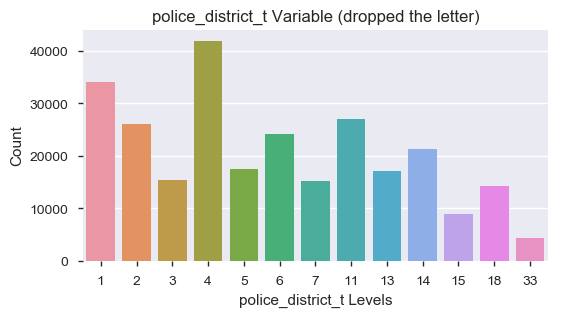

In [131]:
# Printing the Bar and Count Plot for police_district
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('police_district_t', data=df1)
ax.set_title('police_district_t Variable (dropped the letter)')
ax.set_xlabel('police_district_t Levels')
ax.set_ylabel('Count')

plt.show()

In [132]:
# Cross Tabulation for Categorical Police District Variable Type and ontime_t
police=pd.crosstab(df1.ontime_t, df1.police_district_t, margins=True)
police

police_district_t,1,2,3,4,5,6,7,11,13,14,15,18,33,All
ontime_t,,,,,,,,,,,,,,
0,28427,20823,12181,34516,14148,20353,12798,22275,13164,17460,6954,11486,3020,217605
1,5637,5206,3227,7462,3302,3913,2349,4787,3956,3878,1870,2722,1398,49707
All,34064,26029,15408,41978,17450,24266,15147,27062,17120,21338,8824,14208,4418,267312


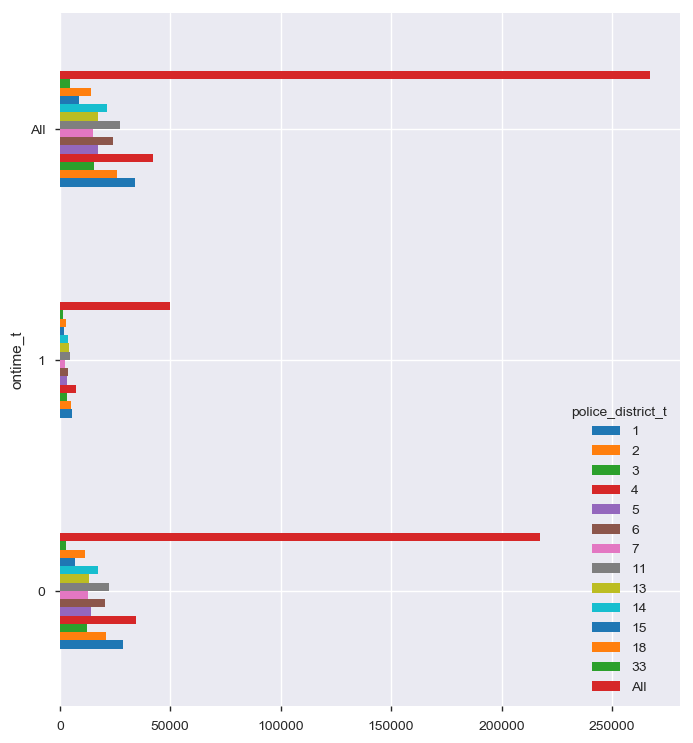

In [133]:
## Plotting the cross tab distribution for Police District Variable Type and ontime_t
police.plot.barh(figsize=(8,9))
plt.show()

In [134]:
########################################### Neighborhood  ###########################################

In [135]:
## Looking at unique neigbhorhood variables
df1.neighborhood.unique()

array(['Dorchester', nan, 'Allston / Brighton', 'South End', 'Roslindale',
       'Back Bay', 'Allston', 'Hyde Park', 'Jamaica Plain', 'East Boston',
       'Beacon Hill', 'Greater Mattapan', 'Roxbury', 'Mission Hill',
       'Boston', 'Charlestown', 'Downtown / Financial District',
       'South Boston / South Boston Waterfront', 'West Roxbury',
       'Fenway / Kenmore / Audubon Circle / Longwood', 'South Boston',
       'Brighton', 'Mattapan', 'Chestnut Hill'], dtype=object)

In [136]:
## Creating another variable for the neigborhood district variable and replacing nan with unknown values
df1['neighborhood'] = df1['neighborhood'].replace(np.nan, 'UNKNOWN')

In [137]:
## printing the unique values found in neighborhood variable.
df1.neighborhood.unique()

array(['Dorchester', 'UNKNOWN', 'Allston / Brighton', 'South End',
       'Roslindale', 'Back Bay', 'Allston', 'Hyde Park', 'Jamaica Plain',
       'East Boston', 'Beacon Hill', 'Greater Mattapan', 'Roxbury',
       'Mission Hill', 'Boston', 'Charlestown',
       'Downtown / Financial District',
       'South Boston / South Boston Waterfront', 'West Roxbury',
       'Fenway / Kenmore / Audubon Circle / Longwood', 'South Boston',
       'Brighton', 'Mattapan', 'Chestnut Hill'], dtype=object)

In [138]:
# Cross Tabulation for Categorical Police District Variable Type ontime_t
neigh=pd.crosstab(df1.ontime_t, df1.neighborhood, margins=True)
neigh

neighborhood,Allston,Allston / Brighton,Back Bay,Beacon Hill,Boston,Brighton,Charlestown,Chestnut Hill,Dorchester,Downtown / Financial District,...,Mattapan,Mission Hill,Roslindale,Roxbury,South Boston,South Boston / South Boston Waterfront,South End,UNKNOWN,West Roxbury,All
ontime_t,,,,,,,,,,,,,,,,,,,,,
0,275,16225,11464,7441,6622,862,6957,16,29799,14999,...,232,4014,7758,20022,1430,16680,13960,3107,7864,217605
1,87,3541,2581,1125,1590,233,1871,3,6624,3195,...,108,1167,1862,4393,346,3090,2257,1433,1798,49707
All,362,19766,14045,8566,8212,1095,8828,19,36423,18194,...,340,5181,9620,24415,1776,19770,16217,4540,9662,267312


In [139]:
 # Creating another column for the new neighborhood variable type for one hot encoding
df1["neighborhood_t"]=df1["neighborhood"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t,department_t,department_t2,police_district_t,neighborhood_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,3,8,2,1,7,7,1,12,11,Dorchester


In [140]:
## One hot encoding for the different neighborhood types found in this dataset 
le = LabelEncoder() 
  
df1['neighborhood_t']= le.fit_transform(df1['neighborhood_t']) 
df1.head(5)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,city_council_district_t,fire_district_t,fire_district_t2,subject_t,subject_t2,pwd_district_t,department_t,department_t2,police_district_t,neighborhood_t
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,3,8,2,1,7,7,1,12,11,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,33,33,2,6,6,33,10,10,33,22
593828,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,33,33,2,6,6,33,10,10,33,22
594133,ONTIME,Constituent Call,9,11,Animal Control,4,ANML,15,D14,Animal Found,...,9,11,1,1,7,4,1,12,14,1
594213,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,33,33,2,6,6,33,10,10,33,22


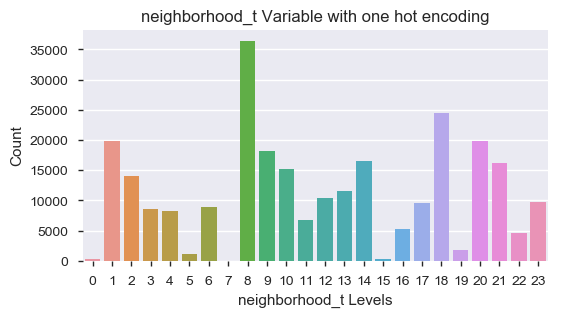

In [141]:
# Printing the Bar and Count Plot for neigborhood_t
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('neighborhood_t', data=df1)
ax.set_title('neighborhood_t Variable with one hot encoding')
ax.set_xlabel('neighborhood_t Levels')
ax.set_ylabel('Count')

plt.show()

In [142]:
# Cross Tabulation for Categorical neighborhood_t variable and ontime_t
neigh_t=pd.crosstab(df1.ontime_t, df1.neighborhood_t, margins=True)
neigh_t

neighborhood_t,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,All
ontime_t,,,,,,,,,,,,,,,,,,,,,
0,275,16225,11464,7441,6622,862,6957,16,29799,14999,...,232,4014,7758,20022,1430,16680,13960,3107,7864,217605
1,87,3541,2581,1125,1590,233,1871,3,6624,3195,...,108,1167,1862,4393,346,3090,2257,1433,1798,49707
All,362,19766,14045,8566,8212,1095,8828,19,36423,18194,...,340,5181,9620,24415,1776,19770,16217,4540,9662,267312


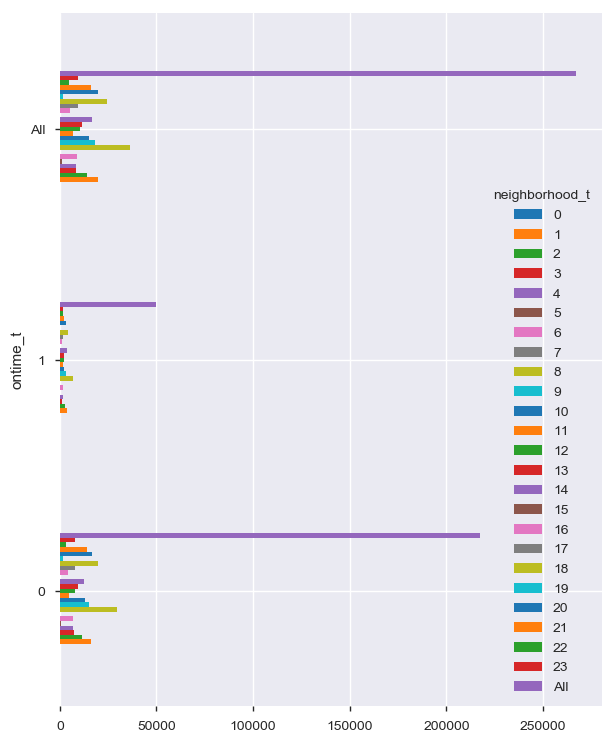

In [143]:
## Plotting the cross tab distribution for neighborhood_t variable and ontime_t
neigh_t.plot.barh(figsize=(7,9))
plt.show()

In [189]:
 # Creating another column for the new neighborhood_t2 variable type for one hot encoding
df1["neighborhood_t2"]=df1["neighborhood_t"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8


In [190]:
## Binning the neighborhood levels to 19
df1.neighborhood_t2[df1.neighborhood_t == 0] = 19
df1.neighborhood_t2[df1.neighborhood_t == 5] = 19
df1.neighborhood_t2[df1.neighborhood_t == 7] = 19
df1.neighborhood_t2[df1.neighborhood_t == 15] = 19
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


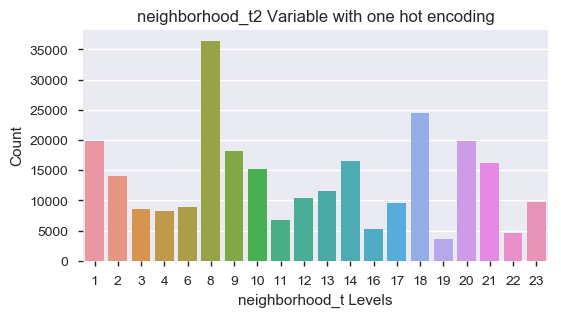

In [192]:
# Printing the Bar and Count Plot for neigborhood_t2
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('neighborhood_t2', data=df1)
ax.set_title('neighborhood_t2 Variable with one hot encoding')
ax.set_xlabel('neighborhood_t Levels')
ax.set_ylabel('Count')

plt.show()

In [193]:
#############################################  ward variable ###################################

In [194]:
## unique values for ward variables
df1.ward.unique()

array(['Ward 16', 'UNKNOWN', 'Ward 22', 'Ward 3', 'Ward 4', 'Ward 20',
       'Ward 5', '21', 'Ward 18', '12', '1', 'Ward 1', '14', 'Ward 14',
       'Ward 15', '20', 'Ward 21', '19', '10', 'Ward 17', 'Ward 10', '4',
       '18', 'Ward 8', '2', 'Ward 6', 'Ward 9', '6', 'Ward 11', '22',
       'Ward 19', 'Ward 7', '5', '15', '9', '3', 'Ward 13', 'Ward 2',
       '11', '7', '13', 'Ward 12', '8', '16', '17', '0'], dtype=object)

In [195]:
## Creating another variable for ward variable and replacing nan with unknown
df1['ward'] = df1['ward'].replace(np.nan, 'UNKNOWN')

In [196]:
## unique values for ward variables
df1.ward.unique()

array(['Ward 16', 'UNKNOWN', 'Ward 22', 'Ward 3', 'Ward 4', 'Ward 20',
       'Ward 5', '21', 'Ward 18', '12', '1', 'Ward 1', '14', 'Ward 14',
       'Ward 15', '20', 'Ward 21', '19', '10', 'Ward 17', 'Ward 10', '4',
       '18', 'Ward 8', '2', 'Ward 6', 'Ward 9', '6', 'Ward 11', '22',
       'Ward 19', 'Ward 7', '5', '15', '9', '3', 'Ward 13', 'Ward 2',
       '11', '7', '13', 'Ward 12', '8', '16', '17', '0'], dtype=object)

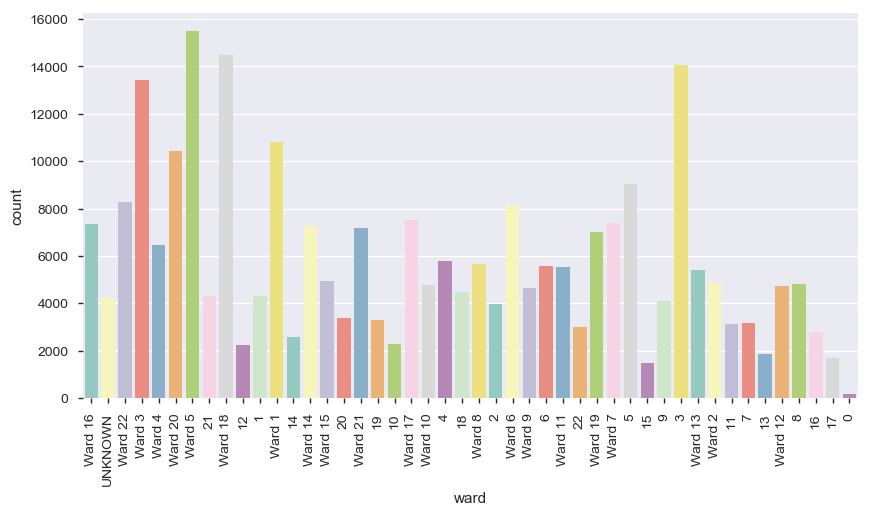

In [197]:
## SNS Countplot for the department variable
count, ax = plt.subplots(figsize=(10,5))
g=sns.countplot(x="ward", data=df1, palette="Set3")
for item in g.get_xticklabels():
    item.set_rotation(90)

In [198]:
 # Creating another column for the new variable ward to do one hot encoding
df1["ward_t"]=df1["ward"]
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,Ward 16,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,UNKNOWN,14,43,0,0,22


In [199]:
## One hot encoding for the different wards found in this dataset 
le = LabelEncoder() 
  
df1['ward_t']= le.fit_transform(df1['ward_t']) 
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


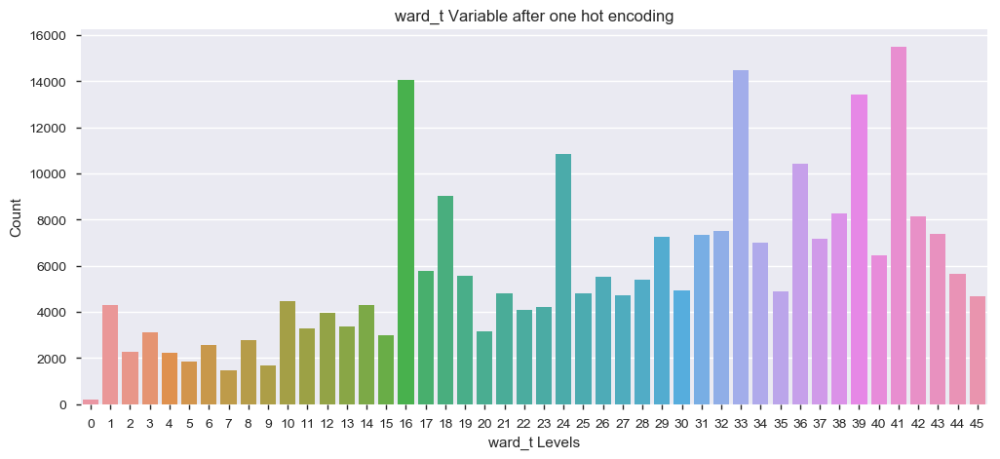

In [200]:
# Printing the Bar and Count Plot for ward_t with one hot encoding
count, ax = plt.subplots(figsize=(12,5))
ax = sns.countplot('ward_t', data=df1)
ax.set_title('ward_t Variable after one hot encoding')
ax.set_xlabel('ward_t Levels')
ax.set_ylabel('Count')

plt.show()

In [201]:
# Cross Tabulation for Categorical ward_t variable and ontime_t

ward_t=pd.crosstab(df1.ontime_t, df1.ward_t, margins=True)
ward_t

ward_t,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,All
ontime_t,,,,,,,,,,,,,,,,,,,,,
0,83,3536,1709,2243,1728,1459,2033,1247,2195,1376,...,6038,6854,11574,5388,13336,7108,6336,4925,3959,217605
1,101,782,581,868,492,381,542,226,569,322,...,1146,1414,1839,1068,2155,1034,1062,717,698,49707
All,184,4318,2290,3111,2220,1840,2575,1473,2764,1698,...,7184,8268,13413,6456,15491,8142,7398,5642,4657,267312


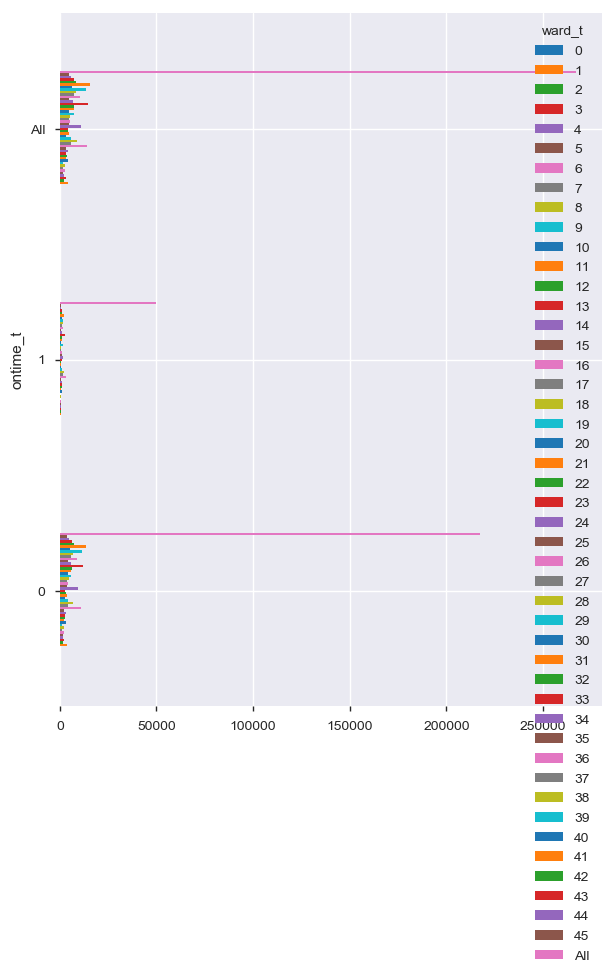

In [202]:
## Plotting the cross tab distribution for ward_t and ontime_t
ward_t.plot.barh(figsize=(7,9))
plt.show()

In [203]:
#################################################  Reason #############################

In [204]:
## unique values for reason variable
df1.reason.unique()

array(['Animal Issues', 'Employee & General Comments', 'Building',
       'Highway Maintenance', 'Administrative & General Requests',
       'Housing', 'Street Lights', 'Environmental Services',
       'Sidewalk Cover / Manhole', 'Fire Department', 'Alert Boston',
       'Code Enforcement', 'Street Cleaning', 'Notification', 'Graffiti',
       'Enforcement & Abandoned Vehicles', 'Sanitation',
       'Signs & Signals', 'Health', 'Park Maintenance & Safety',
       'Abandoned Bicycle', 'Needle Program', 'Catchbasin', 'Recycling',
       'Trees', 'Traffic Management & Engineering', 'Fire Hydrant',
       'Operations', 'Noise Disturbance', 'Parking Complaints',
       'Massport', 'Boston Bikes', 'Generic Noise Disturbance',
       'Weights and Measures', 'Air Pollution Control',
       'Neighborhood Services Issues', 'Cemetery',
       'Office of The Parking Clerk', 'Valet', 'Pothole', 'Programs',
       'Current Events', 'Consumer Affairs Issues', 'Billing',
       'Bridge Maintenance', '

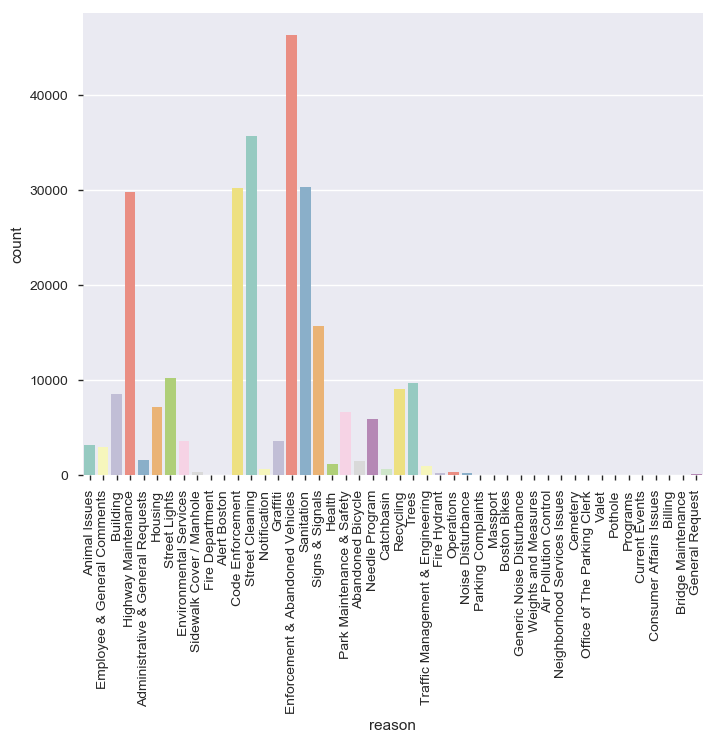

In [205]:
## SNS Countplot for the reason variable
count, ax = plt.subplots(figsize=(8,6))
g=sns.countplot(x="reason", data=df1, palette="Set3")
for item in g.get_xticklabels():
    item.set_rotation(90)

In [206]:
 # Creating another column for the new variable reason for one hot encoding
df1["reason_t"]=df1["reason"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,Animal Issues,7,148,0,8


In [207]:
## One hot encoding for the different ward levels found in this dataset 
le = LabelEncoder() 
  
df1['reason_t']= le.fit_transform(df1['reason_t']) 
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


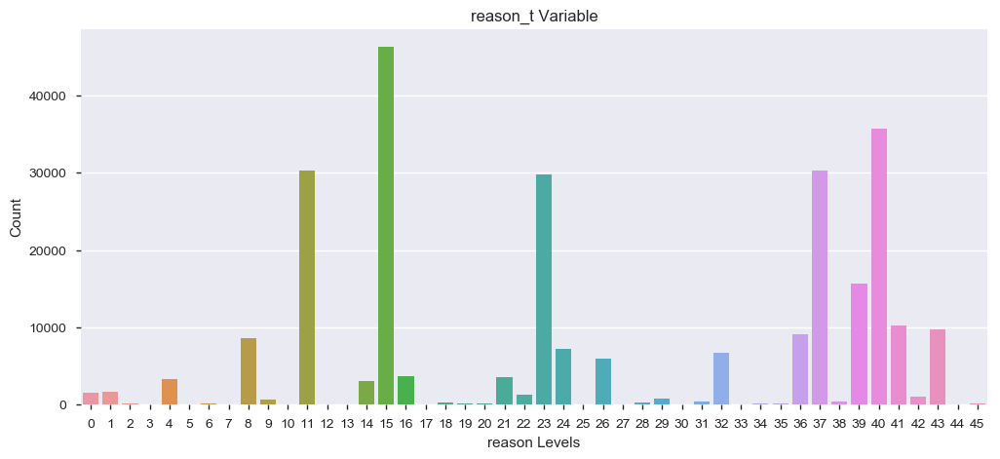

In [208]:
# Printing the Bar and Count Plot for reason_t
count, ax = plt.subplots(figsize=(12,5))
ax = sns.countplot('reason_t', data=df1)
ax.set_title('reason_t Variable')
ax.set_xlabel('reason Levels')
ax.set_ylabel('Count')

plt.show()

In [209]:
# Cross Tabulation for Categorical reason_t Variable Type and ontime_t
reason_t=pd.crosstab(df1.ontime_t, df1.reason_t, margins=True)
reason_t

reason_t,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,All
ontime_t,,,,,,,,,,,,,,,,,,,,,
0,1514,1631,54,35,3242,8,61,4,3983,627,...,29145,393,9824,32137,6547,527,8967,5,37,217605
1,9,15,0,0,0,0,3,0,4534,0,...,1167,0,5874,3546,3657,423,743,4,40,49707
All,1523,1646,54,35,3242,8,64,4,8517,627,...,30312,393,15698,35683,10204,950,9710,9,77,267312


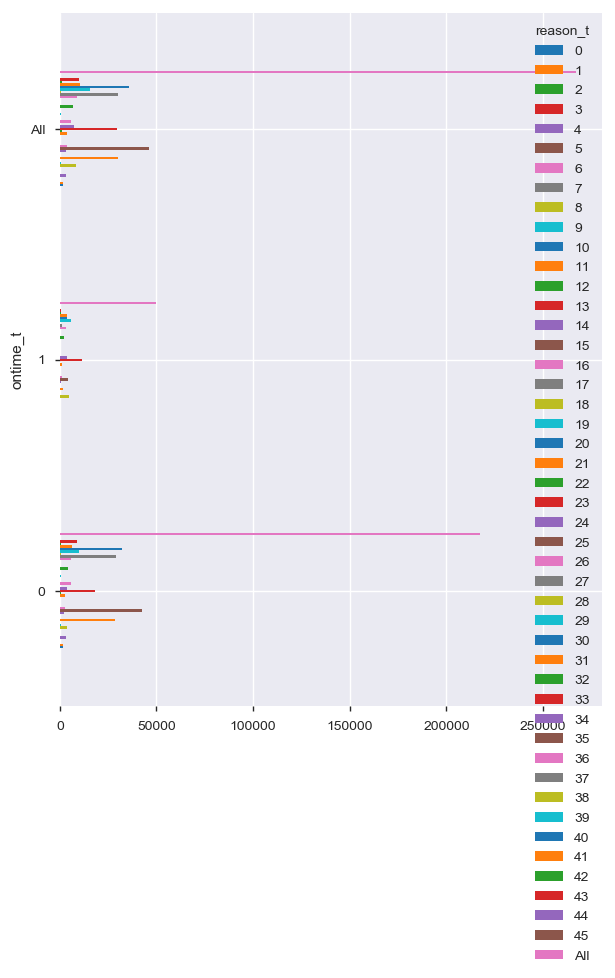

In [210]:
## Plotting the cross tab distribution for reason_t and ontime_t
reason_t.plot.barh(figsize=(7,9))
plt.show()

In [211]:
################################################ type variable ##################################

In [212]:
## unique values for the type variables
df1.type.unique()

array(['Animal Lost', 'General Comments For a Program or Policy',
       'Animal Found', 'Exceeding Terms of Permit', 'Sidewalk Repair',
       'BWSC General Request', 'Unsatisfactory Living Conditions',
       'Heat - Excessive  Insufficient', 'Animal Generic Request',
       'Street Light Knock Downs', 'Mice Infestation - Residential',
       'Animal Noise Disturbances', 'Misc. Snow Complaint',
       'Maintenance Complaint - Residential', 'Rodent Activity',
       'Sidewalk Cover / Manhole', 'Fire Department Request',
       'Sidewalk Repair (Make Safe)', 'Work w/out Permit', 'Alert Boston',
       'Unshoveled Sidewalk', 'General Comments For An Employee',
       'PWD Graffiti', 'Requests for Street Cleaning', 'Bed Bugs',
       'Notification', 'Improper Storage of Trash (Barrels)',
       'Street Light Outages', 'Pick up Dead Animal', 'Graffiti Removal',
       'Parking Enforcement', 'Utility Casting Repair',
       'Empty Litter Basket', 'Transportation General Request',
       'C

In [213]:
 # Creating another column for the new variable type_t
df1["type_t"]=df1["type"]
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,Animal Lost,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,General Comments For a Program or Policy,0,0,22


In [214]:
## One hot encoding for the different attribute types found in this dataset 
le = LabelEncoder() 
  
df1['type_t']= le.fit_transform(df1['type_t']) 
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


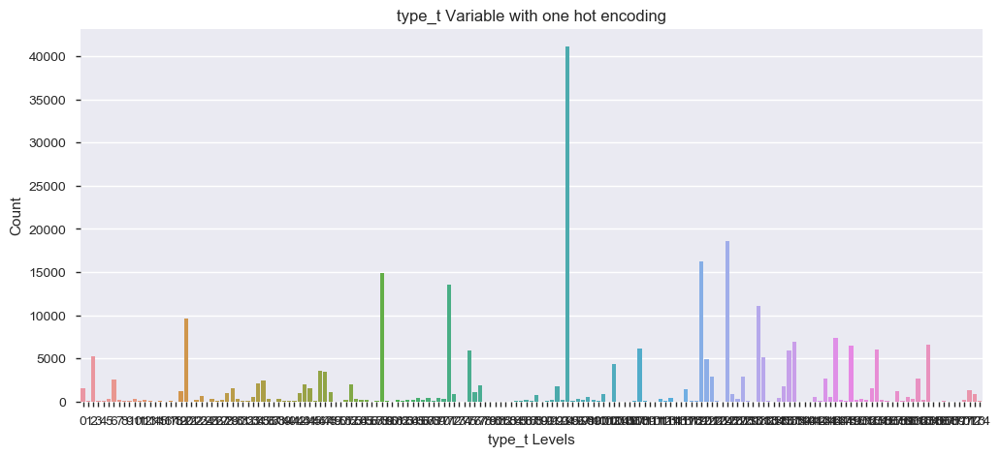

In [215]:
# Printing the Bar and Count Plot for type_t Variable
count, ax = plt.subplots(figsize=(12,5))
ax = sns.countplot('type_t', data=df1)
ax.set_title('type_t Variable with one hot encoding')
ax.set_xlabel('type_t Levels')
ax.set_ylabel('Count')

plt.show()

In [216]:
# Cross Tabulation for Categorical type_t and ontime_t
type_t=pd.crosstab(df1.ontime_t, df1.type_t, margins=True)
type_t

type_t,0,1,2,3,4,5,6,7,8,9,...,166,167,168,169,170,171,172,173,174,All
ontime_t,,,,,,,,,,,,,,,,,,,,,
0,1514,50,2854,28,35,303,2603,226,110,40,...,7,129,5,2,1,152,302,846,18,217605
1,9,86,2331,0,0,0,0,0,0,0,...,1,1,4,0,0,94,964,14,28,49707
All,1523,136,5185,28,35,303,2603,226,110,40,...,8,130,9,2,1,246,1266,860,46,267312


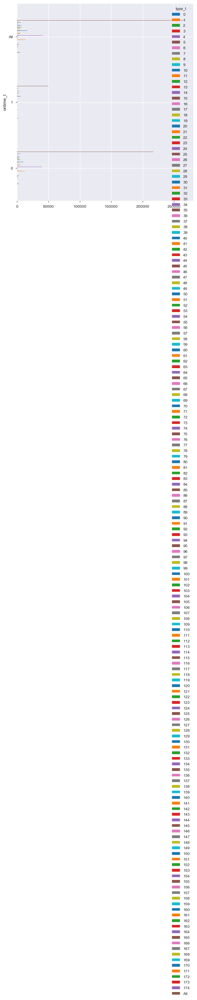

In [217]:
## Plotting the cross tab distribution for type_t variable and ontime_t
type_t.plot.barh(figsize=(8,9))
plt.show()

In [218]:
############################################ precinct variable ######################################################

In [219]:
## unique values for precinct variables
df1.precinct.unique()

array(['1606', 33, '2203', '307', '401', '2001', '508', '2108', '1806',
       '1608', '1207', '108', '106', '504', '1410', '1407', '306', '1509',
       '2006', '2110', '111', '1814', '1815', '1913', '1401', '1007',
       '1820', '2107', '1703', '2106', '1802', '1004', '1710', '408',
       '1609', '107', '1808', '807', '206', '301', '1604', '1504', '605',
       '304', '507', '501', '905', '2002', '904', '2202', '103', '1108',
       '505', '1906', '2111', '709', '1803', '509', '1908', '1714',
       '2205', '403', '502', '506', '2013', '110', '1902', '303', '902',
       '1907', '1009', '305', '1203', '1309', '2204', '802', '1809',
       '203', '1106', '1201', '2115', '1612', '302', '402', '503', '703',
       '601', '1903', '1104', '2208', '407', '1310', '901', '405', '705',
       '708', '702', '0502001', '609', '1103', '2114', '1101', '706',
       '1813', '308', '2016', '1105', '2207', '201', '2003', '1701',
       '406', '2018', '1110', '2012', '1308', '2113', '803', '2211',


In [220]:
## Replacing nan with 33 for precinct
df1['precinct'] = df1['precinct'].replace(np.nan, 33)
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


In [221]:
## Replacing the precinct with a letter with a unique number only
df1.precinct[df1.precinct == "0502A"] = "0502001"

In [222]:
## creating another column for the transformed precinct variable
df1["precinct_t"]=df1["precinct"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,1606,0,8


In [223]:
# Converting the objects to a number for precinct for analysis
cols = ['precinct_t']  # We don't want to convert the Final grade column.
for col in cols:  # Iterate over chosen columns
    df1[col] = pd.to_numeric(df1[col])

In [224]:
## One hot encoding for the precinct levels found in this dataset 
le = LabelEncoder() 
  
df1['precinct_t']= le.fit_transform(df1['precinct_t']) 
df1.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


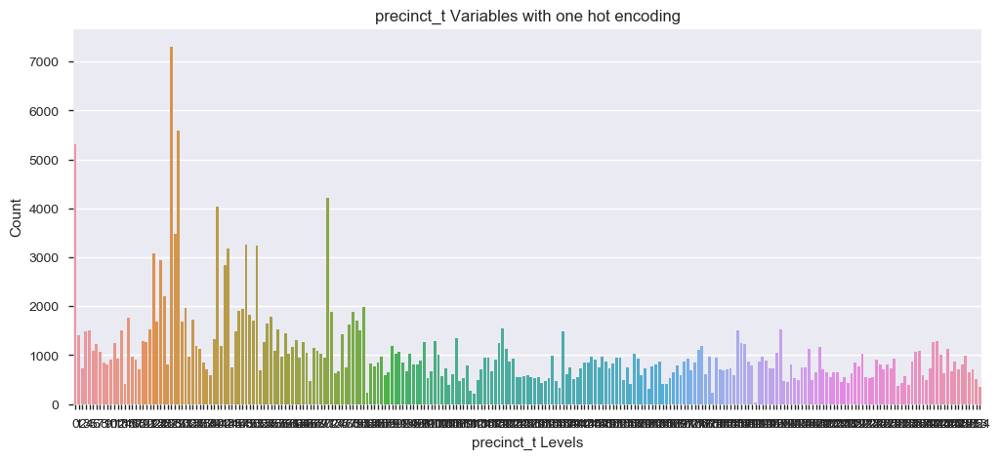

In [225]:
# Printing the Bar and Count Plot for type_t Variable
count, ax = plt.subplots(figsize=(12,5))
ax = sns.countplot('precinct_t', data=df1)
ax.set_title('precinct_t Variables with one hot encoding')
ax.set_xlabel('precinct_t Levels')
ax.set_ylabel('Count')

plt.show()

In [226]:
############################  photosubmissions #######################################

In [227]:
# Looking at the submitted photo attribute
df1.submittedphoto.tail(3)

906665                                                  NaN
906666    https://311.boston.gov/media/boston/report/pho...
906667    https://311.boston.gov/media/boston/report/pho...
Name: submittedphoto, dtype: object

In [228]:
# Creating another column for the new binned category for submitted photo
df1["submittedphoto_t"]=df1["submittedphoto"]
df1.head(1)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,NaN,8


In [229]:
## Replacing the NAN with a 0
df1['submittedphoto_t'] = df1['submittedphoto_t'].replace(np.NaN, 0)

In [230]:
## Looking at the tail distribution for the submittedphoto dataset 
df1.submittedphoto_t.tail(5)

906663    https://311.boston.gov/media/boston/report/pho...
906664    https://311.boston.gov/media/boston/report/pho...
906665                                                    0
906666    https://311.boston.gov/media/boston/report/pho...
906667    https://311.boston.gov/media/boston/report/pho...
Name: submittedphoto_t, dtype: object

In [231]:
## Describe statement for the submitted photos. 
df1.submittedphoto_t.describe()

count     267312
unique    106685
top            0
freq      160620
Name: submittedphoto_t, dtype: int64

In [232]:
## Replacing all http values with a 1 value 
df1.submittedphoto_t[df1.submittedphoto_t != 0] = 1

In [233]:
## Making sure the submittedphoto_t variable is unique
df1.submittedphoto_t.unique()

array([0, 1], dtype=object)

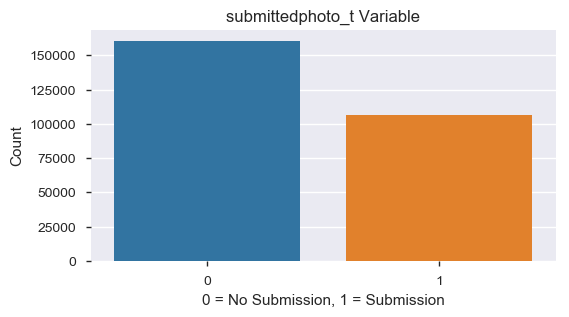

In [234]:
# Printing the Bar and Count Plot for submitted photos
count, ax = plt.subplots(figsize=(6,3))
ax = sns.countplot('submittedphoto_t', data=df1)
ax.set_title('submittedphoto_t Variable')
ax.set_xlabel('0 = No Submission, 1 = Submission')
ax.set_ylabel('Count')

plt.show()

In [235]:
## Saving the cleaned and transformed dataframe to CSV FILE. 
submit=pd.DataFrame(data=df1)
submit.to_csv('clean_311boston.csv', index=True)

In [236]:
################################################################################################################

In [237]:
## creating a time dataframe
df_timeb=df1
df_timeb.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,department_t,department_t2,police_district_t,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2
592709,ONTIME,Constituent Call,3,8,Animal Control,7,ANML,7,C11,Animal Lost,...,1,12,11,8,31,4,7,148,0,8
593771,OVERDUE,Constituent Call,33,33,Mayor's 24 Hour Hotline,33,INFO,33,33,General Comments For a Program or Policy,...,10,10,33,22,23,14,43,0,0,22


In [238]:
## column check for the new df_time
df_timeb.columns

Index(['ontime', 'source', 'city_council_district', 'fire_district', 'subject',
       'pwd_district', 'department', 'neighborhood_services_district',
       'police_district', 'type', 'precinct', 'latitude', 'longitude', 'ward',
       'neighborhood', 'reason', 'submittedphoto', 'closed_dt', 'open_dt',
       'target_dt', 'ontime_t', 'source_t', 'source_t2',
       'city_council_district_t', 'fire_district_t', 'fire_district_t2',
       'subject_t', 'subject_t2', 'pwd_district_t', 'department_t',
       'department_t2', 'police_district_t', 'neighborhood_t', 'ward_t',
       'reason_t', 'type_t', 'precinct_t', 'submittedphoto_t',
       'neighborhood_t2'],
      dtype='object')

In [239]:
## Checking to see if all missing values were dropped when removing nan for closed_dt
df_timeb.dropna(subset=['closed_dt'], inplace=True)
df_timeb.count()

ontime                            235329
source                            235329
city_council_district             235329
fire_district                     235329
subject                           235329
pwd_district                      235329
department                        235329
neighborhood_services_district    235329
police_district                   235329
type                              235329
precinct                          235329
latitude                          235329
longitude                         235329
ward                              235329
neighborhood                      235329
reason                            235329
submittedphoto                     98015
closed_dt                         235329
open_dt                           235329
target_dt                         207386
ontime_t                          235329
source_t                          235329
source_t2                         235329
city_council_district_t           235329
fire_district_t 

In [240]:
## Checking to see if all missing values were dropped for removing nan for target_dt
df_timeb.dropna(subset=['target_dt'], inplace=True)
df_timeb.count()

ontime                            207386
source                            207386
city_council_district             207386
fire_district                     207386
subject                           207386
pwd_district                      207386
department                        207386
neighborhood_services_district    207386
police_district                   207386
type                              207386
precinct                          207386
latitude                          207386
longitude                         207386
ward                              207386
neighborhood                      207386
reason                            207386
submittedphoto                     93441
closed_dt                         207386
open_dt                           207386
target_dt                         207386
ontime_t                          207386
source_t                          207386
source_t2                         207386
city_council_district_t           207386
fire_district_t 

In [241]:
# Cross Tabulation for Categorical Department Variable Department Type and target variable "ontime"
depart_time=pd.crosstab(df_timeb.ontime_t, df_timeb.department, margins=True)
depart_time

department,ANML,BHA_,BPD_,BPS_,BTDT,BWSC,DISB,DND_,GEN_,INFO,ISD,ONS_,PARK,PROP,PWDx,All
ontime_t,,,,,,,,,,,,,,,,
0,1,0,0,2,52789,12,6,2,29,847,9334,1,11215,2421,102559,179218
1,1,1,2,1,6957,26,4,0,6,511,4022,0,1765,1030,13842,28168
All,2,1,2,3,59746,38,10,2,35,1358,13356,1,12980,3451,116401,207386


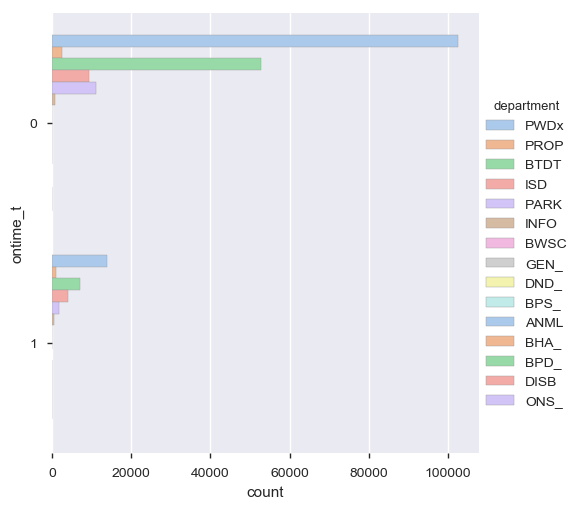

In [242]:
## Barplot and Countplot in Seaborn for department
sns.catplot(y="ontime_t", 
            hue="department", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df_timeb);

In [243]:
# Cross Tabulation for Categorical subject Variable and target variable "ontime_t"
subject_time=pd.crosstab(df_timeb.ontime_t, df_timeb.subject, margins=True)
subject_time

subject,Inspectional Services,Mayor's 24 Hour Hotline,Parks & Recreation Department,Property Management,Public Works Department,Transportation - Traffic Division,All
ontime_t,,,,,,,
0,9236,1225,11285,2410,102426,52636,179218
1,3584,84,1499,941,14986,7074,28168
All,12820,1309,12784,3351,117412,59710,207386


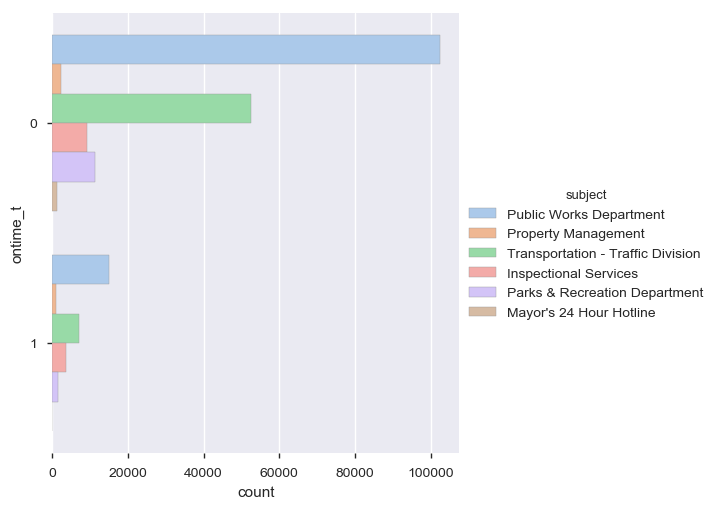

In [244]:
## Barplot and Countplot in Seaborn for subject and ontime_t
sns.catplot(y="ontime_t", 
            hue="subject", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df_timeb);

In [245]:
## Creating a time differential for closed time minus target time
df_timeb['close_target_diff'] = (df_timeb['closed_dt'] - df_timeb['target_dt']).dt.days
df_timeb['close_open_diff'] = (df_timeb['closed_dt'] - df_timeb['open_dt']).dt.days
df_timeb['target_open_diff'] = (df_timeb['target_dt'] - df_timeb['open_dt']).dt.days
df_timeb.head(5)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,neighborhood_t,ward_t,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff
606536,ONTIME,Citizens Connect App,1,3,Public Works Department,1B,PWDx,3,A1,Improper Storage of Trash (Barrels),...,3,39,11,58,27,1,3,-3,0,3
606537,ONTIME,Employee Generated,7,9,Public Works Department,10A,PWDx,13,D4,Street Light Outages,...,4,17,41,146,37,0,4,-17,0,16
606538,ONTIME,Constituent Call,6,9,Public Works Department,6,PWDx,10,E5,Pick up Dead Animal,...,17,13,40,103,205,0,17,-3,0,2
606540,ONTIME,Constituent Call,3,8,Public Works Department,7,PWDx,7,C11,Street Light Outages,...,8,31,41,146,151,0,8,-14,2,16
606541,OVERDUE,Citizens Connect App,1,1,Property Management,9,PROP,1,A7,Graffiti Removal,...,10,1,21,46,7,1,10,67,134,67


In [246]:
## Calculating a time stamp for the week. 
df_timeb['week']=df_timeb['open_dt'].dt.week
df_timeb['day']=df_timeb['open_dt'].dt.day
df_timeb['day_of_week'] = df_timeb['open_dt'].dt.day_name()
df_timeb.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,type_t,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week
606536,ONTIME,Citizens Connect App,1,3,Public Works Department,1B,PWDx,3,A1,Improper Storage of Trash (Barrels),...,58,27,1,3,-3,0,3,39,1,Sunday
606537,ONTIME,Employee Generated,7,9,Public Works Department,10A,PWDx,13,D4,Street Light Outages,...,146,37,0,4,-17,0,16,39,1,Sunday
606538,ONTIME,Constituent Call,6,9,Public Works Department,6,PWDx,10,E5,Pick up Dead Animal,...,103,205,0,17,-3,0,2,39,1,Sunday


In [247]:
## creating a new attribute called day_of_week_t
df_timeb['day_of_week_t']= df_timeb['day_of_week']
df_timeb.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606536,ONTIME,Citizens Connect App,1,3,Public Works Department,1B,PWDx,3,A1,Improper Storage of Trash (Barrels),...,27,1,3,-3,0,3,39,1,Sunday,Sunday
606537,ONTIME,Employee Generated,7,9,Public Works Department,10A,PWDx,13,D4,Street Light Outages,...,37,0,4,-17,0,16,39,1,Sunday,Sunday


In [248]:
# Binning the department levels 1, 2, 3, 4, 7, 8 into 12 with minimal values to number 7
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Monday']= 1
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Tuesday']= 2
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Wednesday']= 3
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Thursday']= 4
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Friday']= 5
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Saturday']= 6
df_timeb.day_of_week_t[df_timeb.day_of_week == 'Sunday']= 7

df_timeb.head(4)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606536,ONTIME,Citizens Connect App,1,3,Public Works Department,1B,PWDx,3,A1,Improper Storage of Trash (Barrels),...,27,1,3,-3,0,3,39,1,Sunday,7
606537,ONTIME,Employee Generated,7,9,Public Works Department,10A,PWDx,13,D4,Street Light Outages,...,37,0,4,-17,0,16,39,1,Sunday,7
606538,ONTIME,Constituent Call,6,9,Public Works Department,6,PWDx,10,E5,Pick up Dead Animal,...,205,0,17,-3,0,2,39,1,Sunday,7
606540,ONTIME,Constituent Call,3,8,Public Works Department,7,PWDx,7,C11,Street Light Outages,...,151,0,8,-14,2,16,39,1,Sunday,7


In [249]:
# Binning 10, 12 and 33 to District 2
df1.fire_district_t2[df1.fire_district == "12"] = 2
df1.fire_district_t2[df1.fire_district == "10"] = 2
df1.fire_district_t2[df1.fire_district == 33] = 2

df1.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606536,ONTIME,Citizens Connect App,1,3,Public Works Department,1B,PWDx,3,A1,Improper Storage of Trash (Barrels),...,27,1,3,-3,0,3,39,1,Sunday,7
606537,ONTIME,Employee Generated,7,9,Public Works Department,10A,PWDx,13,D4,Street Light Outages,...,37,0,4,-17,0,16,39,1,Sunday,7
606538,ONTIME,Constituent Call,6,9,Public Works Department,6,PWDx,10,E5,Pick up Dead Animal,...,205,0,17,-3,0,2,39,1,Sunday,7


In [250]:
## Separating the df_time into ontime or overdue categories for analysis 
on_time = df_timeb[df_timeb['ontime_t']== 0]
on_time.count()

ontime                            179218
source                            179218
city_council_district             179218
fire_district                     179218
subject                           179218
pwd_district                      179218
department                        179218
neighborhood_services_district    179218
police_district                   179218
type                              179218
precinct                          179218
latitude                          179218
longitude                         179218
ward                              179218
neighborhood                      179218
reason                            179218
submittedphoto                     84495
closed_dt                         179218
open_dt                           179218
target_dt                         179218
ontime_t                          179218
source_t                          179218
source_t2                         179218
city_council_district_t           179218
fire_district_t 

In [251]:
## Separating the df_time into ontime_t or overdue categories for analysis 
over_time = df_timeb[df_timeb['ontime_t']== 1]
over_time.count()

ontime                            28168
source                            28168
city_council_district             28168
fire_district                     28168
subject                           28168
pwd_district                      28168
department                        28168
neighborhood_services_district    28168
police_district                   28168
type                              28168
precinct                          28168
latitude                          28168
longitude                         28168
ward                              28168
neighborhood                      28168
reason                            28168
submittedphoto                     8946
closed_dt                         28168
open_dt                           28168
target_dt                         28168
ontime_t                          28168
source_t                          28168
source_t2                         28168
city_council_district_t           28168
fire_district_t                   28168


In [252]:
## Describe statement for on_time
on_time.describe()

,latitude,longitude,ontime_t,source_t,source_t2,neighborhood_t,ward_t,reason_t,type_t,precinct_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day
count,179218.000000,179218.000000,179218.0,179218.000000,179218.000000,179218.000000,179218.000000,179218.000000,179218.000000,179218.000000,179218.000000,179218.000000,179218.000000,179218.00000,179218.00000,179218.00000
mean,42.336440,-71.076875,0.0,1.971789,1.971593,11.484656,27.540850,25.757201,95.881195,99.353681,11.571271,-22.804043,4.082737,26.64705,26.13430,15.35574
std,0.031602,0.032988,0.0,1.147681,1.146900,6.682233,11.984909,12.289709,40.228481,75.027203,6.682614,87.836494,24.144635,96.21250,14.56271,8.89524
min,42.231500,-71.185400,0.0,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,-720.000000,0.000000,0.00000,1.00000,1.00000
25%,42.316600,-71.090600,0.0,1.000000,1.000000,8.000000,18.000000,15.000000,71.000000,34.000000,8.000000,-4.000000,0.000000,1.00000,13.00000,8.00000
50%,42.347200,-71.064900,0.0,2.000000,2.000000,10.000000,30.000000,23.000000,94.000000,77.000000,10.000000,-2.000000,0.000000,2.00000,27.00000,15.00000
75%,42.359400,-71.058700,0.0,3.000000,3.000000,18.000000,38.000000,40.000000,125.000000,162.000000,18.000000,-1.000000,0.000000,5.00000,38.00000,23.00000
max,42.394800,-70.994900,0.0,7.000000,6.000000,23.000000,45.000000,45.000000,174.000000,254.000000,23.000000,0.000000,593.000000,721.00000,52.00000,31.00000


In [253]:
## Describe statment for the over_time
over_time.describe()

,latitude,longitude,ontime_t,source_t,source_t2,neighborhood_t,ward_t,reason_t,type_t,precinct_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day
count,28168.000000,28168.000000,28168.0,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000,28168.000000
mean,42.333269,-71.079240,1.0,2.187340,2.186985,11.515301,26.150277,27.606326,103.536531,106.818162,11.619355,35.357320,50.547536,15.121166,23.965599,15.145094
std,0.033348,0.032856,0.0,1.216804,1.215545,6.459971,11.776457,11.353559,48.640478,75.366312,6.461607,75.818496,90.693498,38.927510,15.161637,8.754710
min,42.232300,-71.176300,1.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-1.000000,1.000000,1.000000
25%,42.309600,-71.096600,1.0,1.000000,1.000000,8.000000,16.000000,16.000000,71.000000,40.000000,8.000000,1.000000,3.000000,1.000000,11.000000,7.000000
50%,42.346100,-71.066200,1.0,2.000000,2.000000,11.000000,28.000000,24.000000,121.000000,91.000000,11.000000,6.000000,18.000000,5.000000,23.000000,15.000000
75%,42.359400,-71.058700,1.0,3.000000,3.000000,18.000000,36.000000,39.000000,138.000000,174.000000,18.000000,31.000000,50.000000,16.000000,37.000000,23.000000
max,42.395100,-70.996200,1.0,7.000000,6.000000,23.000000,45.000000,45.000000,174.000000,254.000000,23.000000,722.000000,738.000000,365.000000,52.000000,31.000000


In [254]:
## Grouping the on_time by day_of_week and close_open_diff
time1A=on_time.groupby(['subject'])['close_open_diff'].mean()
time1A

subject
Inspectional Services                 9.715461
Mayor's 24 Hour Hotline               1.201633
Parks & Recreation Department        39.943022
Property Management                  11.568880
Public Works Department               0.990627
Transportation - Traffic Division     1.147352
Name: close_open_diff, dtype: float64

In [255]:
## dataframe check
type(time1A)

pandas.core.series.Series

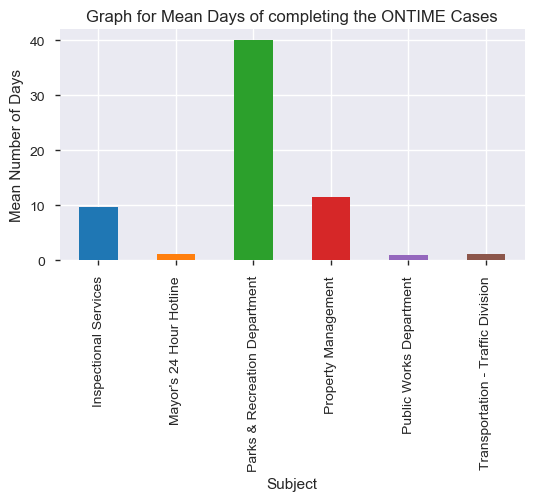

In [256]:
## Plotting the mean days for the analysis 
count, ax = plt.subplots(figsize=(6,3))
ax = time1A.plot.bar(x='subject', y='val', rot=90)
ax.set_title('Graph for Mean Days of completing the ONTIME Cases')
ax.set_xlabel('Subject')
ax.set_ylabel('Mean Number of Days')
plt.show()

In [257]:
## Grouping the over_time cases by subject and close_open_diff
time1B=over_time.groupby(['subject'])['close_open_diff'].mean()
time1B

subject
Inspectional Services                 69.267578
Mayor's 24 Hour Hotline               76.071429
Parks & Recreation Department         87.511674
Property Management                  169.802338
Public Works Department               36.484052
Transportation - Traffic Division     46.856658
Name: close_open_diff, dtype: float64

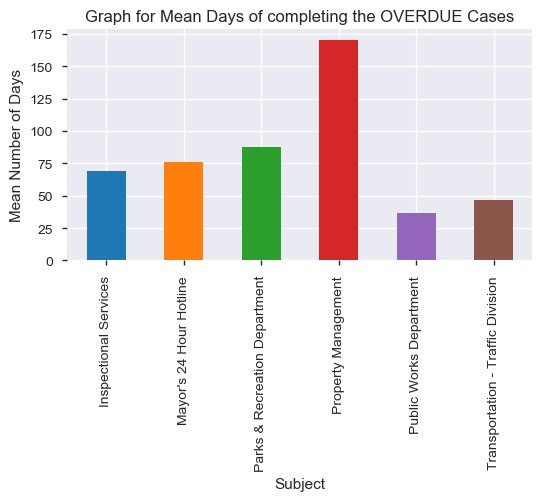

In [258]:
## Creating the countplot for subject by overdue cases
count, ax = plt.subplots(figsize=(6,3))
ax = time1B.plot.bar(x='subject', y='val', rot=90)
ax.set_title('Graph for Mean Days of completing the OVERDUE Cases')
ax.set_xlabel('Subject')
ax.set_ylabel('Mean Number of Days')
plt.show()

In [259]:
## Grouping the over_time cases by department and close_open_diff
time2A=on_time.groupby(['department'])['close_open_diff'].mean()
time2A

department
ANML     0.000000
BPS_     0.500000
BTDT     1.154237
BWSC     0.416667
DISB     2.000000
DND_     1.500000
GEN_     0.172414
INFO     0.889020
ISD      9.650846
ONS_     1.000000
PARK    40.031654
PROP    11.532838
PWDx     1.004612
Name: close_open_diff, dtype: float64

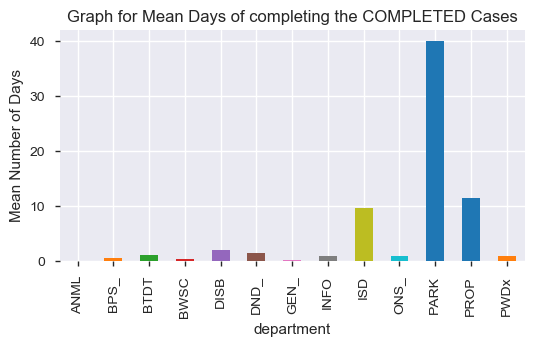

In [260]:
## Graphing the group by function for department and completed cases
count, ax = plt.subplots(figsize=(6,3))
ax = time2A.plot.bar(x='department', y='val', rot=90)
ax.set_title('Graph for Mean Days of completing the COMPLETED Cases')
ax.set_xlabel('department')
ax.set_ylabel('Mean Number of Days')
plt.show()

In [261]:
## Grouping the over_time by department and close_open_diff for overtime cases
time2B=over_time.groupby(['department'])['close_open_diff'].mean()
time2B

department
ANML      5.000000
BHA_      2.000000
BPD_     32.500000
BPS_     59.000000
BTDT     47.576829
BWSC     16.076923
DISB    288.250000
GEN_      5.833333
INFO     38.452055
ISD      63.184983
PARK     76.079320
PROP    164.116505
PWDx     37.133001
Name: close_open_diff, dtype: float64

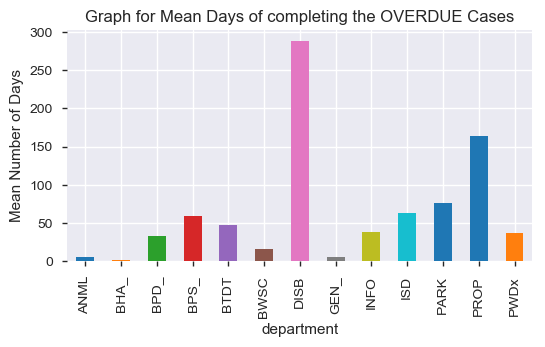

In [262]:
## Graphing the groupby function for department
count, ax = plt.subplots(figsize=(6,3))
ax = time2B.plot.bar(x='department', y='val', rot=90)
ax.set_title('Graph for Mean Days of completing the OVERDUE Cases')
ax.set_xlabel('department')
ax.set_ylabel('Mean Number of Days')
plt.show()

In [263]:
## Grouping the over_time cases by neigborhood_t and close_open_diff
time3A=on_time.groupby(['neighborhood_t'])['close_open_diff'].count()
time3A

neighborhood_t
0       225
1     13950
2     10126
3      6841
4      5530
5       740
6      6051
7        13
8     23525
9     13476
10    11279
11     4181
12     5890
13     7248
14    10513
15      183
16     3476
17     5966
18    15361
19     1186
20    14191
21    11171
22     2470
23     5626
Name: close_open_diff, dtype: int64

In [264]:
## Grouping the over_time cases by neigborhood_t and close_open_diff by mean
time4A=on_time.groupby(['neighborhood_t'])['close_open_diff'].mean()
time4A

neighborhood_t
0     6.671111
1     3.348530
2     3.932945
3     3.306826
4     4.332550
5     4.327027
6     4.901834
7     0.461538
8     3.941254
9     2.896334
10    5.401011
11    3.065774
12    5.298132
13    3.923427
14    3.844478
15    6.956284
16    3.464327
17    5.313946
18    3.512727
19    3.546374
20    2.827637
21    5.409543
22    3.141700
23    8.383754
Name: close_open_diff, dtype: float64

In [265]:
## Describe statement for neighbohood_t and ontime. 
on_time.neighborhood_t.describe()

count    179218.000000
mean         11.484656
std           6.682233
min           0.000000
25%           8.000000
50%          10.000000
75%          18.000000
max          23.000000
Name: neighborhood_t, dtype: float64

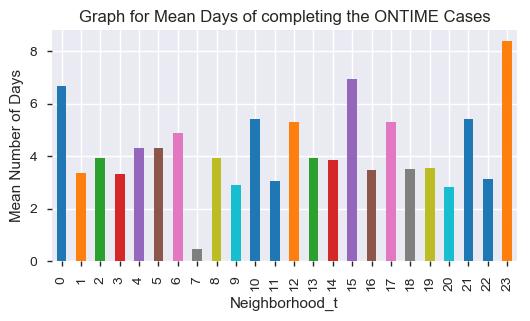

In [266]:
## Graphing the group by function for department
count, ax = plt.subplots(figsize=(6,3))
ax = time4A.plot.bar(x='Neigborhood_t', y='val', rot=90)
ax.set_title('Graph for Mean Days of completing the ONTIME Cases')
ax.set_xlabel('Neighborhood_t')
ax.set_ylabel('Mean Number of Days')
plt.show()

In [267]:
## Grouping the over_time cases by neigborhood_t and close_open_diff
time5B=over_time.groupby(['neighborhood_t'])['close_open_diff'].count()
time5B

neighborhood_t
0       43
1     2171
2     1510
3      693
4      825
5      135
6     1042
7        1
8     3862
9     1905
10    1465
11     808
12    1309
13    1388
14    2000
15      53
16     608
17    1138
18    2787
19     154
20    1521
21    1318
22     467
23     965
Name: close_open_diff, dtype: int64

In [268]:
## Grouping the over_time cases by subject and close_open_diff
time6B=over_time.groupby(['neighborhood_t'])['close_open_diff'].mean()
time6B

neighborhood_t
0     89.837209
1     47.068632
2     46.333113
3     43.809524
4     51.306667
5     51.925926
6     44.205374
7     13.000000
8     48.956240
9     59.573753
10    53.410239
11    50.904703
12    52.227655
13    43.622478
14    54.929500
15    40.245283
16    61.641447
17    51.268893
18    45.637244
19    60.824675
20    55.922419
21    57.069803
22    52.781585
23    43.412435
Name: close_open_diff, dtype: float64

In [269]:
## Describe statment for neighborhood_t with overtime
over_time.neighborhood_t.describe()

count    28168.000000
mean        11.515301
std          6.459971
min          0.000000
25%          8.000000
50%         11.000000
75%         18.000000
max         23.000000
Name: neighborhood_t, dtype: float64

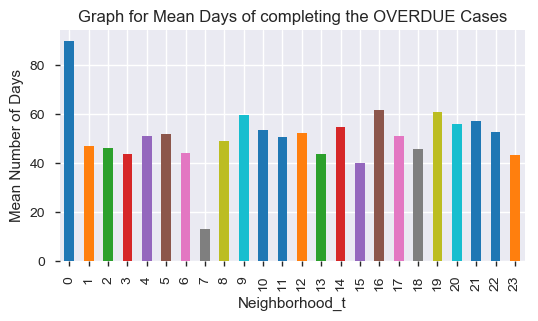

In [270]:
## Graphing the group by function for department
count, ax = plt.subplots(figsize=(6,3))
ax = time6B.plot.bar(x='Neigborhood_t', y='val', rot=90)
ax.set_title('Graph for Mean Days of completing the OVERDUE Cases')
ax.set_xlabel('Neighborhood_t')
ax.set_ylabel('Mean Number of Days')
plt.show()

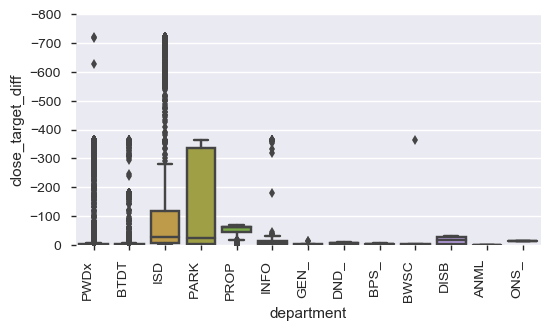

In [271]:
## Box and Whisker Plot for department and close_target_diff for ontime cases
count, ax = plt.subplots(figsize=(6,3))
fig = sns.boxplot(x='department', y="close_target_diff", data =on_time)
fig.axis(ymin=0, ymax= -800)

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show();

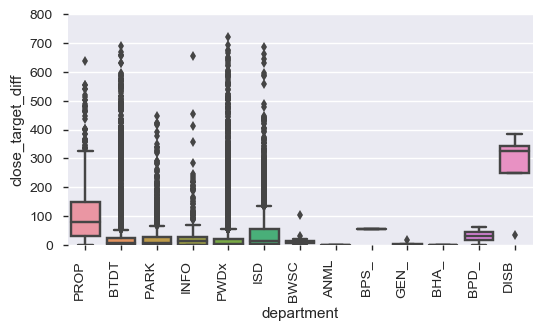

In [272]:
## Box and Whisker Plot for department and close_target_diff for overdue cases
count, ax = plt.subplots(figsize=(6,3))
fig = sns.boxplot(x='department', y="close_target_diff", data=over_time)
fig.axis(ymin=0, ymax=800)

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show();

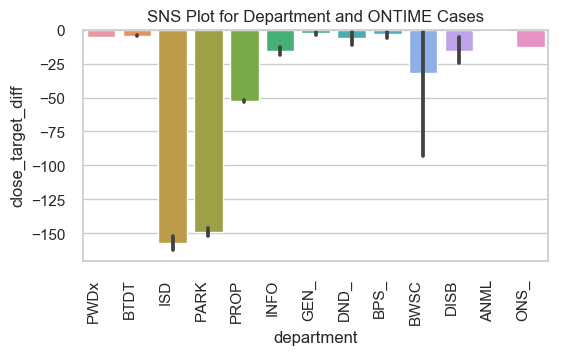

In [273]:
## Graphing the results for the department of on_time and close_target_diff
sns.set(style="whitegrid") 
count, ax = plt.subplots(figsize=(6,3))
ax = sns.barplot(x="department", y="close_target_diff", data=on_time)
ax.set_title('SNS Plot for Department and ONTIME Cases')

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show()

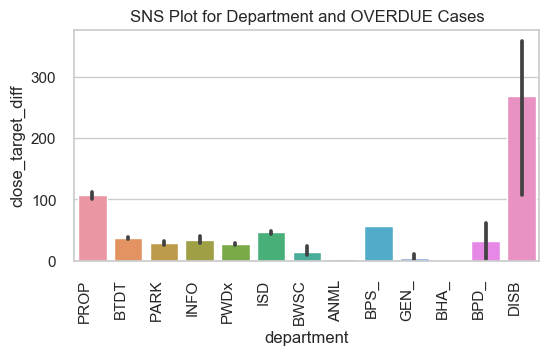

In [274]:
## Graphing the results for the department of over_time and close_target_diff
sns.set(style="whitegrid") 
count, ax = plt.subplots(figsize=(6,3))
ax = sns.barplot(x="department", y="close_target_diff", data=over_time)
ax.set_title('SNS Plot for Department and OVERDUE Cases')


# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show()

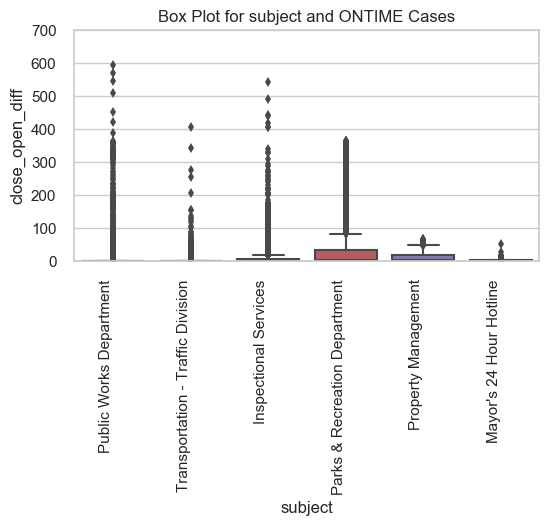

In [275]:
## Box and Whisker Plot for subject and close_open_diff for ontime cases
count, ax = plt.subplots(figsize=(6,3))
fig = sns.boxplot(x='subject', y="close_open_diff", data=on_time)
ax.set_title('Box Plot for subject and ONTIME Cases')
fig.axis(ymin=0, ymax=700)

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show();

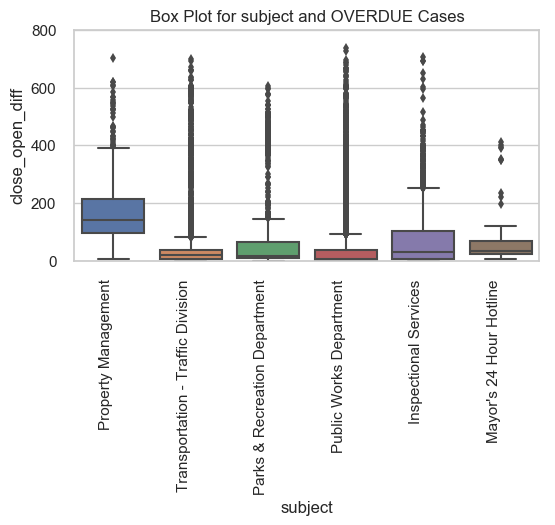

In [276]:
## Box and Whisker Plot for subject and close_open_diff for OVERDUE cases
count, ax = plt.subplots(figsize=(6,3))
fig = sns.boxplot(x='subject', y="close_open_diff", data=over_time)
ax.set_title('Box Plot for subject and OVERDUE Cases')
fig.axis(ymin=0, ymax=800)

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show();

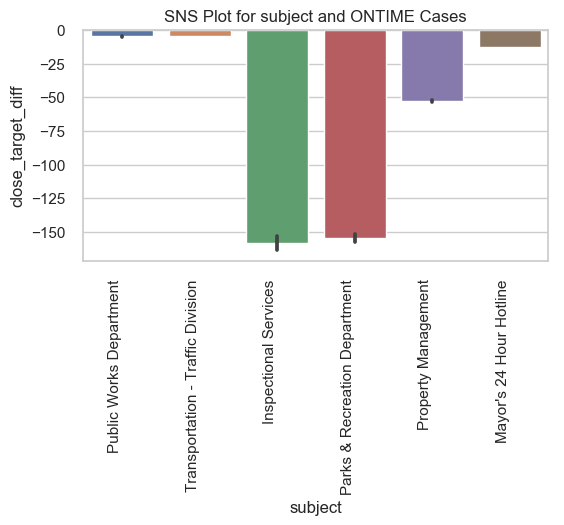

In [277]:
## Graphing the results for the subject and close_target_diff for ONTIME Cases
sns.set(style="whitegrid") 
count, ax = plt.subplots(figsize=(6,3))
ax = sns.barplot(x="subject", y="close_target_diff", data=on_time)
ax.set_title('SNS Plot for subject and ONTIME Cases')

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show()

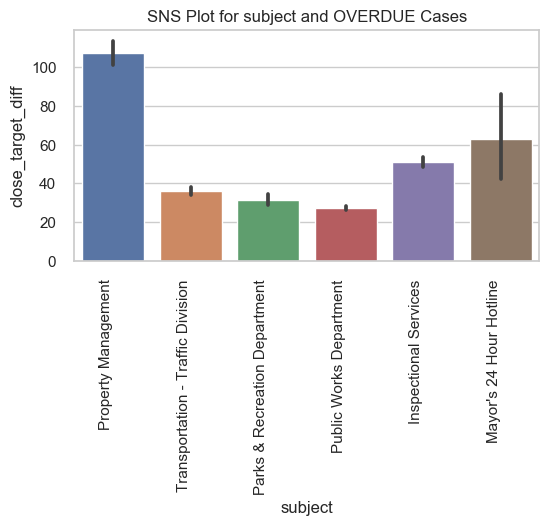

In [278]:
## Graphing the results for the subject and close_target_diff for OVERDUE Cases
sns.set(style="whitegrid") 
count, ax = plt.subplots(figsize=(6,3))
ax = sns.barplot(x="subject", y="close_target_diff", data=over_time)
ax.set_title('SNS Plot for subject and OVERDUE Cases')

# rotate axis labels
plt.setp(plt.gca().get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show()

In [279]:
## Grouping the on_time by subjec and target_open_diff
time7A=on_time.groupby(['subject'])['target_open_diff'].min()
time7A

subject
Inspectional Services                1
Mayor's 24 Hour Hotline              7
Parks & Recreation Department        1
Property Management                  4
Public Works Department              0
Transportation - Traffic Division    0
Name: target_open_diff, dtype: int64

In [280]:
## Grouping the on_time by subject and target_open_diff
time8A=on_time.groupby(['subject'])['target_open_diff'].max()
time8A

subject
Inspectional Services                721
Mayor's 24 Hour Hotline               52
Parks & Recreation Department        602
Property Management                   69
Public Works Department              607
Transportation - Traffic Division    437
Name: target_open_diff, dtype: int64

In [281]:
## Grouping the on_time by reaspm and target_open_diff
time9A=on_time.groupby(['reason'])['target_open_diff'].min()
time9A

reason
Administrative & General Requests      3
Boston Bikes                         365
Building                               1
Cemetery                               7
Code Enforcement                       1
Employee & General Comments           14
Enforcement & Abandoned Vehicles       0
Environmental Services                 2
General Request                        7
Graffiti                               4
Health                                 1
Highway Maintenance                    0
Housing                                1
Operations                             7
Park Maintenance & Safety              6
Parking Complaints                     7
Recycling                              0
Sanitation                             1
Signs & Signals                        0
Street Cleaning                        0
Street Lights                          1
Traffic Management & Engineering      30
Trees                                  1
Valet                                 14
Weights a

In [282]:
## Grouping the on_time by reaspm and target_open_diff
time10A=on_time.groupby(['reason'])['target_open_diff'].max()
time10A

reason
Administrative & General Requests     30
Boston Bikes                         365
Building                             721
Cemetery                              10
Code Enforcement                      15
Employee & General Comments           52
Enforcement & Abandoned Vehicles      20
Environmental Services               720
General Request                       10
Graffiti                              69
Health                               720
Highway Maintenance                  365
Housing                              180
Operations                            90
Park Maintenance & Safety             60
Parking Complaints                     8
Recycling                            154
Sanitation                             4
Signs & Signals                      437
Street Cleaning                       32
Street Lights                        607
Traffic Management & Engineering      40
Trees                                602
Valet                                 16
Weights a

In [283]:
## Grouping the on_time by reason and target_open_diff
time10AA=on_time.groupby(['reason'])['target_open_diff'].count()
time10AA

reason
Administrative & General Requests       50
Boston Bikes                            44
Building                              3123
Cemetery                                16
Code Enforcement                     28663
Employee & General Comments           1136
Enforcement & Abandoned Vehicles     42246
Environmental Services                2416
General Request                         89
Graffiti                              2410
Health                                 867
Highway Maintenance                  17123
Housing                               2793
Operations                             197
Park Maintenance & Safety             4033
Parking Complaints                       5
Recycling                             5770
Sanitation                           12391
Signs & Signals                       9680
Street Cleaning                      32016
Street Lights                         6413
Traffic Management & Engineering       460
Trees                                 7236
Vale

In [284]:
## Grouping the over_time by subject and target_open_diff
time11B=over_time.groupby(['subject'])['target_open_diff'].min()
time11B

subject
Inspectional Services                0
Mayor's 24 Hour Hotline              0
Parks & Recreation Department        0
Property Management                  4
Public Works Department              0
Transportation - Traffic Division   -1
Name: target_open_diff, dtype: int64

In [285]:
## Grouping the over_time by subject and target_open_diff
time12B=over_time.groupby(['subject'])['target_open_diff'].max()
time12B

subject
Inspectional Services                180
Mayor's 24 Hour Hotline               29
Parks & Recreation Department        365
Property Management                   69
Public Works Department              365
Transportation - Traffic Division    365
Name: target_open_diff, dtype: int64

In [286]:
## Grouping the over_time by subject and target_open_diff
time13B=over_time.groupby(['subject'])['target_open_diff'].count()
time13B

subject
Inspectional Services                 3584
Mayor's 24 Hour Hotline                 84
Parks & Recreation Department         1499
Property Management                    941
Public Works Department              14986
Transportation - Traffic Division     7074
Name: target_open_diff, dtype: int64

In [287]:
## Grouping the over_time by reason and target_open_diff
time14B=over_time.groupby(['reason'])['target_open_diff'].max()
time14B

reason
Abandoned Bicycle                     29
Administrative & General Requests      5
Boston Bikes                         365
Building                              10
Cemetery                               7
Code Enforcement                      39
Employee & General Comments           17
Enforcement & Abandoned Vehicles      20
Environmental Services                30
General Request                        7
Graffiti                              69
Health                                 5
Highway Maintenance                  365
Housing                              180
Operations                            90
Park Maintenance & Safety             12
Parking Complaints                   111
Recycling                            150
Sanitation                             4
Signs & Signals                      180
Street Cleaning                       29
Street Lights                        349
Traffic Management & Engineering      40
Trees                                365
Valet    

In [288]:
## Grouping the over_time by reason and target_open_diff
time14BB=over_time.groupby(['reason'])['target_open_diff'].count()
time14BB

reason
Abandoned Bicycle                       8
Administrative & General Requests       8
Boston Bikes                            1
Building                             1995
Cemetery                                2
Code Enforcement                     1282
Employee & General Comments            73
Enforcement & Abandoned Vehicles     3360
Environmental Services                784
General Request                         3
Graffiti                              941
Health                                311
Highway Maintenance                  5224
Housing                               454
Operations                             27
Park Maintenance & Safety            1108
Parking Complaints                      2
Recycling                            2806
Sanitation                           1162
Signs & Signals                      3511
Street Cleaning                      1913
Street Lights                        2592
Traffic Management & Engineering      170
Trees                      

In [289]:
## Grouping the over_time by ward and target_open_diff
time15B=over_time.groupby(['ward'])['target_open_diff'].min()
time15B

ward
0          0
1          0
10         0
11         0
12         0
13         0
14         0
15         0
16         0
17         0
18         0
19         0
2          0
20         0
21         0
22         0
3          0
4          0
5          0
6          0
7          0
8          0
9          0
UNKNOWN    0
Ward 1    -1
Ward 10    0
Ward 11    0
Ward 12    0
Ward 13    0
Ward 14   -1
Ward 15    0
Ward 16    0
Ward 17    0
Ward 18    0
Ward 19    0
Ward 2     0
Ward 20    0
Ward 21    0
Ward 22    0
Ward 3     0
Ward 4     0
Ward 5     0
Ward 6     0
Ward 7     0
Ward 8     0
Ward 9     0
Name: target_open_diff, dtype: int64

In [290]:
## Grouping the over_time by ward and target_open_diff
time16B=over_time.groupby(['ward'])['target_open_diff'].max()
time16B

ward
0           63
1          365
10         365
11         365
12         365
13         365
14         365
15          63
16         120
17         365
18         120
19         120
2          365
20         180
21         180
22         120
3          365
4          365
5          365
6          120
7          365
8          365
9          365
UNKNOWN    365
Ward 1     365
Ward 10    365
Ward 11    365
Ward 12    365
Ward 13    365
Ward 14    365
Ward 15    365
Ward 16    365
Ward 17    365
Ward 18    365
Ward 19    365
Ward 2     365
Ward 20    365
Ward 21    365
Ward 22    365
Ward 3     365
Ward 4     365
Ward 5     365
Ward 6     365
Ward 7     365
Ward 8     365
Ward 9     365
Name: target_open_diff, dtype: int64

In [291]:
## column check for over_time dataframe
over_time.columns


Index(['ontime', 'source', 'city_council_district', 'fire_district', 'subject',
       'pwd_district', 'department', 'neighborhood_services_district',
       'police_district', 'type', 'precinct', 'latitude', 'longitude', 'ward',
       'neighborhood', 'reason', 'submittedphoto', 'closed_dt', 'open_dt',
       'target_dt', 'ontime_t', 'source_t', 'source_t2',
       'city_council_district_t', 'fire_district_t', 'fire_district_t2',
       'subject_t', 'subject_t2', 'pwd_district_t', 'department_t',
       'department_t2', 'police_district_t', 'neighborhood_t', 'ward_t',
       'reason_t', 'type_t', 'precinct_t', 'submittedphoto_t',
       'neighborhood_t2', 'close_target_diff', 'close_open_diff',
       'target_open_diff', 'week', 'day', 'day_of_week', 'day_of_week_t'],
      dtype='object')

In [292]:
## Creating new databsase for over_time cases with close_target values = 1
time17B=over_time[over_time['close_target_diff']==1]
time17B.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606754,OVERDUE,Constituent Call,8,4,Public Works Department,1C,PARK,14,D4,Requests for Street Cleaning,...,46,0,2,1,2,1,40,2,Monday,1
606801,OVERDUE,Constituent Call,5,8,Transportation - Traffic Division,7,BTDT,9,B3,Abandoned Vehicles,...,189,0,12,1,18,17,40,2,Monday,1
606817,OVERDUE,Citizens Connect App,7,9,Public Works Department,10A,PWDx,13,B2,Request for Pothole Repair,...,80,0,16,1,2,1,40,2,Monday,1


In [293]:
## Grouping the over_time by subject and target_open_diff
time18A=time17B.groupby(['subject'])['target_open_diff'].count()
time18A

subject
Inspectional Services                 212
Mayor's 24 Hour Hotline                 1
Parks & Recreation Department         106
Property Management                    10
Public Works Department              1615
Transportation - Traffic Division     521
Name: target_open_diff, dtype: int64

In [294]:
## Grouping the over_time by reason and target_open_diff
time19B=time17B.groupby(['reason'])['target_open_diff'].count()
time19B

reason
Administrative & General Requests      1
Building                             128
Code Enforcement                     252
Enforcement & Abandoned Vehicles     270
Environmental Services                30
General Request                        1
Graffiti                              10
Health                                44
Highway Maintenance                  633
Housing                                3
Operations                             2
Park Maintenance & Safety             74
Recycling                             97
Sanitation                           152
Signs & Signals                      246
Street Cleaning                      369
Street Lights                        111
Traffic Management & Engineering       3
Trees                                 32
Weights and Measures                   7
Name: target_open_diff, dtype: int64

In [295]:
## Creating new databsase for over_time cases with close_target values < 2
time20B=over_time[over_time['close_target_diff']<=2]
time20B.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606563,OVERDUE,Constituent Call,2,6,Transportation - Traffic Division,5,BTDT,5,C6,Traffic Signal Inspection,...,55,0,20,2,3,1,39,1,Sunday,7
606678,OVERDUE,Citizens Connect App,7,4,Transportation - Traffic Division,1C,BTDT,14,D4,Parking Enforcement,...,34,1,2,0,0,0,39,1,Sunday,7
606754,OVERDUE,Constituent Call,8,4,Public Works Department,1C,PARK,14,D4,Requests for Street Cleaning,...,46,0,2,1,2,1,40,2,Monday,1


In [296]:
## Grouping the on_time by day_of_week and close_open_diff and count
time21B=time20B.groupby(['subject'])['target_open_diff'].count()
time21B

subject
Inspectional Services                 830
Mayor's 24 Hour Hotline                 5
Parks & Recreation Department         441
Property Management                    28
Public Works Department              7283
Transportation - Traffic Division    2090
Name: target_open_diff, dtype: int64

In [297]:
## Grouping the on_time b and close_open_diff
time22B=time20B.groupby(['reason'])['target_open_diff'].count()
time22B.head(3)

reason
Abandoned Bicycle                      2
Administrative & General Requests      2
Building                             456
Name: target_open_diff, dtype: int64

In [298]:
## creating a new dataframe where close_target_diff for overtime is == to 10
time23B=over_time[over_time['close_target_diff']==10]
time23B.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606604,OVERDUE,Citizens Connect App,6,9,Parks & Recreation Department,2,PARK,11,E13,Equipment Repair,...,198,1,14,10,19,8,39,1,Sunday,7
606701,OVERDUE,Constituent Call,6,9,Public Works Department,10B,INFO,11,E13,Requests for Street Cleaning,...,95,0,18,10,11,1,39,1,Sunday,7
606745,OVERDUE,Citizens Connect App,7,7,Parks & Recreation Department,10B,PARK,13,D4,Equipment Repair,...,79,1,18,10,18,8,40,2,Monday,1


In [299]:
## Grouping the on_time by day_of_week and close_open_diff
time19B=over_time.groupby(['subject'])['target_open_diff'].count()
time19B

subject
Inspectional Services                 3584
Mayor's 24 Hour Hotline                 84
Parks & Recreation Department         1499
Property Management                    941
Public Works Department              14986
Transportation - Traffic Division     7074
Name: target_open_diff, dtype: int64

In [300]:
##############################  Graphing Time Stamps#############################

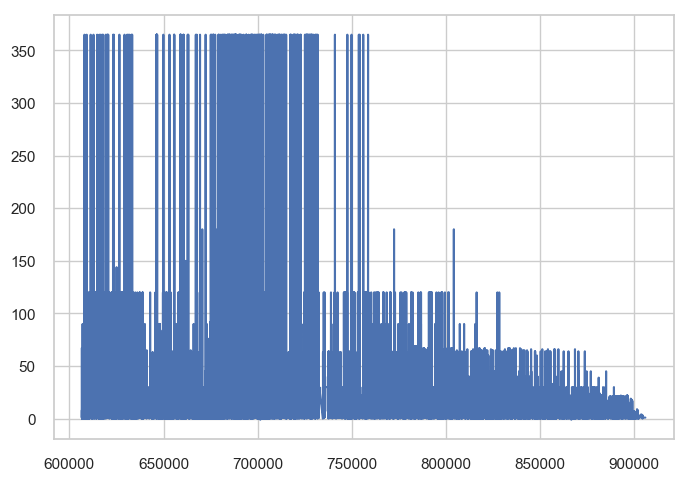

In [301]:
## Plotting the over_time for the target_open_diff
plot_over=over_time.target_open_diff
plt.plot(plot_over)

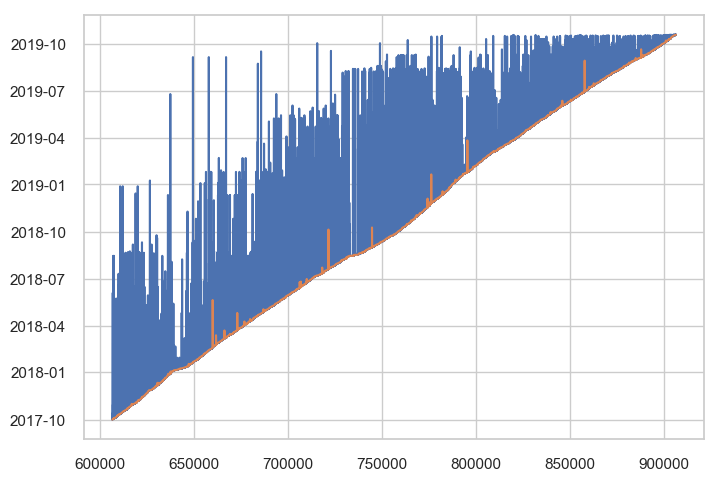

In [302]:
## Plotting the on_time for three plot for open and close_dt times.
plot_ona=on_time.open_dt
plot_on=on_time.closed_dt


plt.plot(figsize=(15,4))
plt.plot(subplots=True, figsize=(15,6))
plt.plot(plot_on)
plt.plot(plot_ona)

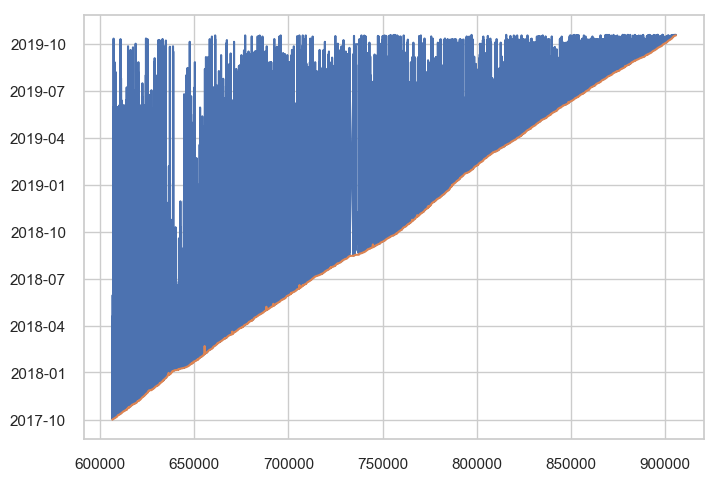

In [303]:
## Plotting the over_time for three plot for open and close_dt times.
plot_overa=over_time.open_dt
plot_over=over_time.closed_dt


plt.plot(figsize=(15,4))
plt.plot(subplots=True, figsize=(15,6))
plt.plot(plot_over)
plt.plot(plot_overa)

In [304]:
## Saving the boston time dataframe 
submit=pd.DataFrame(data=df_timeb)
submit.to_csv('df_timeboston.csv',index=True)

In [305]:
##################################### Creating time dataframes for all three cities

In [306]:
## Importing the chicago csv file 
df_rawc = pd.read_csv("I:/Nov/311chicago.csv")
df_rawc.head(3)

,SR_NUMBER,SR_TYPE,SR_SHORT_CODE,OWNER_DEPARTMENT,STATUS,CREATED_DATE,LAST_MODIFIED_DATE,CLOSED_DATE,STREET_ADDRESS,CITY,...,PRECINCT,SANITATION_DIVISION_DAYS,CREATED_HOUR,CREATED_DAY_OF_WEEK,CREATED_MONTH,X_COORDINATE,Y_COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,SR19-00000003,Street Light Out Complaint,SFD,CDOT - Department of Transportation,Completed,1/1/2019 0:11,5/16/2019 16:41,1/17/2019 12:13,5701 S SAINT LOUIS AVE,NaN,...,13.0,Wednesday,0,3,1,1154090.409,1866552.749,41.789646,-87.710539,"(41.789646, -87.710539)"
1,SR19-00000006,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,1/1/2019 0:18,5/16/2019 16:41,1/2/2019 12:31,1650 W HOWARD ST,NaN,...,1.0,Monday,0,3,1,1163764.314,1950407.038,42.019550,-87.672700,"(42.01955, -87.6727)"
2,SR19-00000008,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,1/1/2019 0:20,5/16/2019 16:40,1/2/2019 12:30,1400 W GREENLEAF AVE,NaN,...,27.0,Monday,0,3,1,1165627.095,1947076.146,42.010371,-87.665940,"(42.01037081, -87.66593962)"


In [307]:
## Converting the closed_dt attribute to a timestamp for analysis of Chicago 
df_rawc['CREATED_DATE'] = pd.to_datetime (df_rawc['CREATED_DATE'])
df_rawc.head(3)

,SR_NUMBER,SR_TYPE,SR_SHORT_CODE,OWNER_DEPARTMENT,STATUS,CREATED_DATE,LAST_MODIFIED_DATE,CLOSED_DATE,STREET_ADDRESS,CITY,...,PRECINCT,SANITATION_DIVISION_DAYS,CREATED_HOUR,CREATED_DAY_OF_WEEK,CREATED_MONTH,X_COORDINATE,Y_COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,SR19-00000003,Street Light Out Complaint,SFD,CDOT - Department of Transportation,Completed,2019-01-01 00:11:00,5/16/2019 16:41,1/17/2019 12:13,5701 S SAINT LOUIS AVE,NaN,...,13.0,Wednesday,0,3,1,1154090.409,1866552.749,41.789646,-87.710539,"(41.789646, -87.710539)"
1,SR19-00000006,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:18:00,5/16/2019 16:41,1/2/2019 12:31,1650 W HOWARD ST,NaN,...,1.0,Monday,0,3,1,1163764.314,1950407.038,42.019550,-87.672700,"(42.01955, -87.6727)"
2,SR19-00000008,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:20:00,5/16/2019 16:40,1/2/2019 12:30,1400 W GREENLEAF AVE,NaN,...,27.0,Monday,0,3,1,1165627.095,1947076.146,42.010371,-87.665940,"(42.01037081, -87.66593962)"


In [308]:
## Filtering all data for dates for only the 2019 year 
df_rawc=df_rawc[df_rawc['CREATED_DATE'] >= '1/1/2019']
df_rawc.count()

SR_NUMBER                   1048575
SR_TYPE                     1048575
SR_SHORT_CODE               1048575
OWNER_DEPARTMENT            1048575
STATUS                      1048575
CREATED_DATE                1048575
LAST_MODIFIED_DATE          1048575
CLOSED_DATE                  998211
STREET_ADDRESS              1046174
CITY                         303540
STATE                        303540
ZIP_CODE                    1034116
STREET_NUMBER               1046054
STREET_DIRECTION            1045992
STREET_NAME                 1046102
STREET_TYPE                 1041535
DUPLICATE                   1048575
LEGACY_RECORD               1048575
LEGACY_SR_NUMBER                  0
PARENT_SR_NUMBER              89808
COMMUNITY_AREA              1028012
WARD                        1028061
ELECTRICAL_DISTRICT          243585
ELECTRICITY_GRID             873203
POLICE_SECTOR               1028055
POLICE_DISTRICT             1028060
POLICE_BEAT                 1028055
PRECINCT                    

In [309]:
## creating the time stamp for close_date for Chicago
df_rawc['CLOSED_DATE'] = pd.to_datetime (df_rawc['CLOSED_DATE'])
df_rawc

,SR_NUMBER,SR_TYPE,SR_SHORT_CODE,OWNER_DEPARTMENT,STATUS,CREATED_DATE,LAST_MODIFIED_DATE,CLOSED_DATE,STREET_ADDRESS,CITY,...,PRECINCT,SANITATION_DIVISION_DAYS,CREATED_HOUR,CREATED_DAY_OF_WEEK,CREATED_MONTH,X_COORDINATE,Y_COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,SR19-00000003,Street Light Out Complaint,SFD,CDOT - Department of Transportation,Completed,2019-01-01 00:11:00,5/16/2019 16:41,2019-01-17 12:13:00,5701 S SAINT LOUIS AVE,NaN,...,13.0,Wednesday,0,3,1,1154090.409,1866552.749,41.789646,-87.710539,"(41.789646, -87.710539)"
1,SR19-00000006,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:18:00,5/16/2019 16:41,2019-01-02 12:31:00,1650 W HOWARD ST,NaN,...,1.0,Monday,0,3,1,1163764.314,1950407.038,42.019550,-87.672700,"(42.01955, -87.6727)"
2,SR19-00000008,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:20:00,5/16/2019 16:40,2019-01-02 12:30:00,1400 W GREENLEAF AVE,NaN,...,27.0,Monday,0,3,1,1165627.095,1947076.146,42.010371,-87.665940,"(42.01037081, -87.66593962)"
3,SR19-00000012,Garbage Cart Maintenance,SIE,Streets and Sanitation,Completed,2019-01-01 00:23:00,5/16/2019 16:41,2019-02-16 12:33:00,5017 W GUNNISON ST,NaN,...,31.0,Wednesday,0,3,1,1141971.021,1931705.199,41.968665,-87.753364,"(41.968665, -87.753364)"
4,SR19-00000014,Tree Removal Request,SEE,Streets and Sanitation,Completed,2019-01-01 00:25:00,5/16/2019 16:41,2019-04-01 08:12:00,12100 S ELIZABETH ST,NaN,...,40.0,Tuesday,0,3,1,1170109.454,1824453.689,41.673795,-87.653027,"(41.6737945957448, -87.65302695628411)"
5,SR19-00000015,Sidewalk Inspection Request,PBS,CDOT - Department of Transportation,Completed,2019-01-01 00:26:00,10/28/2019 15:15,2019-10-28 15:15:00,5149 W OAKDALE AVE,NaN,...,17.0,Thursday,0,3,1,1141338.894,1919041.537,41.933926,-87.756002,"(41.933926, -87.756002)"
6,SR19-00000020,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:31:00,5/16/2019 16:41,2019-01-01 00:31:00,2111 W Lexington ST,NaN,...,46.0,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)"
7,SR19-00000022,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:32:00,5/16/2019 16:41,2019-01-01 00:32:00,2111 W Lexington ST,NaN,...,46.0,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)"
8,SR19-00000023,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:33:00,5/16/2019 16:41,2019-01-01 00:33:00,2111 W Lexington ST,NaN,...,46.0,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)"
9,SR19-00000027,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:35:00,5/16/2019 16:41,2019-01-01 00:35:00,2111 W Lexington ST,NaN,...,46.0,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)"


In [310]:
## Checking to see what values are missing and were dropped for created_date in Chicago
df_rawc.dropna(subset=['CREATED_DATE'], inplace=True)
df_rawc.count()

SR_NUMBER                   1048575
SR_TYPE                     1048575
SR_SHORT_CODE               1048575
OWNER_DEPARTMENT            1048575
STATUS                      1048575
CREATED_DATE                1048575
LAST_MODIFIED_DATE          1048575
CLOSED_DATE                  998211
STREET_ADDRESS              1046174
CITY                         303540
STATE                        303540
ZIP_CODE                    1034116
STREET_NUMBER               1046054
STREET_DIRECTION            1045992
STREET_NAME                 1046102
STREET_TYPE                 1041535
DUPLICATE                   1048575
LEGACY_RECORD               1048575
LEGACY_SR_NUMBER                  0
PARENT_SR_NUMBER              89808
COMMUNITY_AREA              1028012
WARD                        1028061
ELECTRICAL_DISTRICT          243585
ELECTRICITY_GRID             873203
POLICE_SECTOR               1028055
POLICE_DISTRICT             1028060
POLICE_BEAT                 1028055
PRECINCT                    

In [311]:
## Checking to see what values are missing and were dropped from the closed_date for chicago
df_rawc.dropna(subset=['CLOSED_DATE'], inplace=True)
df_rawc.count()

SR_NUMBER                   998211
SR_TYPE                     998211
SR_SHORT_CODE               998211
OWNER_DEPARTMENT            998211
STATUS                      998211
CREATED_DATE                998211
LAST_MODIFIED_DATE          998211
CLOSED_DATE                 998211
STREET_ADDRESS              996087
CITY                        303434
STATE                       303434
ZIP_CODE                    985144
STREET_NUMBER               995975
STREET_DIRECTION            995935
STREET_NAME                 996025
STREET_TYPE                 992212
DUPLICATE                   998211
LEGACY_RECORD               998211
LEGACY_SR_NUMBER                 0
PARENT_SR_NUMBER             79659
COMMUNITY_AREA              978212
WARD                        978256
ELECTRICAL_DISTRICT         237565
ELECTRICITY_GRID            823465
POLICE_SECTOR               978258
POLICE_DISTRICT             978263
POLICE_BEAT                 978258
PRECINCT                    977986
SANITATION_DIVISION_

In [312]:
## Creating a time differential for closed time minus target time of chicago database
df_rawc['closed_created_diff'] = (df_rawc['CLOSED_DATE'] - df_rawc['CREATED_DATE']).dt.days
df_rawc.head(3)

,SR_NUMBER,SR_TYPE,SR_SHORT_CODE,OWNER_DEPARTMENT,STATUS,CREATED_DATE,LAST_MODIFIED_DATE,CLOSED_DATE,STREET_ADDRESS,CITY,...,SANITATION_DIVISION_DAYS,CREATED_HOUR,CREATED_DAY_OF_WEEK,CREATED_MONTH,X_COORDINATE,Y_COORDINATE,LATITUDE,LONGITUDE,LOCATION,closed_created_diff
0,SR19-00000003,Street Light Out Complaint,SFD,CDOT - Department of Transportation,Completed,2019-01-01 00:11:00,5/16/2019 16:41,2019-01-17 12:13:00,5701 S SAINT LOUIS AVE,NaN,...,Wednesday,0,3,1,1154090.409,1866552.749,41.789646,-87.710539,"(41.789646, -87.710539)",16
1,SR19-00000006,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:18:00,5/16/2019 16:41,2019-01-02 12:31:00,1650 W HOWARD ST,NaN,...,Monday,0,3,1,1163764.314,1950407.038,42.019550,-87.672700,"(42.01955, -87.6727)",1
2,SR19-00000008,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:20:00,5/16/2019 16:40,2019-01-02 12:30:00,1400 W GREENLEAF AVE,NaN,...,Monday,0,3,1,1165627.095,1947076.146,42.010371,-87.665940,"(42.01037081, -87.66593962)",1


In [313]:
## Filtering the chicago time db for all value >= to 0
df_timec=df_rawc[df_rawc['closed_created_diff']>=0]
df_timec.count()

SR_NUMBER                   998204
SR_TYPE                     998204
SR_SHORT_CODE               998204
OWNER_DEPARTMENT            998204
STATUS                      998204
CREATED_DATE                998204
LAST_MODIFIED_DATE          998204
CLOSED_DATE                 998204
STREET_ADDRESS              996080
CITY                        303434
STATE                       303434
ZIP_CODE                    985137
STREET_NUMBER               995968
STREET_DIRECTION            995928
STREET_NAME                 996018
STREET_TYPE                 992205
DUPLICATE                   998204
LEGACY_RECORD               998204
LEGACY_SR_NUMBER                 0
PARENT_SR_NUMBER             79659
COMMUNITY_AREA              978205
WARD                        978249
ELECTRICAL_DISTRICT         237559
ELECTRICITY_GRID            823458
POLICE_SECTOR               978251
POLICE_DISTRICT             978256
POLICE_BEAT                 978251
PRECINCT                    977979
SANITATION_DIVISION_

In [314]:
## Saving the cleaned df_timec database for chicago
submit=pd.DataFrame(data=df_timec)
submit.to_csv('df_timec2.csv',index=True)

In [315]:
## uploading the San Fransisco csv file. 
df_raws = pd.read_csv("I:/Nov/311sanfran.csv")
df_raws.head(3)

,CaseID,Opened,Closed,Updated,Status,Status Notes,Responsible Agency,Category,Request Type,Request Details,...,:@computed_region_fcz8_est8,:@computed_region_pigm_ib2e,:@computed_region_9jxd_iqea,:@computed_region_6ezc_tdp2,:@computed_region_6pnf_4xz7,:@computed_region_h4ep_8xdi,:@computed_region_nqbw_i6c3,:@computed_region_2dwj_jsy4,:@computed_region_y6ts_4iup,Neighborhoods
0,11593870,10/24/2019 1:13,NaN,10/24/2019 1:15,Open,open,SSP - MTA Feedback Queue,MUNI Feedback,MUNI - Services_Service_Delivery_Facilities,601_Delay_No_Show,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,11593869,10/24/2019 1:13,NaN,10/24/2019 1:13,Open,Open,PG and E - Streetlights Queue,Streetlights,Streetlight - Light_Burnt_Out,Light_Burnt_Out on Wooden Pole,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,87.0
2,11593864,10/24/2019 0:59,NaN,10/24/2019 0:59,Open,Open,SFMTA - Parking Enforcement - G,General Request - MTA,request_for_service,parking_enforcement - request_for_service,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [316]:
## Converting the Opened attribute to a timestamp for analysis
df_raws['Opened'] = pd.to_datetime (df_raws['Opened'])
df_raws.head(3)

,CaseID,Opened,Closed,Updated,Status,Status Notes,Responsible Agency,Category,Request Type,Request Details,...,:@computed_region_fcz8_est8,:@computed_region_pigm_ib2e,:@computed_region_9jxd_iqea,:@computed_region_6ezc_tdp2,:@computed_region_6pnf_4xz7,:@computed_region_h4ep_8xdi,:@computed_region_nqbw_i6c3,:@computed_region_2dwj_jsy4,:@computed_region_y6ts_4iup,Neighborhoods
0,11593870,2019-10-24 01:13:00,NaN,10/24/2019 1:15,Open,open,SSP - MTA Feedback Queue,MUNI Feedback,MUNI - Services_Service_Delivery_Facilities,601_Delay_No_Show,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,11593869,2019-10-24 01:13:00,NaN,10/24/2019 1:13,Open,Open,PG and E - Streetlights Queue,Streetlights,Streetlight - Light_Burnt_Out,Light_Burnt_Out on Wooden Pole,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,87.0
2,11593864,2019-10-24 00:59:00,NaN,10/24/2019 0:59,Open,Open,SFMTA - Parking Enforcement - G,General Request - MTA,request_for_service,parking_enforcement - request_for_service,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [317]:
## Filtering all data for dates that are only in the 2019 year
df_raws=df_raws[df_raws['Opened'] >= '1/1/2019']
df_raws.count()

CaseID                          71435
Opened                          71435
Closed                          60616
Updated                         71435
Status                          71435
Status Notes                    55999
Responsible Agency              71435
Category                        71435
Request Type                    71435
Request Details                 70292
Address                         71435
Street                          67760
Supervisor District             67760
Neighborhood                    67760
Police District                 67739
Latitude                        71435
Longitude                       71435
Point                           71435
Source                          71435
Media URL                       34952
SF Find Neighborhoods           67763
Current Police Districts        67766
Current Supervisor Districts    67864
Analysis Neighborhoods          67847
:@computed_region_rxqg_mtj9     67864
:@computed_region_yftq_j783     67699
:@computed_r

In [318]:
## Converting the closed attribute to a timestamp for analysis
df_raws['Closed'] = pd.to_datetime (df_raws['Closed'])
df_raws.head(3)

,CaseID,Opened,Closed,Updated,Status,Status Notes,Responsible Agency,Category,Request Type,Request Details,...,:@computed_region_fcz8_est8,:@computed_region_pigm_ib2e,:@computed_region_9jxd_iqea,:@computed_region_6ezc_tdp2,:@computed_region_6pnf_4xz7,:@computed_region_h4ep_8xdi,:@computed_region_nqbw_i6c3,:@computed_region_2dwj_jsy4,:@computed_region_y6ts_4iup,Neighborhoods
0,11593870,2019-10-24 01:13:00,NaT,10/24/2019 1:15,Open,open,SSP - MTA Feedback Queue,MUNI Feedback,MUNI - Services_Service_Delivery_Facilities,601_Delay_No_Show,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,11593869,2019-10-24 01:13:00,NaT,10/24/2019 1:13,Open,Open,PG and E - Streetlights Queue,Streetlights,Streetlight - Light_Burnt_Out,Light_Burnt_Out on Wooden Pole,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,87.0
2,11593864,2019-10-24 00:59:00,NaT,10/24/2019 0:59,Open,Open,SFMTA - Parking Enforcement - G,General Request - MTA,request_for_service,parking_enforcement - request_for_service,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [319]:
## Checking to see what values are missing and were dropped from the df_raws db
df_raws.dropna(subset=['Opened'], inplace=True)
df_raws.count()

CaseID                          71435
Opened                          71435
Closed                          60616
Updated                         71435
Status                          71435
Status Notes                    55999
Responsible Agency              71435
Category                        71435
Request Type                    71435
Request Details                 70292
Address                         71435
Street                          67760
Supervisor District             67760
Neighborhood                    67760
Police District                 67739
Latitude                        71435
Longitude                       71435
Point                           71435
Source                          71435
Media URL                       34952
SF Find Neighborhoods           67763
Current Police Districts        67766
Current Supervisor Districts    67864
Analysis Neighborhoods          67847
:@computed_region_rxqg_mtj9     67864
:@computed_region_yftq_j783     67699
:@computed_r

In [320]:
## Checking to see what values are missing and were dropped from closed variable for df_raws
df_raws.dropna(subset=['Closed'], inplace=True)
df_raws.count()

CaseID                          60616
Opened                          60616
Closed                          60616
Updated                         60616
Status                          60616
Status Notes                    45180
Responsible Agency              60616
Category                        60616
Request Type                    60616
Request Details                 59636
Address                         60616
Street                          58121
Supervisor District             58121
Neighborhood                    58121
Police District                 58106
Latitude                        60616
Longitude                       60616
Point                           60616
Source                          60616
Media URL                       30532
SF Find Neighborhoods           58131
Current Police Districts        58127
Current Supervisor Districts    58211
Analysis Neighborhoods          58194
:@computed_region_rxqg_mtj9     58211
:@computed_region_yftq_j783     58064
:@computed_r

In [321]:
## df_raws df check
df_raws.head(3)

,CaseID,Opened,Closed,Updated,Status,Status Notes,Responsible Agency,Category,Request Type,Request Details,...,:@computed_region_fcz8_est8,:@computed_region_pigm_ib2e,:@computed_region_9jxd_iqea,:@computed_region_6ezc_tdp2,:@computed_region_6pnf_4xz7,:@computed_region_h4ep_8xdi,:@computed_region_nqbw_i6c3,:@computed_region_2dwj_jsy4,:@computed_region_y6ts_4iup,Neighborhoods
8,11593852,2019-10-24 00:35:00,2019-10-24 00:38:00,10/24/2019 0:38,Closed,The report has been logged and will help the C...,Parking Enforcement Dispatch Queue,Parking Enforcement,Double_Parking,green/silver - BMW - Unknown,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,89.0
33,11593798,2019-10-23 23:23:00,2019-10-23 23:23:00,10/23/2019 23:23,Closed,The report has been logged and will help the C...,Parking Enforcement Review Queue,Parking Enforcement,Blocking_Bicycle_Lane,Blue - Gray Line bus - CP92342,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,77.0
35,11593782,2019-10-23 23:10:00,2019-10-23 23:11:00,10/23/2019 23:11,Closed,The report has been logged and will help the C...,Parking Enforcement Dispatch Queue,Parking Enforcement,Blocking_Bicycle_Lane,White - - 42686U1,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,24.0


In [322]:
## Creating a time differential for closed time minus target time for df_raws
df_raws['closed_created_diff'] = (df_raws['Closed'] - df_raws['Opened']).dt.days
df_raws.head(3)

,CaseID,Opened,Closed,Updated,Status,Status Notes,Responsible Agency,Category,Request Type,Request Details,...,:@computed_region_pigm_ib2e,:@computed_region_9jxd_iqea,:@computed_region_6ezc_tdp2,:@computed_region_6pnf_4xz7,:@computed_region_h4ep_8xdi,:@computed_region_nqbw_i6c3,:@computed_region_2dwj_jsy4,:@computed_region_y6ts_4iup,Neighborhoods,closed_created_diff
8,11593852,2019-10-24 00:35:00,2019-10-24 00:38:00,10/24/2019 0:38,Closed,The report has been logged and will help the C...,Parking Enforcement Dispatch Queue,Parking Enforcement,Double_Parking,green/silver - BMW - Unknown,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,89.0,0
33,11593798,2019-10-23 23:23:00,2019-10-23 23:23:00,10/23/2019 23:23,Closed,The report has been logged and will help the C...,Parking Enforcement Review Queue,Parking Enforcement,Blocking_Bicycle_Lane,Blue - Gray Line bus - CP92342,...,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,77.0,0
35,11593782,2019-10-23 23:10:00,2019-10-23 23:11:00,10/23/2019 23:11,Closed,The report has been logged and will help the C...,Parking Enforcement Dispatch Queue,Parking Enforcement,Blocking_Bicycle_Lane,White - - 42686U1,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,24.0,0


In [323]:
## making sure all rows for closed_created_diff are > 0
df_times=df_raws[df_raws['closed_created_diff']>=0]
df_times.count()

CaseID                          60613
Opened                          60613
Closed                          60613
Updated                         60613
Status                          60613
Status Notes                    45177
Responsible Agency              60613
Category                        60613
Request Type                    60613
Request Details                 59633
Address                         60613
Street                          58118
Supervisor District             58118
Neighborhood                    58118
Police District                 58103
Latitude                        60613
Longitude                       60613
Point                           60613
Source                          60613
Media URL                       30529
SF Find Neighborhoods           58128
Current Police Districts        58124
Current Supervisor Districts    58208
Analysis Neighborhoods          58191
:@computed_region_rxqg_mtj9     58208
:@computed_region_yftq_j783     58061
:@computed_r

In [324]:
## Saving the cleaned df_times db
submit=pd.DataFrame(data=df_times)
submit.to_csv('df_times.csv',index=True)

In [325]:
## Creating the New York City time database called df_rawN
df_rawN = pd.read_csv("I:/Nov/311nyc.csv")
df_rawN.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,41450894.0,1/1/2019 0:00,1/17/2019 8:36,HPD,Department of Housing Preservation and Develop...,DOOR/WINDOW,DOOR FRAME,RESIDENTIAL BUILDING,11238,435 GRAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.683022,-73.961724,"(40.68302183461124, -73.96172365199637)"
1,41312454.0,1/1/2019 0:00,1/1/2019 2:22,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11231,135 RICHARDS STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.677201,-74.010351,"(40.677200581770165, -74.01035058400049)"
2,41310350.0,1/1/2019 0:00,1/1/2019 2:21,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11365,192-20C 67 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.738062,-73.781277,"(40.738061586139345, -73.78127702459108)"


In [326]:
## Converting the created Date attribute to a timestamp for analysis
df_rawN['Created Date'] = pd.to_datetime (df_rawN['Created Date'])
df_rawN.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,41450894.0,2019-01-01,1/17/2019 8:36,HPD,Department of Housing Preservation and Develop...,DOOR/WINDOW,DOOR FRAME,RESIDENTIAL BUILDING,11238,435 GRAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.683022,-73.961724,"(40.68302183461124, -73.96172365199637)"
1,41312454.0,2019-01-01,1/1/2019 2:22,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11231,135 RICHARDS STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.677201,-74.010351,"(40.677200581770165, -74.01035058400049)"
2,41310350.0,2019-01-01,1/1/2019 2:21,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11365,192-20C 67 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.738062,-73.781277,"(40.738061586139345, -73.78127702459108)"


In [327]:
## Filtering all data for dates that are equal to 2019
df_rawN=df_rawN[df_rawN['Created Date'] >= '1/1/2019']
df_rawN.count()

Unique Key                        1048574
Created Date                      1048575
Closed Date                       1021176
Agency                            1048575
Agency Name                       1048575
Complaint Type                    1048575
Descriptor                        1038869
Location Type                      829719
Incident Zip                      1011330
Incident Address                   905705
Street Name                        905673
Cross Street 1                     585087
Cross Street 2                     582557
Intersection Street 1              130918
Intersection Street 2              130111
Address Type                      1026758
City                              1011581
Landmark                              263
Facility Type                      321192
Status                            1048575
Due Date                           402282
Resolution Description             965269
Resolution Action Updated Date    1037671
Community Board                   

In [328]:
## Converting the closed date attribute to a timestamp for analysis
df_rawN['Closed Date'] = pd.to_datetime (df_rawN['Closed Date'])
df_rawN.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,41450894.0,2019-01-01,2019-01-17 08:36:00,HPD,Department of Housing Preservation and Develop...,DOOR/WINDOW,DOOR FRAME,RESIDENTIAL BUILDING,11238,435 GRAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.683022,-73.961724,"(40.68302183461124, -73.96172365199637)"
1,41312454.0,2019-01-01,2019-01-01 02:22:00,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11231,135 RICHARDS STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.677201,-74.010351,"(40.677200581770165, -74.01035058400049)"
2,41310350.0,2019-01-01,2019-01-01 02:21:00,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11365,192-20C 67 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.738062,-73.781277,"(40.738061586139345, -73.78127702459108)"


In [329]:
## Checking to see what values are missing and were dropped from the created date for df_rawN
df_rawN.dropna(subset=['Created Date'], inplace=True)
df_rawN.count()

Unique Key                        1048574
Created Date                      1048575
Closed Date                       1021176
Agency                            1048575
Agency Name                       1048575
Complaint Type                    1048575
Descriptor                        1038869
Location Type                      829719
Incident Zip                      1011330
Incident Address                   905705
Street Name                        905673
Cross Street 1                     585087
Cross Street 2                     582557
Intersection Street 1              130918
Intersection Street 2              130111
Address Type                      1026758
City                              1011581
Landmark                              263
Facility Type                      321192
Status                            1048575
Due Date                           402282
Resolution Description             965269
Resolution Action Updated Date    1037671
Community Board                   

In [330]:
## Checking to see what values are missing and were dropped from df_rawN for closed date column 
df_rawN.dropna(subset=['Closed Date'], inplace=True)
df_rawN.count()

Unique Key                        1021176
Created Date                      1021176
Closed Date                       1021176
Agency                            1021176
Agency Name                       1021176
Complaint Type                    1021176
Descriptor                        1011623
Location Type                      811792
Incident Zip                       986208
Incident Address                   882520
Street Name                        882493
Cross Street 1                     564114
Cross Street 2                     561771
Intersection Street 1              114414
Intersection Street 2              113765
Address Type                      1000760
City                               986454
Landmark                              240
Facility Type                      321192
Status                            1021176
Due Date                           400307
Resolution Description             941902
Resolution Action Updated Date    1016657
Community Board                   

In [331]:
## Creating a time differential for closed date minus created time called closed_created diff. 
df_rawN['closed_created_diff'] = (df_rawN['Closed Date'] - df_rawN['Created Date']).dt.days
df_rawN.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location,closed_created_diff
0,41450894.0,2019-01-01,2019-01-17 08:36:00,HPD,Department of Housing Preservation and Develop...,DOOR/WINDOW,DOOR FRAME,RESIDENTIAL BUILDING,11238,435 GRAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,40.683022,-73.961724,"(40.68302183461124, -73.96172365199637)",16
1,41312454.0,2019-01-01,2019-01-01 02:22:00,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11231,135 RICHARDS STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,40.677201,-74.010351,"(40.677200581770165, -74.01035058400049)",0
2,41310350.0,2019-01-01,2019-01-01 02:21:00,NYPD,New York City Police Department,Noise - Residential,Loud Music/Party,Residential Building/House,11365,192-20C 67 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,40.738062,-73.781277,"(40.738061586139345, -73.78127702459108)",0


In [332]:
## Filtering the closed_created_diff to all values => 0
df_timeN=df_rawN[df_rawN['closed_created_diff']>=0]
df_timeN.count()

Unique Key                        1014598
Created Date                      1014598
Closed Date                       1014598
Agency                            1014598
Agency Name                       1014598
Complaint Type                    1014598
Descriptor                        1005045
Location Type                      811790
Incident Zip                       982541
Incident Address                   881593
Street Name                        881566
Cross Street 1                     561346
Cross Street 2                     559233
Intersection Street 1              108762
Intersection Street 2              108113
Address Type                       994182
City                               982786
Landmark                              240
Facility Type                      321192
Status                            1014598
Due Date                           400304
Resolution Description             935324
Resolution Action Updated Date    1010080
Community Board                   

In [333]:
## Saving the filtered and new df_timeN to a csv file. 
submit=pd.DataFrame(data=df_timeN)
submit.to_csv('df_timeN.csv',index=True)

In [334]:
################################### Creating Boston 1 Year Dataframe

In [335]:
## Column check from the previous boston dataframe
df_raw2.columns

Index(['case_enquiry_id', 'open_dt', 'target_dt', 'closed_dt', 'ontime',
       'case_status', 'closure_reason', 'case_title', 'subject', 'reason',
       'type', 'queue', 'department', 'submittedphoto', 'closedphoto',
       'location', 'fire_district', 'pwd_district', 'city_council_district',
       'police_district', 'neighborhood', 'neighborhood_services_district',
       'ward', 'precinct', 'location_street_name', 'location_zipcode',
       'latitude', 'longitude', 'source'],
      dtype='object')

In [336]:
## Filtering all data for dates greator than October 1 of 2017 for 3 year analysis 
df_timeb1=df_timeb

df_timeb1=df_timeb[df_timeb['open_dt'] >= '1/1/2019']
df_timeb1.count()

ontime                            80274
source                            80274
city_council_district             80274
fire_district                     80274
subject                           80274
pwd_district                      80274
department                        80274
neighborhood_services_district    80274
police_district                   80274
type                              80274
precinct                          80274
latitude                          80274
longitude                         80274
ward                              80274
neighborhood                      80274
reason                            80274
submittedphoto                    37429
closed_dt                         80274
open_dt                           80274
target_dt                         80274
ontime_t                          80274
source_t                          80274
source_t2                         80274
city_council_district_t           80274
fire_district_t                   80274


In [337]:
## Desribe statement for boston time stamp
df_timeb1.close_open_diff.describe()

count    80274.000000
mean         5.559309
std         19.613083
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max        281.000000
Name: close_open_diff, dtype: float64

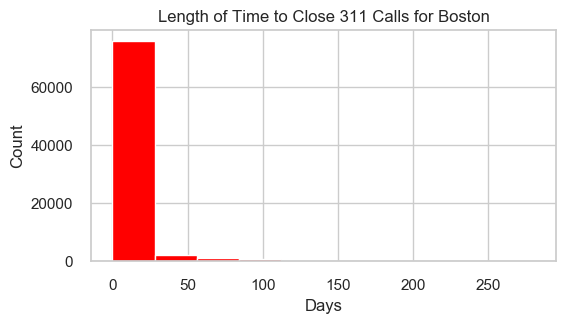

In [338]:
## Plotting the one year boston df for close_open_diff
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timeb1.close_open_diff, color='Red', bins= 10)
plt.title('Length of Time to Close 311 Calls for Boston')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [339]:
## Describe statement for the chicago time analysis
df_timec.closed_created_diff.describe()

count    998204.000000
mean         11.361499
std          32.429609
min           0.000000
25%           0.000000
50%           0.000000
75%           4.000000
max         304.000000
Name: closed_created_diff, dtype: float64

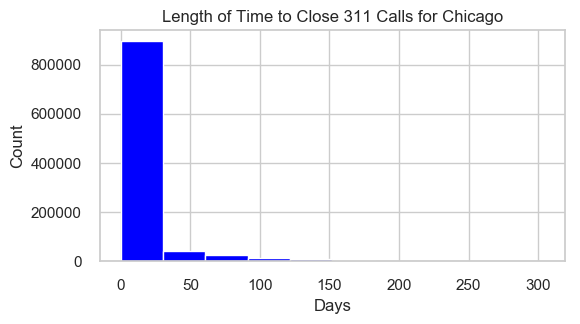

In [340]:
## Plotting the one year chicago df for close_created_diff
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timec.closed_created_diff, color='Blue', bins= 10)
plt.title('Length of Time to Close 311 Calls for Chicago')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [341]:
## describe statment for df_times
df_times.closed_created_diff.describe()

count    60613.000000
mean         4.491182
std         16.351005
min          0.000000
25%          0.000000
50%          0.000000
75%          3.000000
max        271.000000
Name: closed_created_diff, dtype: float64

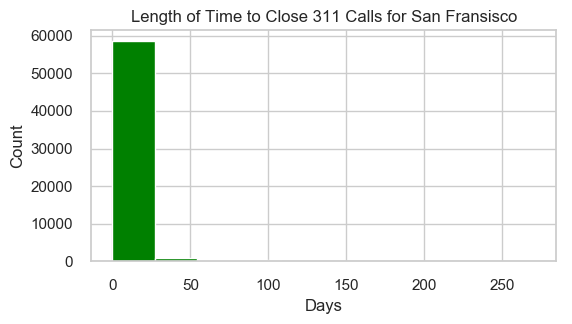

In [342]:
## Plotting the one year San Fransisco df for close_created_diff
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_times.closed_created_diff, color='Green', bins= 10)
plt.title('Length of Time to Close 311 Calls for San Fransisco')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [343]:
## describe statment for the df_timeN closed_created_diff
df_timeN.closed_created_diff.describe().round(3)

count    1014598.000
mean           8.005
std           21.663
min            0.000
25%            0.000
50%            1.000
75%            5.000
max          299.000
Name: closed_created_diff, dtype: float64

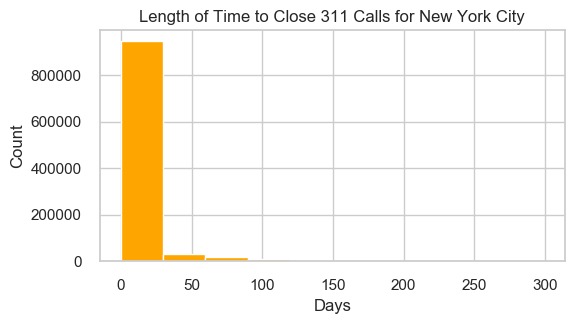

In [344]:
## Plotting the one year NYC df for close_created_diff
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timeN.closed_created_diff, color='Orange', bins= 10)
plt.title('Length of Time to Close 311 Calls for New York City')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [345]:
a=df_timeb1.close_open_diff
b=df_timec.closed_created_diff
c=df_times.closed_created_diff
d=df_timeN.closed_created_diff

In [346]:
print('a Mean Value is ', a.mean())
print('b Mean Value is ', b.mean())
print('c Mean Value is ', c.mean())
print('d Mean Value is ', d.mean())

a Mean Value is  5.559309365423425
b Mean Value is  11.361499252657774
c Mean Value is  4.491181759688516
d Mean Value is  8.004929045789565


In [347]:
# function for calculating the t-test for two independent samples (Boston and Chicago)
def independent_ttest(data1, data2, alpha):
    # calculate means
    mean1, mean2 = mean(data1), mean(data2)
    
    # calculate standard errors
    se1, se2 = sem(data1), sem(data2)
    
    # standard error on the difference between the samples
    sed = sqrt(se1**2.0 + se2**2.0)
    
    # calculate the t statistic
    t_stat = (mean1 - mean2) / sed
    # degrees of freedom
    df = len(data1) + len(data2) - 2
    
    # calculate the critical value
    cv = t.ppf(1.0 - alpha, df)
    
    # calculate the p-value
    p = (1.0 - t.cdf(abs(t_stat), df)) * 2.0
    # return everything
    
    return t_stat, df, cv, p
 
# seed the random number generator
#seed(1)
# generate two independent samples
data1 = a
data2 = b
# calculate the t test
alpha = 0.05
t_stat, df, cv, p = independent_ttest(data1, data2, alpha)
print('t=%.3f, df=%d, cv=%.3f, p=%.3f' % (t_stat, df, cv, p))
# interpret via critical value
if abs(t_stat) <= cv:
    print('Accept null hypothesis for Critical Value that the means between Boston and Chicago are equal.')
else:
    print('Reject the null hypothesis for Critical Value that the means between Boston and Chicago are equal.')
# interpret via p-value
if p > alpha:
    print('Accept null hypothesis that the means for p value between Boston and Chicago are equal.')
else:
    print('Reject the null hypothesis that the means for p value between Boston and Chicago are equal.')

t=-75.889, df=1078476, cv=1.645, p=0.000
Reject the null hypothesis for Critical Value that the means between Boston and Chicago are equal.
Reject the null hypothesis that the means for p value between Boston and Chicago are equal.


In [348]:
# function for calculating the t-test for two independent samples (Boston and San Fransisco)
def independent_ttest(data1, data2, alpha):
    # calculate means
    mean1, mean2 = mean(data1), mean(data2)
    
    # calculate standard errors
    se1, se2 = sem(data1), sem(data2)
    
    # standard error on the difference between the samples
    sed = sqrt(se1**2.0 + se2**2.0)
    
    # calculate the t statistic
    t_stat = (mean1 - mean2) / sed
    # degrees of freedom
    df = len(data1) + len(data2) - 2
    
    # calculate the critical value
    cv = t.ppf(1.0 - alpha, df)
    
    # calculate the p-value
    p = (1.0 - t.cdf(abs(t_stat), df)) * 2.0
    # return everything
    
    return t_stat, df, cv, p
 
# seed the random number generator
#seed(1)
# generate two independent samples
data1 = a
data2 = c
# calculate the t test
alpha = 0.05
t_stat, df, cv, p = independent_ttest(data1, data2, alpha)
print('t=%.3f, df=%d, cv=%.3f, p=%.3f' % (t_stat, df, cv, p))
# interpret via critical value
if abs(t_stat) <= cv:
    print('Accept null hypothesis for Critical Value that the means between Boston and San Fransisco are equal.')
else:
    print('Reject the null hypothesis for Critical Value that the means between Boston and San Fransisco are equal.')
# interpret via p-value
if p > alpha:
    print('Accept null hypothesis that the means for p value between Boston and San Fransisco are equal.')
else:
    print('Reject the null hypothesis that the means for p value between Boston and San Fransisco are equal.')

t=11.134, df=140885, cv=1.645, p=0.000
Reject the null hypothesis for Critical Value that the means between Boston and San Fransisco are equal.
Reject the null hypothesis that the means for p value between Boston and San Fransisco are equal.


In [349]:
# function for calculating the t-test for two independent samples (Boston verses NYC)
def independent_ttest(data1, data2, alpha):
    # calculate means
    mean1, mean2 = mean(data1), mean(data2)
    
    # calculate standard errors
    se1, se2 = sem(data1), sem(data2)
    
    # standard error on the difference between the samples
    sed = sqrt(se1**2.0 + se2**2.0)
    
    # calculate the t statistic
    t_stat = (mean1 - mean2) / sed
    # degrees of freedom
    df = len(data1) + len(data2) - 2
    
    # calculate the critical value
    cv = t.ppf(1.0 - alpha, df)
    
    # calculate the p-value
    p = (1.0 - t.cdf(abs(t_stat), df)) * 2.0
    # return everything
    
    return t_stat, df, cv, p
 
# seed the random number generator
#seed(1)
# generate two independent samples
data1 = a
data2 = d
# calculate the t test
alpha = 0.05
t_stat, df, cv, p = independent_ttest(data1, data2, alpha)
print('t=%.3f, df=%d, cv=%.3f, p=%.3f' % (t_stat, df, cv, p))
# interpret via critical value
if abs(t_stat) <= cv:
    print('Accept null hypothesis for Critical Value that the means between Boston and New York City are equal.')
else:
    print('Reject the null hypothesis for Critical Value that the means between Boston and New York City are equal.')
# interpret via p-value
if p > alpha:
    print('Accept null hypothesis that the means for p value between Boston and New York City are equal.')
else:
    print('Reject the null hypothesis that the means for p value between Boston and New York City are equal.')

t=-33.738, df=1094870, cv=1.645, p=0.000
Reject the null hypothesis for Critical Value that the means between Boston and New York City are equal.
Reject the null hypothesis that the means for p value between Boston and New York City are equal.


In [350]:
## Column check fo df_timec
df_timec.head(150)

,SR_NUMBER,SR_TYPE,SR_SHORT_CODE,OWNER_DEPARTMENT,STATUS,CREATED_DATE,LAST_MODIFIED_DATE,CLOSED_DATE,STREET_ADDRESS,CITY,...,SANITATION_DIVISION_DAYS,CREATED_HOUR,CREATED_DAY_OF_WEEK,CREATED_MONTH,X_COORDINATE,Y_COORDINATE,LATITUDE,LONGITUDE,LOCATION,closed_created_diff
0,SR19-00000003,Street Light Out Complaint,SFD,CDOT - Department of Transportation,Completed,2019-01-01 00:11:00,5/16/2019 16:41,2019-01-17 12:13:00,5701 S SAINT LOUIS AVE,NaN,...,Wednesday,0,3,1,1154090.409,1866552.749,41.789646,-87.710539,"(41.789646, -87.710539)",16
1,SR19-00000006,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:18:00,5/16/2019 16:41,2019-01-02 12:31:00,1650 W HOWARD ST,NaN,...,Monday,0,3,1,1163764.314,1950407.038,42.019550,-87.672700,"(42.01955, -87.6727)",1
2,SR19-00000008,Water On Street Complaint,AAE,DWM - Department of Water Management,Completed,2019-01-01 00:20:00,5/16/2019 16:40,2019-01-02 12:30:00,1400 W GREENLEAF AVE,NaN,...,Monday,0,3,1,1165627.095,1947076.146,42.010371,-87.665940,"(42.01037081, -87.66593962)",1
3,SR19-00000012,Garbage Cart Maintenance,SIE,Streets and Sanitation,Completed,2019-01-01 00:23:00,5/16/2019 16:41,2019-02-16 12:33:00,5017 W GUNNISON ST,NaN,...,Wednesday,0,3,1,1141971.021,1931705.199,41.968665,-87.753364,"(41.968665, -87.753364)",46
4,SR19-00000014,Tree Removal Request,SEE,Streets and Sanitation,Completed,2019-01-01 00:25:00,5/16/2019 16:41,2019-04-01 08:12:00,12100 S ELIZABETH ST,NaN,...,Tuesday,0,3,1,1170109.454,1824453.689,41.673795,-87.653027,"(41.6737945957448, -87.65302695628411)",90
5,SR19-00000015,Sidewalk Inspection Request,PBS,CDOT - Department of Transportation,Completed,2019-01-01 00:26:00,10/28/2019 15:15,2019-10-28 15:15:00,5149 W OAKDALE AVE,NaN,...,Thursday,0,3,1,1141338.894,1919041.537,41.933926,-87.756002,"(41.933926, -87.756002)",300
6,SR19-00000020,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:31:00,5/16/2019 16:41,2019-01-01 00:31:00,2111 W Lexington ST,NaN,...,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)",0
7,SR19-00000022,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:32:00,5/16/2019 16:41,2019-01-01 00:32:00,2111 W Lexington ST,NaN,...,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)",0
8,SR19-00000023,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:33:00,5/16/2019 16:41,2019-01-01 00:33:00,2111 W Lexington ST,NaN,...,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)",0
9,SR19-00000027,311 INFORMATION ONLY CALL,311IOC,311 City Services,Completed,2019-01-01 00:35:00,5/16/2019 16:41,2019-01-01 00:35:00,2111 W Lexington ST,NaN,...,Friday,0,3,1,1162234.142,1896559.967,41.871823,-87.679841,"(41.871823, -87.679841)",0


In [351]:
## checking unique values for df_timec owner_department
df_timec.OWNER_DEPARTMENT.unique()

array(['CDOT - Department of Transportation',
       'DWM - Department of Water Management', 'Streets and Sanitation',
       '311 City Services', 'Aviation', 'Animal Care and Control',
       'BACP - Business Affairs and Consumer Protection', 'Health',
       "City Clerk's Office", 'Department of Planning and Development',
       'DOB - Buildings', 'Extreme Weather Notification',
       'DoIT - Department of Innovation & Technology'], dtype=object)

In [352]:
## Creating a unique df_timeb1_btdt that filters on department = BTDT
df_timeb1_btdt=df_timeb1[df_timeb1['department']=="BTDT"]
df_timeb1_btdt.count()

ontime                            23583
source                            23583
city_council_district             23583
fire_district                     23583
subject                           23583
pwd_district                      23583
department                        23583
neighborhood_services_district    23583
police_district                   23583
type                              23583
precinct                          23583
latitude                          23583
longitude                         23583
ward                              23583
neighborhood                      23583
reason                            23583
submittedphoto                    11881
closed_dt                         23583
open_dt                           23583
target_dt                         23583
ontime_t                          23583
source_t                          23583
source_t2                         23583
city_council_district_t           23583
fire_district_t                   23583


In [353]:
## Creating a unique df_timeb1_pwdx that filters on department = pwdx
df_timeb1_pwdx=df_timeb1[df_timeb1['department']=="PWDx"]
df_timeb1_pwdx.count()

ontime                            45925
source                            45925
city_council_district             45925
fire_district                     45925
subject                           45925
pwd_district                      45925
department                        45925
neighborhood_services_district    45925
police_district                   45925
type                              45925
precinct                          45925
latitude                          45925
longitude                         45925
ward                              45925
neighborhood                      45925
reason                            45925
submittedphoto                    22140
closed_dt                         45925
open_dt                           45925
target_dt                         45925
ontime_t                          45925
source_t                          45925
source_t2                         45925
city_council_district_t           45925
fire_district_t                   45925


In [354]:
## Creating a unique df_timec_cdot that filters on department = cdot
df_timec_cdot=df_timec[df_timec["OWNER_DEPARTMENT"]=="CDOT - Department of Transportation"]
df_timec_cdot.count()

SR_NUMBER                   189427
SR_TYPE                     189427
SR_SHORT_CODE               189427
OWNER_DEPARTMENT            189427
STATUS                      189427
CREATED_DATE                189427
LAST_MODIFIED_DATE          189427
CLOSED_DATE                 189427
STREET_ADDRESS              188655
CITY                           381
STATE                          381
ZIP_CODE                    183550
STREET_NUMBER               188587
STREET_DIRECTION            188589
STREET_NAME                 188626
STREET_TYPE                 187264
DUPLICATE                   189427
LEGACY_RECORD               189427
LEGACY_SR_NUMBER                 0
PARENT_SR_NUMBER             62412
COMMUNITY_AREA              187116
WARD                        187144
ELECTRICAL_DISTRICT          72362
ELECTRICITY_GRID            186892
POLICE_SECTOR               187161
POLICE_DISTRICT             187162
POLICE_BEAT                 187161
PRECINCT                    186963
SANITATION_DIVISION_

In [355]:
## Creating a unique df_timec_dwm that filters on department = dwm
df_timec_dwm=df_timec[df_timec["OWNER_DEPARTMENT"]=="DWM - Department of Water Management"]
df_timec_dwm.count()

SR_NUMBER                   32612
SR_TYPE                     32612
SR_SHORT_CODE               32612
OWNER_DEPARTMENT            32612
STATUS                      32612
CREATED_DATE                32612
LAST_MODIFIED_DATE          32612
CLOSED_DATE                 32612
STREET_ADDRESS              32504
CITY                           77
STATE                          77
ZIP_CODE                    31475
STREET_NUMBER               32500
STREET_DIRECTION            32462
STREET_NAME                 32503
STREET_TYPE                 32013
DUPLICATE                   32612
LEGACY_RECORD               32612
LEGACY_SR_NUMBER                0
PARENT_SR_NUMBER             3270
COMMUNITY_AREA              32383
WARD                        32385
ELECTRICAL_DISTRICT          8561
ELECTRICITY_GRID            32323
POLICE_SECTOR               32369
POLICE_DISTRICT             32367
POLICE_BEAT                 32369
PRECINCT                    32358
SANITATION_DIVISION_DAYS     8548
CREATED_HOUR  

In [356]:
## Describe statment for df_timeb1_btdt
df_timeb1_btdt.close_open_diff.describe().round(3)

count    23583.000
mean         3.420
std         13.653
min          0.000
25%          0.000
50%          0.000
75%          0.000
max        281.000
Name: close_open_diff, dtype: float64

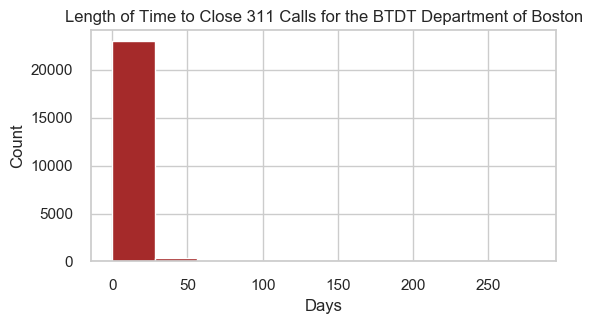

In [357]:
## count plot for df_timeb1_btdt
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timeb1_btdt.close_open_diff, color= ('brown'), bins= 10)
plt.title('Length of Time to Close 311 Calls for the BTDT Department of Boston')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [358]:
## Describe statment for df_timeb1_pwdx
df_timeb1_pwdx.close_open_diff.describe().round(3)

count    45925.000
mean         4.737
std         18.691
min          0.000
25%          0.000
50%          0.000
75%          1.000
max        279.000
Name: close_open_diff, dtype: float64

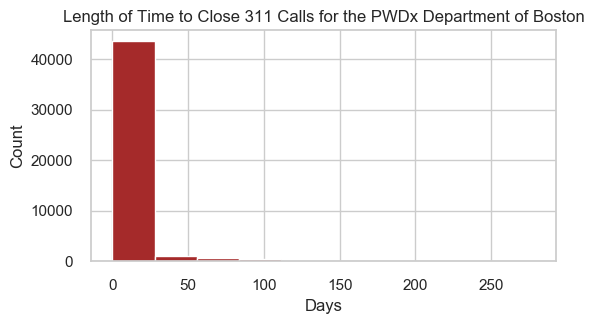

In [359]:
## count plot for df_timeb1_pwdx
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timeb1_pwdx.close_open_diff, color=('brown'), bins= 10)
plt.title('Length of Time to Close 311 Calls for the PWDx Department of Boston')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [360]:
## Describe statment for df_timec
df_timec_cdot.closed_created_diff.describe().round(3)

count    189427.000
mean         31.871
std          51.336
min           0.000
25%           1.000
50%          10.000
75%          36.000
max         304.000
Name: closed_created_diff, dtype: float64

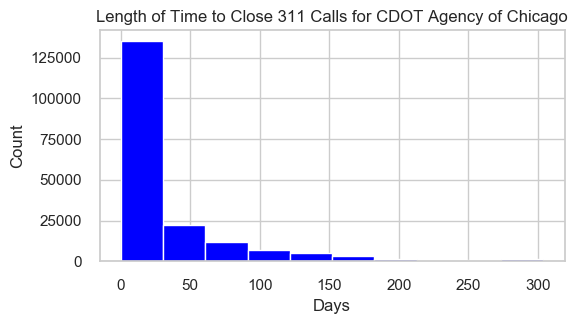

In [361]:
## count plot for df_timec_cdot
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timec_cdot.closed_created_diff, color='blue', bins= 10)
plt.title('Length of Time to Close 311 Calls for CDOT Agency of Chicago')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [362]:
## Describe statment for df_timec_dwm
df_timec_dwm.closed_created_diff.describe().round(3)

count    32612.000
mean        18.874
std         42.627
min          0.000
25%          0.000
50%          1.000
75%         10.000
max        301.000
Name: closed_created_diff, dtype: float64

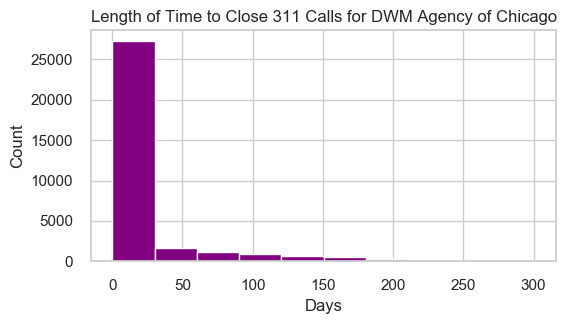

In [363]:
## count plot for df_timec_dwm
count, ax = plt.subplots(figsize=(6,3))
plt.hist(df_timec_dwm.closed_created_diff, color='purple', bins= 10)
plt.title('Length of Time to Close 311 Calls for DWM Agency of Chicago')
plt.ylabel('Count')
plt.xlabel('Days')
plt.show()

In [364]:
# function for calculating the t-test for two independent samples (Boston verses chicago)
def independent_ttest(data1, data2, alpha):
    # calculate means
    mean1, mean2 = mean(data1), mean(data2)
    
    # calculate standard errors
    se1, se2 = sem(data1), sem(data2)
    
    # standard error on the difference between the samples
    sed = sqrt(se1**2.0 + se2**2.0)
    
    # calculate the t statistic
    t_stat = (mean1 - mean2) / sed
    # degrees of freedom
    df = len(data1) + len(data2) - 2
    
    # calculate the critical value
    cv = t.ppf(1.0 - alpha, df)
    
    # calculate the p-value
    p = (1.0 - t.cdf(abs(t_stat), df)) * 2.0
    # return everything
    
    return t_stat, df, cv, p
 
# seed the random number generator
#seed(1)
# generate two independent samples
data1 = df_timeb1_pwdx.close_open_diff
data2 = df_timec_dwm.closed_created_diff
# calculate the t test
alpha = 0.05
t_stat, df, cv, p = independent_ttest(data1, data2, alpha)
print('t=%.3f, df=%d, cv=%.3f, p=%.3f' % (t_stat, df, cv, p))
# interpret via critical value
if abs(t_stat) <= cv:
    print('Accept null hypothesis for Critical Value that the means between Boston (PWDx) and Chicago (DWM) are equal.')
else:
    print('Reject the null hypothesis for Critical Value that the means between Boston (PWDx) and Chicago (DWM) are equal.')
# interpret via p-value
if p > alpha:
    print('Accept null hypothesis that the means for p value between  Boston (PWDx) and Chicago (DWM) are equal.')
else:
    print('Reject the null hypothesis that the means for p value between Boston (PWDx) and Chicago (DWM) are equal.')

t=-56.181, df=78535, cv=1.645, p=0.000
Reject the null hypothesis for Critical Value that the means between Boston (PWDx) and Chicago (DWM) are equal.
Reject the null hypothesis that the means for p value between Boston (PWDx) and Chicago (DWM) are equal.


In [365]:
###############################################  dataframe with missing values for closed_dt

In [366]:
## creating a time dataframe with only closed missing values 
df_misstime=df_raw_bos
df_misstime.head(2)

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,1.010000e+11,2011-07-01 02:28:00,2011-08-15 02:28:00,2011-08-01 15:21:00,ONTIME,Closed,Case Closed Case Resolved No Sidewalk and poor...,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,E5,West Roxbury,12,Ward 20,2017,INTERSECTION Corey St & Lagrange St,NaN,42.3003,-71.1698,Self Service
1,1.010000e+11,2011-07-01 03:03:00,2011-07-15 03:03:00,2011-07-22 16:13:00,OVERDUE,Closed,Case Closed Case Resolved completed,Street Light Outages,Public Works Department,Street Lights,...,E18,Hyde Park,10,Ward 18,1816,235 Fairmount Ave,2136.0,42.2496,-71.1156,Self Service


In [367]:
## Creating a new column for missing values only 
df_misstime['closed_dt_t']=df_misstime['closed_dt']
df_misstime.head(3)

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source,closed_dt_t
0,1.010000e+11,2011-07-01 02:28:00,2011-08-15 02:28:00,2011-08-01 15:21:00,ONTIME,Closed,Case Closed Case Resolved No Sidewalk and poor...,New Sign Crosswalk or Pavement Marking,Transportation - Traffic Division,Signs & Signals,...,West Roxbury,12,Ward 20,2017,INTERSECTION Corey St & Lagrange St,NaN,42.3003,-71.1698,Self Service,2011-08-01 15:21:00
1,1.010000e+11,2011-07-01 03:03:00,2011-07-15 03:03:00,2011-07-22 16:13:00,OVERDUE,Closed,Case Closed Case Resolved completed,Street Light Outages,Public Works Department,Street Lights,...,Hyde Park,10,Ward 18,1816,235 Fairmount Ave,2136.0,42.2496,-71.1156,Self Service,2011-07-22 16:13:00
2,1.010000e+11,2011-07-01 03:12:00,NaT,2011-07-01 06:12:00,ONTIME,Closed,Case Closed Case Resolved,Highway Maintenance,Public Works Department,Highway Maintenance,...,Dorchester,7,Ward 13,1309,INTERSECTION Dorchester Ave & Hallam St,NaN,42.3144,-71.0569,Constituent Call,2011-07-01 06:12:00


In [368]:
########################################### Latitude and Longitude ##########################################

In [369]:
## Describe statement for latitude
df1.latitude.describe()

count    207386.000000
mean         42.336009
std           0.031863
min          42.231500
25%          42.315500
50%          42.347000
75%          42.359400
max          42.395100
Name: latitude, dtype: float64

In [370]:
## Describe statement for longitude 
df1.longitude.describe()

count    207386.000000
mean        -71.077197
std           0.032980
min         -71.185400
25%         -71.091500
50%         -71.065000
75%         -71.058700
max         -70.994900
Name: longitude, dtype: float64

In [371]:
# Total missing values for each feature
print(df1.isnull().sum())

ontime                                 0
source                                 0
city_council_district                  0
fire_district                          0
subject                                0
pwd_district                           0
department                             0
neighborhood_services_district         0
police_district                        0
type                                   0
precinct                               0
latitude                               0
longitude                              0
ward                                   0
neighborhood                           0
reason                                 0
submittedphoto                    113945
closed_dt                              0
open_dt                                0
target_dt                              0
ontime_t                               0
source_t                               0
source_t2                              0
city_council_district_t                0
fire_district_t 

In [372]:
#################################################### Pandas Profile###########################

In [373]:
## Importing and running pandas profile statement for all new attributes 
import pandas_profiling
pandas_profiling.ProfileReport(df1)

Number of variables,47
Number of observations,207386
Total Missing (%),1.2%
Total size in memory,74.4 MiB
Average record size in memory,376.0 B
Numeric,20
Categorical,19
Boolean,3
Date,3
Text (Unique),0
Rejected,2


In [374]:
########################################### Correlation Matrix Plots for analysis #####################################

In [423]:
## Column Check for the df_raw
df_raw_bos.columns


Index(['case_enquiry_id', 'open_dt', 'target_dt', 'closed_dt', 'ontime',
       'case_status', 'closure_reason', 'case_title', 'subject', 'reason',
       'type', 'queue', 'department', 'submittedphoto', 'closedphoto',
       'location', 'fire_district', 'pwd_district', 'city_council_district',
       'police_district', 'neighborhood', 'neighborhood_services_district',
       'ward', 'precinct', 'location_street_name', 'location_zipcode',
       'latitude', 'longitude', 'source', 'closed_dt_t'],
      dtype='object')

In [424]:
## Column check for the df1
df1.columns

Index(['ontime', 'source', 'city_council_district', 'fire_district', 'subject',
       'pwd_district', 'department', 'neighborhood_services_district',
       'police_district', 'type', 'precinct', 'latitude', 'longitude', 'ward',
       'neighborhood', 'reason', 'submittedphoto', 'closed_dt', 'open_dt',
       'target_dt', 'ontime_t', 'source_t', 'source_t2',
       'city_council_district_t', 'fire_district_t', 'fire_district_t2',
       'subject_t', 'subject_t2', 'pwd_district_t', 'department_t',
       'department_t2', 'police_district_t', 'neighborhood_t', 'ward_t',
       'reason_t', 'type_t', 'precinct_t', 'submittedphoto_t',
       'neighborhood_t2', 'close_target_diff', 'close_open_diff',
       'target_open_diff', 'week', 'day', 'day_of_week', 'day_of_week_t'],
      dtype='object')

In [425]:
## Converting objects in columns over to integers for analysis 
cols = ['city_council_district_t', 'ontime_t',
       'neighborhood_services_district',
       'precinct', 'latitude', 'longitude',
       'city_council_district_t', 'fire_district_t',
       'fire_district_t2', 'subject_t', 'subject_t2', 'pwd_district_t',
       'department_t', 'department_t2', 'police_district_t',
       'submittedphoto_t']  # We don't want to convert the Final grade column.
for col in cols:  # Iterate over chosen columns
    df1[col] = pd.to_numeric(df1[col])

In [426]:
## Creating correlation dataset for analysis 
df_corr = df1[['ontime_t', 'source_t', 'city_council_district_t', 'fire_district_t', 'subject_t', 'pwd_district_t', 
                 'department_t','neighborhood_services_district','police_district_t',
                  'neighborhood_t', 'ward_t', 'reason_t', 'type_t','precinct','submittedphoto_t']]
df_corr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 606536 to 906550
Data columns (total 15 columns):
ontime_t                          207386 non-null int64
source_t                          207386 non-null int64
city_council_district_t           207386 non-null int64
fire_district_t                   207386 non-null int64
subject_t                         207386 non-null int64
pwd_district_t                    207386 non-null int64
department_t                      207386 non-null int64
neighborhood_services_district    207386 non-null int64
police_district_t                 207386 non-null int64
neighborhood_t                    207386 non-null int64
ward_t                            207386 non-null int64
reason_t                          207386 non-null int64
type_t                            207386 non-null int64
precinct                          207386 non-null int64
submittedphoto_t                  207386 non-null int64
dtypes: int64(15)
memory usage: 35.3 MB


In [427]:
## Correlation describe statment for ontime only 
df_corr.ontime_t.describe()

count    207386.000000
mean          0.135824
std           0.342602
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: ontime_t, dtype: float64

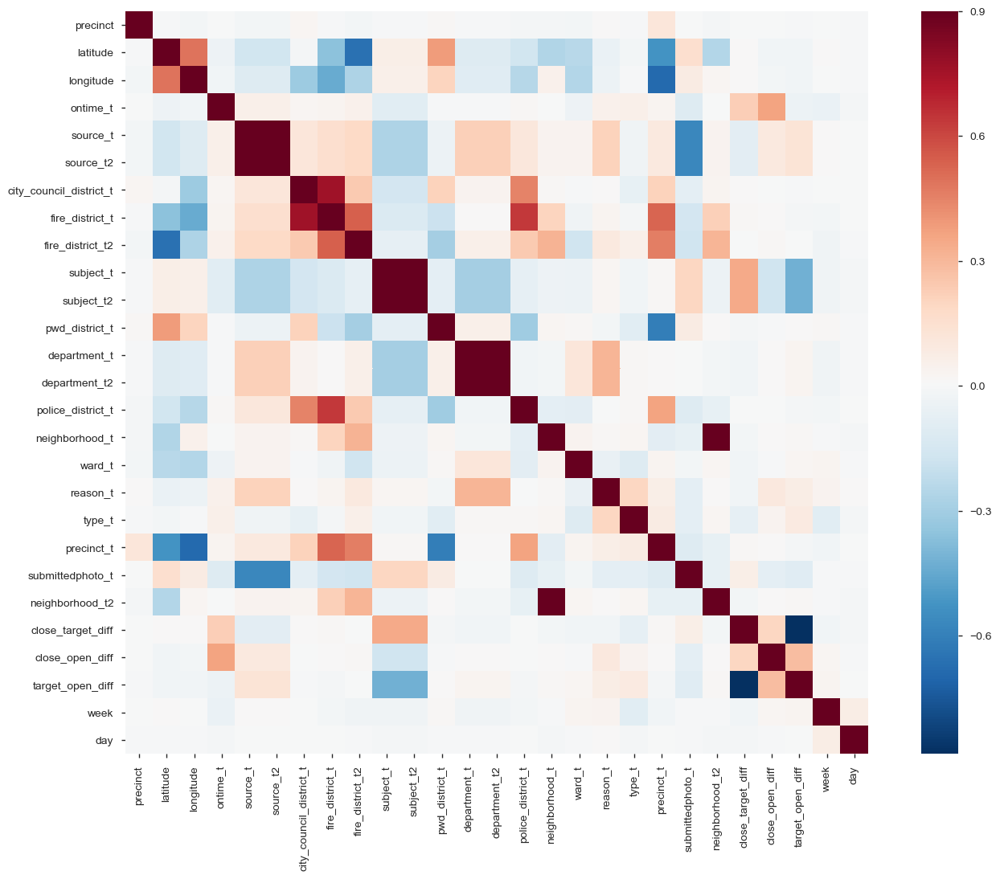

In [428]:
## The correlations between dependent variable and independent variables for all numerical datapoints
corr2 = df1.select_dtypes(include = ['float64', 'int64']).iloc[:, 1:].corr()
plt.figure(figsize=(17, 12))
sns.heatmap(corr2, vmax = 0.9, cmap = 'RdBu_r', square = True)
plt.show()

In [429]:
# The correlations between the dependent variable and independent variables for all numerical datapoints

corr2 = df1.select_dtypes(include = ['float64', 'int64']).iloc[:, 1:].corr()


## rank the correlation
corr_price = corr2['ontime_t']
corr_df = pd.DataFrame({'Column': corr_price.index, 
                        'Correlation': corr_price,
                        'Abs Value': abs(corr_price)}, index = None)
corr_df = corr_df.drop(['ontime_t'], axis = 0)
corr_df.set_index('Column', inplace = True)
corr_df = corr_df.rename_axis(None)
corr_df = corr_df.sort_values(by = ['Abs Value'], ascending = [False])
corr_df.iloc[:, 1:2]

,Abs Value
close_open_diff,0.367696
close_target_diff,0.224970
submittedphoto_t,0.105952
subject_t2,0.094614
subject_t,0.094614
source_t,0.063681
source_t2,0.063681
type_t,0.063116
reason_t,0.051999
week,0.050667


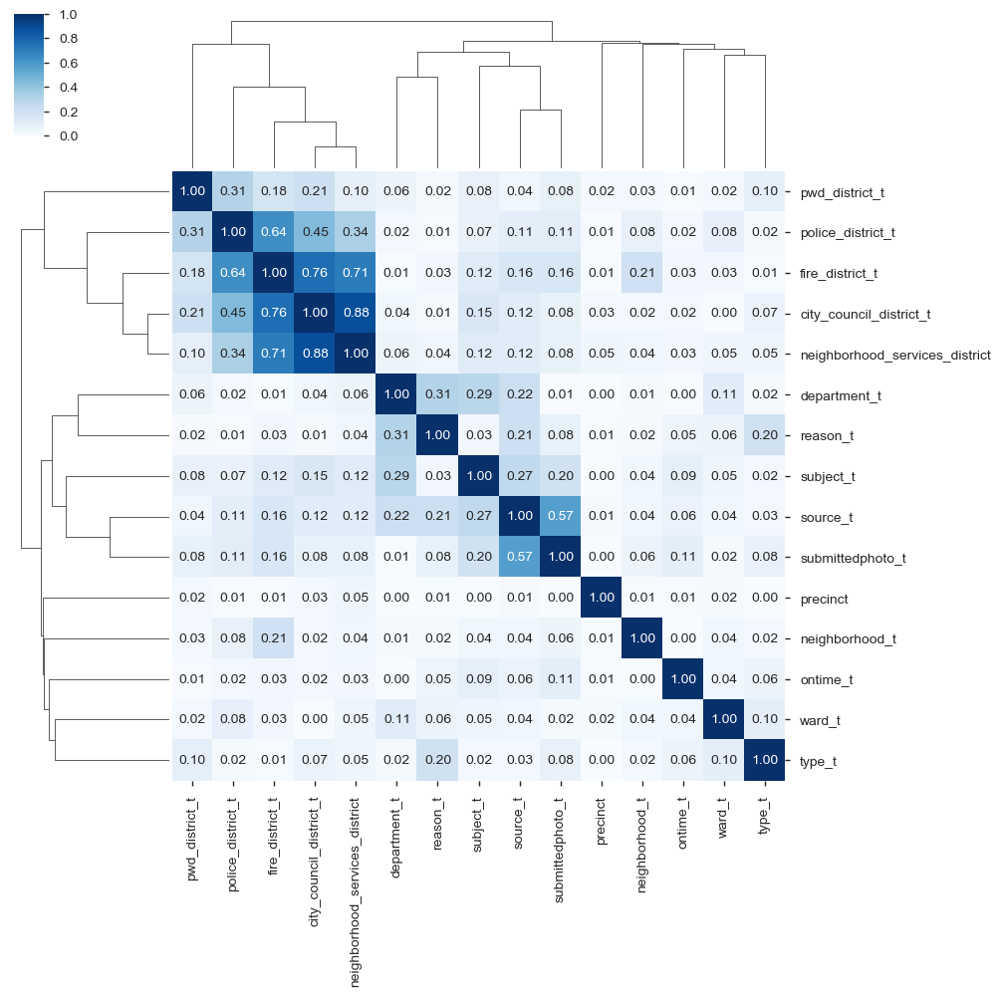

In [430]:
## Creating a seaborn cluster map to determine which variables are related to each other 
sns.clustermap(data=df_corr.corr().abs(), annot=True, fmt=".2f", cmap ="Blues")
plt.show()

In [431]:
####################################### Bivariate and Descriptive Statistical Analysis 

In [432]:
## Saving the panda dataframe of the boston file to a csv file
submit=pd.DataFrame(data=df1)
submit.to_csv('311boston03nov.csv',index=True)

In [433]:
## Creating a new dataframe for the bivariate analysis 
df2=df1
df2.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
606536,ONTIME,Citizens Connect App,1,3,Public Works Department,1B,PWDx,3,A1,Improper Storage of Trash (Barrels),...,27,1,3,-3,0,3,39,1,Sunday,7
606537,ONTIME,Employee Generated,7,9,Public Works Department,10A,PWDx,13,D4,Street Light Outages,...,37,0,4,-17,0,16,39,1,Sunday,7


In [434]:
## Checking the total counts for the attributes
df2.count()

ontime                            207386
source                            207386
city_council_district             207386
fire_district                     207386
subject                           207386
pwd_district                      207386
department                        207386
neighborhood_services_district    207386
police_district                   207386
type                              207386
precinct                          207386
latitude                          207386
longitude                         207386
ward                              207386
neighborhood                      207386
reason                            207386
submittedphoto                     93441
closed_dt                         207386
open_dt                           207386
target_dt                         207386
ontime_t                          207386
source_t                          207386
source_t2                         207386
city_council_district_t           207386
fire_district_t 

In [435]:
# Shape of the Data and creating a sample size of 100%
df2=df2.sample(frac=1, random_state=99)
df2.shape

(207386, 46)

In [436]:
##################### Summary Statistics for these Attributes with the ontime_t target variable

In [437]:
## Stats Models for select attributes
print(stats.normaltest(df2['ontime_t'], axis=0))

NormaltestResult(statistic=77714.86265830144, pvalue=0.0)


In [438]:
## Stats Model Results for target and source_t
results = ols('ontime_t ~ C(source_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     433.0
Date:                Sun, 10 Nov 2019   Prob (F-statistic):               0.00
Time:                        05:33:57   Log-Likelihood:                -70828.
No. Observations:              207386   AIC:                         1.417e+05
Df Residuals:                  207379   BIC:                         1.417e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            0.1223      0.001    114.571      0.000       0.120       0.124
C(source_t)[T.2]    -0.0589      0.002    -24.904      0.000      -0.064      -0.054
C(source_t)[T.3]     0.0590      0.002     34.851      0.000       0.056       0.062
C(source_t)[T.4]     0.0185      0.004      4.575      0.000       0.011       0.026
C(source_t)[T.5]    -0.1223      0.241     -0.508      0.612      -0.594       0.350
C(source_t)[T.6]     0.0506      0.005     10.170      0.000       0.041       0.060
C(source_t)[T.7]     0.0905      0.050      1.822      0.068      -0.007       0.188
==============================================================================
Omnibus:                    75945.663   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           202010.965
Skew:                           2.085   Prob(JB):                         0.00
Kurtosis:                       5.448   Cond. No.                         344.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [439]:
## Tukey and Multicomparison Models for target and source_t
mc = MultiComparison(df2['ontime_t'], df2['source_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  1      2    -0.0589  -0.0658 -0.0519  True 
  1      3     0.059    0.054   0.064   True 
  1      4     0.0185   0.0066  0.0305  True 
  1      5    -0.1223  -0.8321  0.5876 False 
  1      6     0.0506   0.0359  0.0653  True 
  1      7     0.0905  -0.0559  0.237  False 
  2      3     0.1179   0.1106  0.1252  True 
  2      4     0.0774   0.0643  0.0905  True 
  2      5    -0.0634  -0.7732  0.6465 False 
  2      6     0.1095   0.0938  0.1251  True 
  2      7     0.1494   0.0028  0.2959  True 
  3      4    -0.0405  -0.0527 -0.0283  True 
  3      5    -0.1813  -0.8911  0.5285 False 
  3      6    -0.0084  -0.0233  0.0064 False 
  3      7     0.0315   -0.115  0.178  False 
  4      5    -0.1408  -0.8507  0.5691 False 
  4      6     0.032    0.0137  0.0504  True 
  4      7     0.072   -0.0749  0.2188 False 
  5      6     0.1728  -0.537

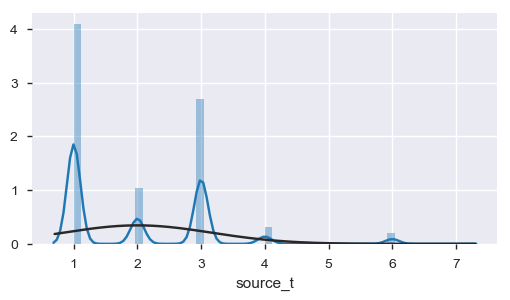

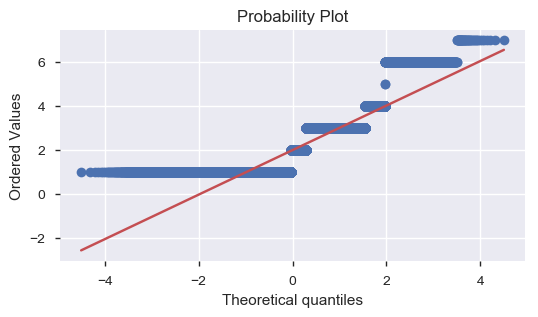

In [440]:
#histogram and normal probability plot for source_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['source_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['source_t'], plot=plt)

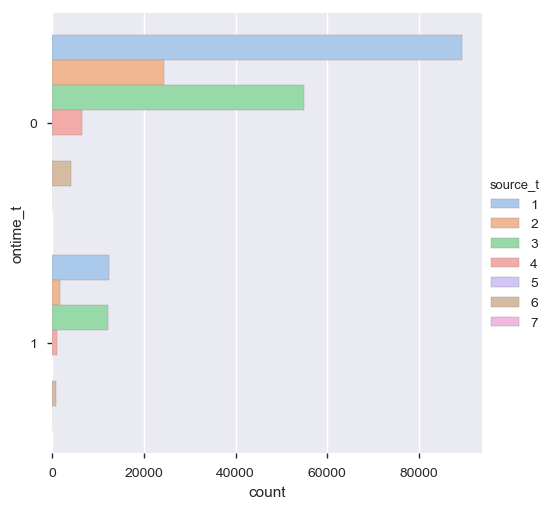

In [441]:
## Barplot and Countplot in Seaborn with source and target
sns.catplot(y="ontime_t", 
            hue="source_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [442]:
## Stats Model Results for target and city council district_t
results = ols('ontime_t ~ C(city_council_district_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     69.01
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          9.96e-128
Time:                        05:34:02   Log-Likelihood:                -71809.
No. Observations:              207386   AIC:                         1.436e+05
Df Residuals:                  207376   BIC:                         1.437e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            0.1137      0.002     59.424      0.000       0.110       0.117
C(city_council_district_t)[T.2]      0.0004      0.003      0.164      0.870      -0.005       0.005
C(city_council_district_t)[T.3]      0.0269      0.003      8.500      0.000       0.021       0.033
C(city_council_district_t)[T.4]      0.0470      0.003     13.937      0.000       0.040       0.054
C(city_council_district_t)[T.5]      0.0500      0.003     15.304      0.000       0.044       0.056
C(city_council_district_t)[T.6]      0.0418      0.003     13.374      0.000       0.036       0.048
C(city_council_district_t)[T.7]      0.0360      0.003     12.121      0.000       0.030       0.042
C(city_council_district_t)[T.8]      0.0127      0.003      4.246      0.000       0.007       0.018
C(city_council_district_t)[T.9]      0.0260      0.003      8.285      0.000       0.020       0.032
C(city_council_district_t)[T.33]     0.0467      0.007      7.131      0.000       0.034       0.060
==============================================================================
Omnibus:                    77313.212   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           209020.905
Skew:                           2.116   Prob(JB):                         0.00
Kurtosis:                       5.505   Cond. No.                         10.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [443]:
## Tukey and Multicomparison Models for target and city_council district_t
mc = MultiComparison(df2['ontime_t'], df2['city_council_district_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  1      2     0.0004  -0.0077  0.0086 False 
  1      3     0.0269   0.0169  0.037   True 
  1      4     0.047    0.0363  0.0577  True 
  1      5      0.05    0.0397  0.0603  True 
  1      6     0.0418   0.0319  0.0516  True 
  1      7     0.036    0.0266  0.0454  True 
  1      8     0.0127   0.0032  0.0221  True 
  1      9     0.026    0.016   0.0359  True 
  1      33    0.0467   0.026   0.0674  True 
  2      3     0.0265   0.0168  0.0362  True 
  2      4     0.0466   0.0362  0.057   True 
  2      5     0.0496   0.0396  0.0596  True 
  2      6     0.0413   0.0318  0.0509  True 
  2      7     0.0356   0.0266  0.0447  True 
  2      8     0.0122   0.0032  0.0213  True 
  2      9     0.0255   0.016   0.0351  True 
  2      33    0.0462   0.0257  0.0668  True 
  3      4     0.0201   0.0082  0.032   True 
  3      5     0.0231   0.011

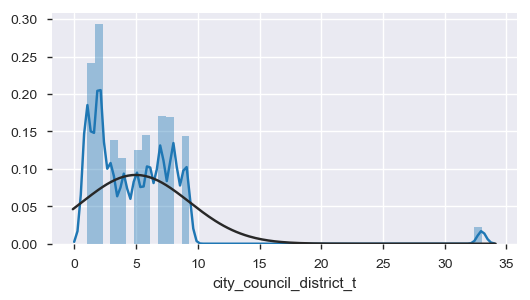

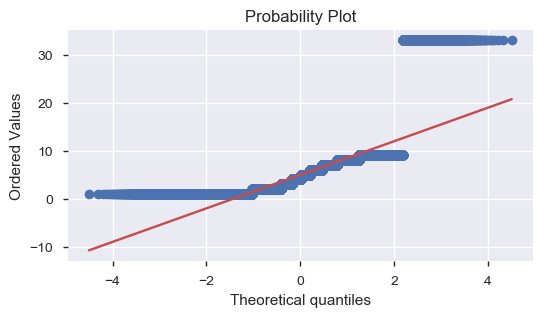

In [444]:
#histogram and normal probability plot for City Council District_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['city_council_district_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['city_council_district_t'], plot=plt)

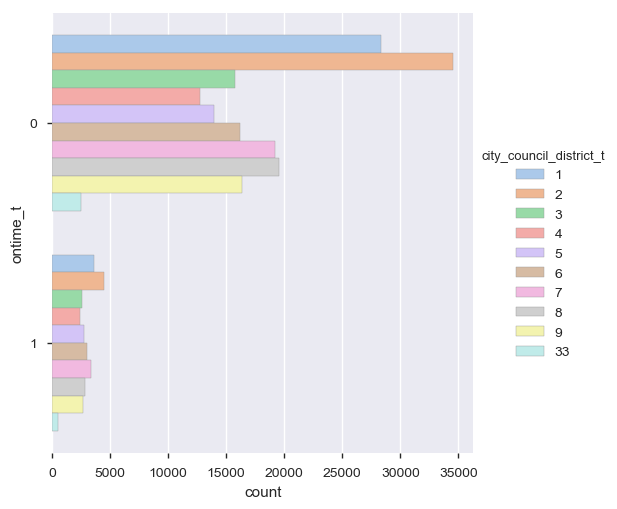

In [445]:
## Barplot and Countplot in Seaborn and city council district_t
sns.catplot(y="ontime_t", 
            hue="city_council_district_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [446]:
## Stats Model Results for target and Fire District_t2
results = ols('ontime_t ~ C(fire_district_t2)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     525.2
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          4.30e-116
Time:                        05:34:06   Log-Likelihood:                -71857.
No. Observations:              207386   AIC:                         1.437e+05
Df Residuals:                  207384   BIC:                         1.437e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                    0.1203      0.001    119.074      0.000       0.118       0.122
C(fire_district_t2)[T.2]     0.0346      0.002     22.918      0.000       0.032       0.038
==============================================================================
Omnibus:                    77377.925   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           209354.806
Skew:                           2.118   Prob(JB):                         0.00
Kurtosis:                       5.507   Cond. No.                         2.51
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [447]:
## Tukey and Multicomparison Models for target and fire district_t2
mc = MultiComparison(df2['ontime_t'], df2['fire_district_t2'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff lower  upper  reject
-------------------------------------------
  1      2     0.0346  0.0317 0.0376  True 
-------------------------------------------


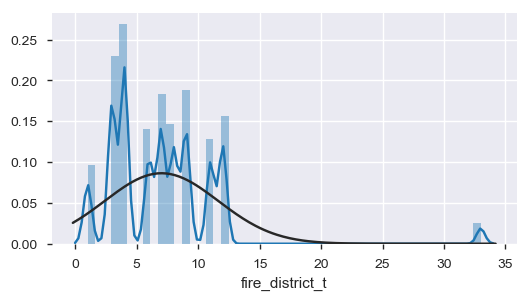

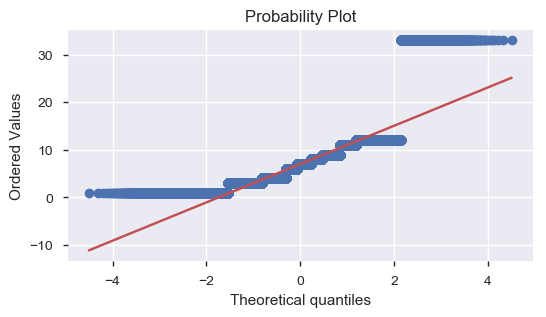

In [448]:
#histogram and normal probability plot for target and fire district_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['fire_district_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['fire_district_t'], plot=plt)

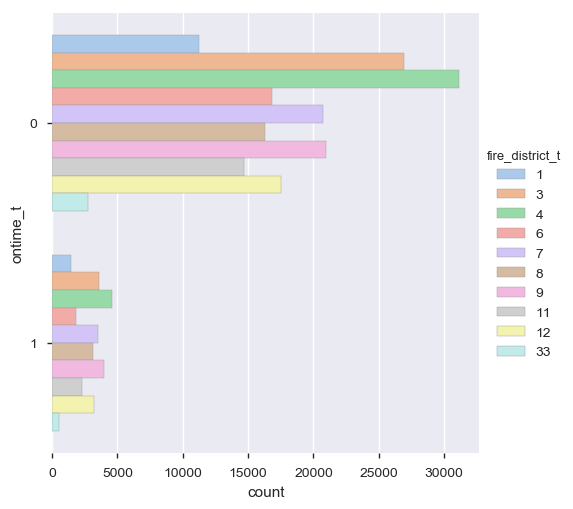

In [449]:
## Barplot and Countplot in Seaborn for fire district_t
sns.catplot(y="ontime_t", 
            hue="fire_district_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [450]:
## Stats Model Results for target and subject_t
results = ols('ontime_t ~ C(subject_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     644.2
Date:                Sun, 10 Nov 2019   Prob (F-statistic):               0.00
Time:                        05:34:11   Log-Likelihood:                -70521.
No. Observations:              207386   AIC:                         1.411e+05
Df Residuals:                  207380   BIC:                         1.411e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.2796      0.003     93.105      0.000       0.274       0.285
C(subject_t)[T.6]     -0.2154      0.010    -21.834      0.000      -0.235      -0.196
C(subject_t)[T.8]     -0.1623      0.004    -38.196      0.000      -0.171      -0.154
C(subject_t)[T.9]      0.0012      0.007      0.189      0.850      -0.012       0.014
C(subject_t)[T.10]    -0.1519      0.003    -48.043      0.000      -0.158      -0.146
C(subject_t)[T.11]    -0.1611      0.003    -48.678      0.000      -0.168      -0.155
==============================================================================
Omnibus:                    76329.916   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           204877.206
Skew:                           2.087   Prob(JB):                         0.00
Kurtosis:                       5.506   Cond. No.                         16.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [451]:
## Tukey and Multicomparison Models for target and subject_t
mc = MultiComparison(df2['ontime_t'], df2['subject_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  5      6    -0.2154  -0.2435 -0.1873  True 
  5      8    -0.1623  -0.1744 -0.1502  True 
  5      9     0.0012  -0.0175   0.02  False 
  5      10   -0.1519  -0.1609 -0.1429  True 
  5      11   -0.1611  -0.1705 -0.1517  True 
  6      8     0.0531   0.025   0.0812  True 
  6      9     0.2166   0.1851  0.2482  True 
  6      10    0.0635   0.0365  0.0904  True 
  6      11    0.0543   0.0272  0.0814  True 
  8      9     0.1636   0.1448  0.1824  True 
  8      10    0.0104   0.0014  0.0194  True 
  8      11    0.0012  -0.0082  0.0107 False 
  9      10   -0.1532  -0.1701 -0.1362  True 
  9      11   -0.1623  -0.1795 -0.1451  True 
  10     11   -0.0092   -0.014 -0.0043  True 
---------------------------------------------


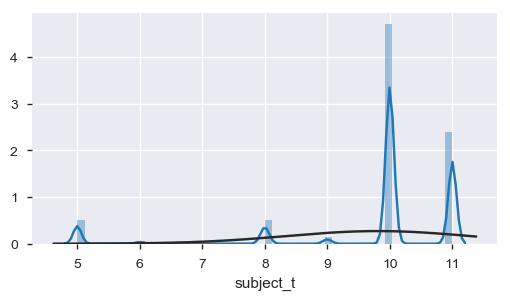

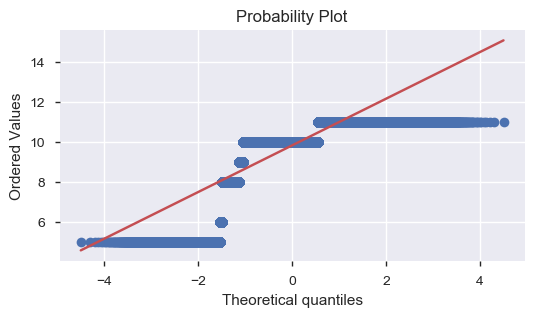

In [452]:
#histogram and normal probability plot for target and subject_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['subject_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['subject_t'], plot=plt)

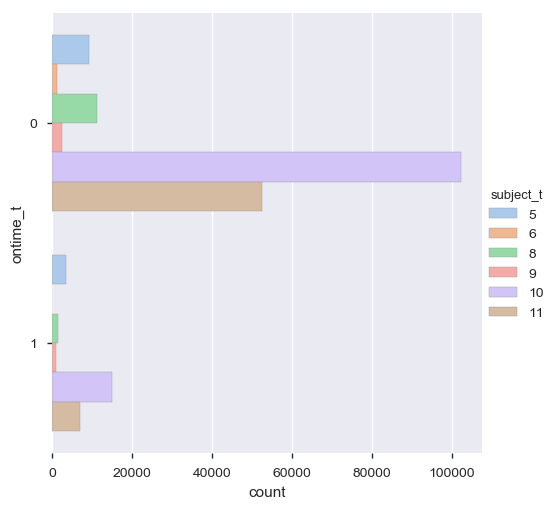

In [453]:
## Barplot and Countplot in Seaborn for target and subject_t
sns.catplot(y="ontime_t", 
            hue="subject_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [454]:
## Stats Model Results for target and pwd_district_t
results = ols('ontime_t ~ C(pwd_district_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     70.73
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          9.30e-188
Time:                        05:34:16   Log-Likelihood:                -71660.
No. Observations:              207386   AIC:                         1.433e+05
Df Residuals:                  207372   BIC:                         1.435e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.1594      0.003     53.855      0.000       0.154       0.165
C(pwd_district_t)[T.3]     -0.0217      0.004     -5.611      0.000      -0.029      -0.014
C(pwd_district_t)[T.4]     -0.0234      0.004     -5.945      0.000      -0.031      -0.016
C(pwd_district_t)[T.5]     -0.0639      0.004    -16.170      0.000      -0.072      -0.056
C(pwd_district_t)[T.6]     -0.0100      0.004     -2.270      0.023      -0.019      -0.001
C(pwd_district_t)[T.7]      0.0011      0.004      0.290      0.772      -0.007       0.009
C(pwd_district_t)[T.8]      0.0069      0.005      1.510      0.131      -0.002       0.016
C(pwd_district_t)[T.9]     -0.0445      0.004    -10.504      0.000      -0.053      -0.036
C(pwd_district_t)[T.20]    -0.0125      0.005     -2.480      0.013      -0.022      -0.003
C(pwd_district_t)[T.21]    -0.0629      0.004    -16.477      0.000      -0.070      -0.055
C(pwd_district_t)[T.22]    -0.0290      0.004     -8.234      0.000      -0.036      -0.022
C(pwd_district_t)[T.23]    -0.0042      0.004     -1.001      0.317      -0.013       0.004
C(pwd_district_t)[T.24]    -0.0041      0.004     -0.988      0.323      -0.012       0.004
C(pwd_district_t)[T.33]    -0.0014      0.007     -0.204      0.838      -0.015       0.012
==============================================================================
Omnibus:                    77093.442   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           207867.203
Skew:                           2.111   Prob(JB):                         0.00
Kurtosis:                       5.495   Cond. No.                         16.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [455]:
## Tukey and Multicomparison Models for target and pwd_district_t
mc = MultiComparison(df2['ontime_t'], df2['pwd_district_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  2      3    -0.0217  -0.0346 -0.0087  True 
  2      4    -0.0234  -0.0366 -0.0102  True 
  2      5    -0.0639  -0.0772 -0.0507  True 
  2      6     -0.01   -0.0249  0.0048 False 
  2      7     0.0011  -0.0119  0.0142 False 
  2      8     0.0069  -0.0084  0.0221 False 
  2      9    -0.0445  -0.0587 -0.0303  True 
  2      20   -0.0125  -0.0293  0.0044 False 
  2      21   -0.0629  -0.0757 -0.0501  True 
  2      22    -0.029  -0.0408 -0.0172  True 
  2      23   -0.0042  -0.0184   0.01  False 
  2      24   -0.0041   -0.018  0.0098 False 
  2      33   -0.0014  -0.0251  0.0222 False 
  3      4    -0.0017  -0.0138  0.0103 False 
  3      5    -0.0423  -0.0544 -0.0302  True 
  3      6     0.0116  -0.0022  0.0254 False 
  3      7     0.0228   0.0109  0.0347  True 
  3      8     0.0285   0.0143  0.0428  True 
  3      9    -0.0228  -0.035

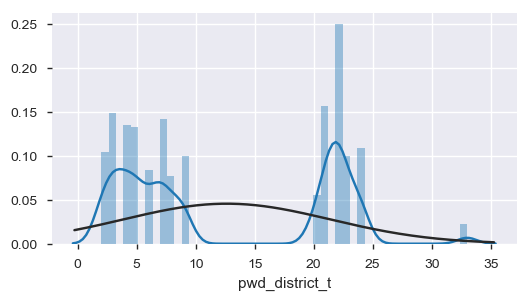

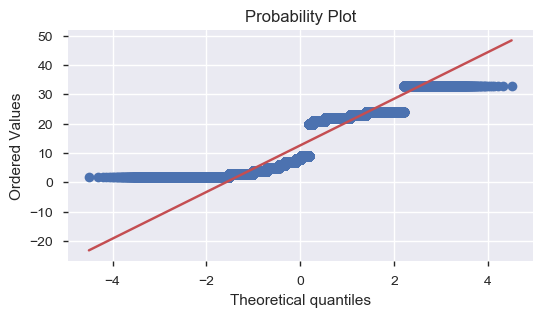

In [456]:
#histogram and normal probability plot for target and pwd_district_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['pwd_district_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['pwd_district_t'], plot=plt)

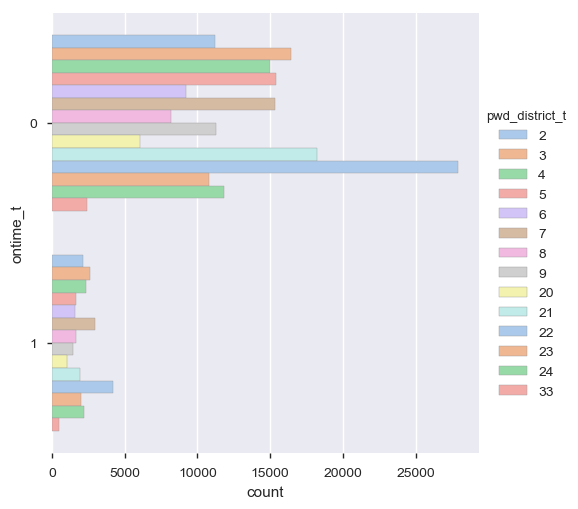

In [457]:
## Barplot and Countplot in Seaborn for target and pwd_district_t
sns.catplot(y="ontime_t", 
            hue="pwd_district_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [458]:
## Stats Model Results for target and department_t2
results = ols('ontime_t ~ C(department_t2)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     659.3
Date:                Sun, 10 Nov 2019   Prob (F-statistic):               0.00
Time:                        05:34:21   Log-Likelihood:                -69514.
No. Observations:              207386   AIC:                         1.390e+05
Df Residuals:                  207377   BIC:                         1.391e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  0.1164      0.001     84.125      0.000       0.114       0.119
C(department_t2)[T.6]      0.5678      0.055     10.341      0.000       0.460       0.675
C(department_t2)[T.9]      0.0550      0.057      0.961      0.336      -0.057       0.167
C(department_t2)[T.10]     0.2598      0.009     27.986      0.000       0.242       0.278
C(department_t2)[T.11]     0.1847      0.003     57.035      0.000       0.178       0.191
C(department_t2)[T.12]     0.3121      0.074      4.227      0.000       0.167       0.457
C(department_t2)[T.13]     0.0195      0.003      5.962      0.000       0.013       0.026
C(department_t2)[T.14]     0.1820      0.006     30.730      0.000       0.170       0.194
C(department_t2)[T.15]     0.0025      0.002      1.453      0.146      -0.001       0.006
==============================================================================
Omnibus:                    75750.455   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           202828.608
Skew:                           2.068   Prob(JB):                         0.00
Kurtosis:                       5.523   Cond. No.                         117.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [459]:
## Tukey and Multicomparison Models for target and department_t2
mc = MultiComparison(df2['ontime_t'], df2['department_t2'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  5      6     0.5678   0.3975  0.7381  True 
  5      9     0.055   -0.1225  0.2324 False 
  5      10    0.2598   0.231   0.2886  True 
  5      11    0.1847   0.1747  0.1947  True 
  5      12    0.3121   0.0831  0.5412  True 
  5      13    0.0195   0.0094  0.0297  True 
  5      14    0.182    0.1636  0.2004  True 
  5      15    0.0025  -0.0028  0.0078 False 
  6      9    -0.5128  -0.7586 -0.2669  True 
  6      10   -0.3079  -0.4805 -0.1353  True 
  6      11   -0.3831  -0.5536 -0.2126  True 
  6      12   -0.2556   -0.541  0.0297 False 
  6      13   -0.5482  -0.7187 -0.3777  True 
  6      14   -0.3857  -0.5569 -0.2146  True 
  6      15   -0.5653  -0.7356  -0.395  True 
  9      10    0.2049   0.0252  0.3845  True 
  9      11    0.1297  -0.0479  0.3073 False 
  9      12    0.2571  -0.0325  0.5468 False 
  9      13   -0.0355  -0.213

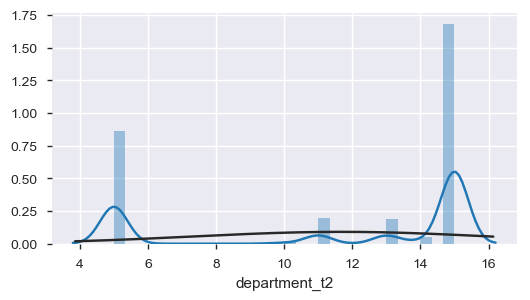

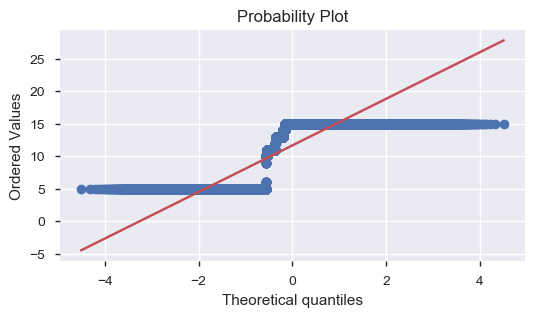

In [460]:
#histogram and normal probability plot for target and department_t2
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['department_t2'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['department_t2'], plot=plt)

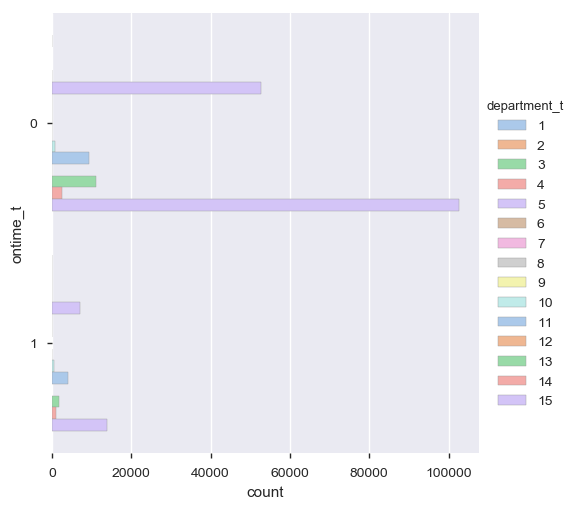

In [461]:
## Barplot and Countplot in Seaborn for target and department_t
sns.catplot(y="ontime_t", 
            hue="department_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [462]:
## Stats Model Results for target and neighborhood_services_district_t
results = ols('ontime_t ~ C(neighborhood_services_district)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     54.76
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          8.42e-176
Time:                        05:34:26   Log-Likelihood:                -71682.
No. Observations:              207386   AIC:                         1.434e+05
Df Residuals:                  207369   BIC:                         1.436e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Intercept                                   0.2787      0.025     11.027      0.000       0.229       0.328
C(neighborhood_services_district)[T.1]     -0.1637      0.025     -6.433      0.000      -0.214      -0.114
C(neighborhood_services_district)[T.2]     -0.1324      0.026     -5.172      0.000      -0.183      -0.082
C(neighborhood_services_district)[T.3]     -0.1717      0.025     -6.755      0.000      -0.222      -0.122
C(neighborhood_services_district)[T.4]     -0.1379      0.026     -5.392      0.000      -0.188      -0.088
C(neighborhood_services_district)[T.5]     -0.1817      0.025     -7.152      0.000      -0.231      -0.132
C(neighborhood_services_district)[T.6]     -0.1643      0.025     -6.460      0.000      -0.214      -0.114
C(neighborhood_services_district)[T.7]     -0.1323      0.025     -5.198      0.000      -0.182      -0.082
C(neighborhood_services_district)[T.8]     -0.1428      0.026     -5.599      0.000      -0.193      -0.093
C(neighborhood_services_district)[T.9]     -0.1018      0.026     -3.990      0.000      -0.152      -0.052
C(neighborhood_services_district)[T.10]    -0.1208      0.025     -4.753      0.000      -0.171      -0.071
C(neighborhood_services_district)[T.11]    -0.1175      0.025     -4.614      0.000      -0.167      -0.068
C(neighborhood_services_district)[T.12]    -0.1325      0.026     -5.167      0.000      -0.183      -0.082
C(neighborhood_services_district)[T.13]    -0.1212      0.025     -4.774      0.000      -0.171      -0.071
C(neighborhood_services_district)[T.14]    -0.1479      0.025     -5.831      0.000      -0.198      -0.098
C(neighborhood_services_district)[T.15]    -0.1440      0.025     -5.667      0.000      -0.194      -0.094
C(neighborhood_services_district)[T.33]    -0.1270      0.026     -4.863      0.000      -0.178      -0.076
==============================================================================
Omnibus:                    77146.402   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           208167.686
Skew:                           2.112   Prob(JB):                         0.00
Kurtosis:                       5.498   Cond. No.                         144.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [463]:
## Tukey and Multicomparison Models for target and neighborhood_services_district_t
mc = MultiComparison(df2['ontime_t'], df2['neighborhood_services_district'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  0      1    -0.1637  -0.2518 -0.0757  True 
  0      2    -0.1324  -0.2209 -0.0438  True 
  0      3    -0.1717  -0.2597 -0.0838  True 
  0      4    -0.1379  -0.2264 -0.0495  True 
  0      5    -0.1817  -0.2695 -0.0938  True 
  0      6    -0.1643  -0.2523 -0.0763  True 
  0      7    -0.1323  -0.2204 -0.0443  True 
  0      8    -0.1428   -0.231 -0.0546  True 
  0      9    -0.1018  -0.1901 -0.0136  True 
  0      10   -0.1208  -0.2087 -0.0329  True 
  0      11   -0.1175  -0.2056 -0.0294  True 
  0      12   -0.1325  -0.2213 -0.0438  True 
  0      13   -0.1212   -0.209 -0.0334  True 
  0      14   -0.1479  -0.2356 -0.0602  True 
  0      15    -0.144  -0.2319 -0.0561  True 
  0      33    -0.127  -0.2174 -0.0367  True 
  1      2     0.0314   0.0138  0.0489  True 
  1      3     -0.008  -0.0221  0.0062 False 
  1      4     0.0258   0.008

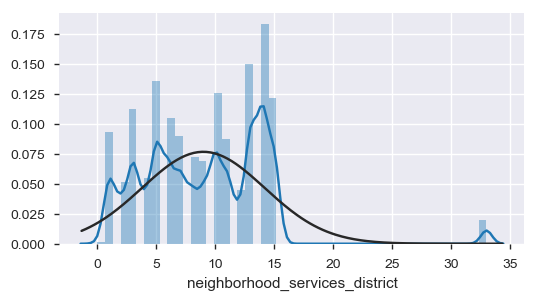

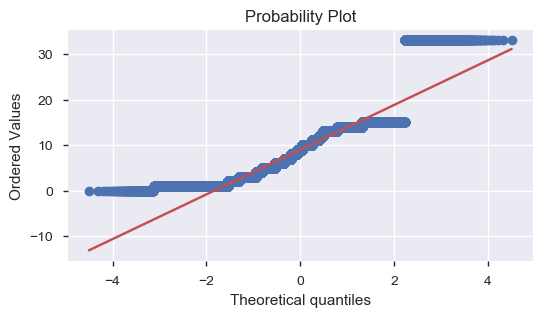

In [464]:
#histogram and normal probability plot and neighborhood_services_district_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['neighborhood_services_district'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['neighborhood_services_district'], plot=plt)

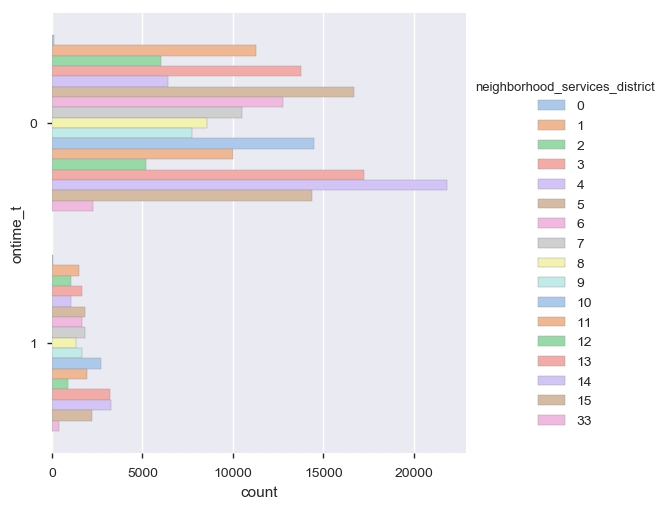

In [465]:
## Barplot and Countplot in Seaborn for target and neighborhood_services_district_t
sns.catplot(y="ontime_t", 
            hue="neighborhood_services_district", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [491]:
## Stats Model Results for target and city police District_t
results = ols('ontime_t ~ C(police_district_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     65.42
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          5.65e-160
Time:                        05:35:12   Log-Likelihood:                -71727.
No. Observations:              207386   AIC:                         1.435e+05
Df Residuals:                  207373   BIC:                         1.436e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.1134      0.002     56.289      0.000       0.109       0.117
C(police_district_t)[T.2]      0.0449      0.003     14.223      0.000       0.039       0.051
C(police_district_t)[T.3]      0.0581      0.004     15.089      0.000       0.051       0.066
C(police_district_t)[T.4]      0.0136      0.003      4.907      0.000       0.008       0.019
C(police_district_t)[T.5]      0.0377      0.004     10.218      0.000       0.030       0.045
C(police_district_t)[T.6]     -0.0123      0.003     -3.840      0.000      -0.019      -0.006
C(police_district_t)[T.7]      0.0016      0.004      0.432      0.666      -0.006       0.009
C(police_district_t)[T.11]     0.0245      0.003      7.865      0.000       0.018       0.031
C(police_district_t)[T.13]     0.0483      0.004     13.375      0.000       0.041       0.055
C(police_district_t)[T.14]     0.0226      0.003      6.883      0.000       0.016       0.029
C(police_district_t)[T.15]     0.0335      0.005      7.394      0.000       0.025       0.042
C(police_district_t)[T.18]     0.0509      0.004     13.125      0.000       0.043       0.059
C(police_district_t)[T.33]     0.0443      0.007      6.586      0.000       0.031       0.057
==============================================================================
Omnibus:                    77205.357   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           208468.695
Skew:                           2.114   Prob(JB):                         0.00
Kurtosis:                       5.500   Cond. No.                         11.3
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [492]:
## Tukey and Multicomparison Models for target and police district_t
mc = MultiComparison(df2['ontime_t'], df2['police_district_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  1      2     0.0449   0.0345  0.0554  True 
  1      3     0.0581   0.0454  0.0709  True 
  1      4     0.0136   0.0044  0.0228  True 
  1      5     0.0377   0.0254  0.0499  True 
  1      6    -0.0123  -0.0229 -0.0017  True 
  1      7     0.0016  -0.0105  0.0136 False 
  1      11    0.0245   0.0142  0.0349  True 
  1      13    0.0483   0.0363  0.0603  True 
  1      14    0.0226   0.0117  0.0335  True 
  1      15    0.0335   0.0185  0.0485  True 
  1      18    0.0509   0.0381  0.0638  True 
  1      33    0.0443   0.022   0.0666  True 
  2      3     0.0132  -0.0003  0.0267 False 
  2      4    -0.0313  -0.0416 -0.0211  True 
  2      5    -0.0073  -0.0203  0.0057 False 
  2      6    -0.0572  -0.0687 -0.0457  True 
  2      7    -0.0434  -0.0562 -0.0305  True 
  2      11   -0.0204  -0.0317 -0.0091  True 
  2      13    0.0034  -0.009

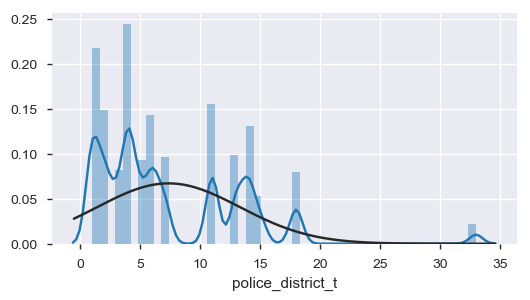

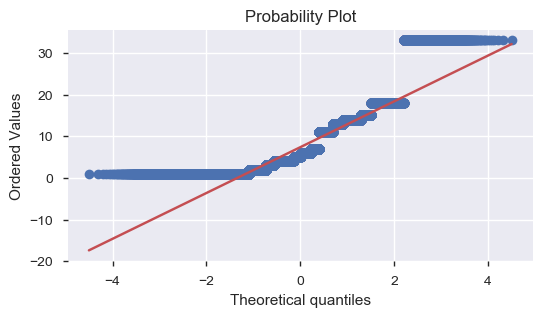

In [493]:
#histogram and normal probability plot for target and police District_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['police_district_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['police_district_t'], plot=plt)

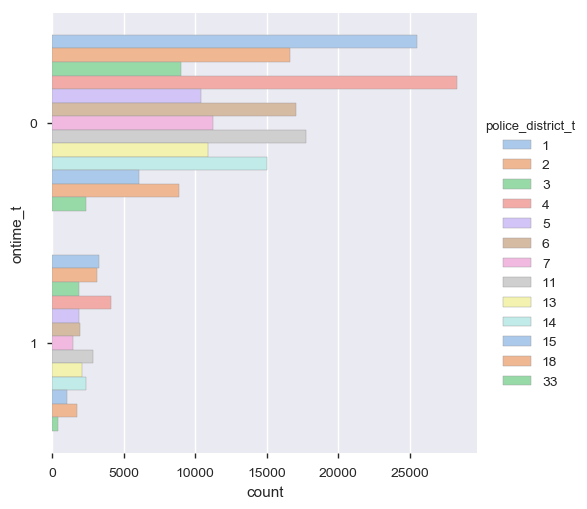

In [494]:
## Barplot and Countplot in Seaborn for target and police District_t
sns.catplot(y="ontime_t", 
            hue="police_district_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [495]:
## Stats Model Results for target and neighborhood_t
results = ols('ontime_t ~ C(neighborhood_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     39.81
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          2.79e-178
Time:                        05:35:18   Log-Likelihood:                -71662.
No. Observations:              207386   AIC:                         1.434e+05
Df Residuals:                  207362   BIC:                         1.436e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.1604      0.021      7.683      0.000       0.120       0.201
C(neighborhood_t)[T.1]     -0.0258      0.021     -1.224      0.221      -0.067       0.015
C(neighborhood_t)[T.2]     -0.0307      0.021     -1.452      0.146      -0.072       0.011
C(neighborhood_t)[T.3]     -0.0685      0.021     -3.222      0.001      -0.110      -0.027
C(neighborhood_t)[T.4]     -0.0306      0.021     -1.437      0.151      -0.072       0.011
C(neighborhood_t)[T.5]     -0.0062      0.024     -0.258      0.796      -0.053       0.041
C(neighborhood_t)[T.6]     -0.0135      0.021     -0.637      0.524      -0.055       0.028
C(neighborhood_t)[T.7]     -0.0890      0.094     -0.950      0.342      -0.273       0.095
C(neighborhood_t)[T.8]     -0.0194      0.021     -0.926      0.354      -0.061       0.022
C(neighborhood_t)[T.9]     -0.0366      0.021     -1.737      0.082      -0.078       0.005
C(neighborhood_t)[T.10]    -0.0455      0.021     -2.156      0.031      -0.087      -0.004
C(neighborhood_t)[T.11]     0.0015      0.021      0.070      0.944      -0.041       0.044
C(neighborhood_t)[T.12]     0.0214      0.021      1.005      0.315      -0.020       0.063
C(neighborhood_t)[T.13]     0.0003      0.021      0.013      0.990      -0.041       0.042
C(neighborhood_t)[T.14]    -0.0006      0.021     -0.029      0.977      -0.042       0.041
C(neighborhood_t)[T.15]     0.0641      0.031      2.101      0.036       0.004       0.124
C(neighborhood_t)[T.16]    -0.0116      0.022     -0.537      0.591      -0.054       0.031
C(neighborhood_t)[T.17]    -0.0003      0.021     -0.012      0.990      -0.042       0.041
C(neighborhood_t)[T.18]    -0.0069      0.021     -0.327      0.744      -0.048       0.034
C(neighborhood_t)[T.19]    -0.0455      0.023     -1.990      0.047      -0.090      -0.001
C(neighborhood_t)[T.20]    -0.0636      0.021     -3.022      0.003      -0.105      -0.022
C(neighborhood_t)[T.21]    -0.0549      0.021     -2.602      0.009      -0.096      -0.014
C(neighborhood_t)[T.22]    -0.0014      0.022     -0.066      0.947      -0.044       0.041
C(neighborhood_t)[T.23]    -0.0140      0.021     -0.659      0.510      -0.056       0.028
==============================================================================
Omnibus:                    77110.577   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           207972.911
Skew:                           2.112   Prob(JB):                         0.00
Kurtosis:                       5.496   Cond. No.                         148.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [496]:
## Tukey and Multicomparison Models for target and neighborhood_t
mc = MultiComparison(df2['ontime_t'], df2['neighborhood_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  0      1    -0.0258  -0.1024  0.0508 False 
  0      2    -0.0307  -0.1075  0.0462 False 
  0      3    -0.0685  -0.1458  0.0088 False 
  0      4    -0.0306  -0.1082  0.0469 False 
  0      5    -0.0062   -0.093  0.0807 False 
  0      6    -0.0135  -0.0909  0.0638 False 
  0      7     -0.089  -0.4299  0.2519 False 
  0      8    -0.0194  -0.0958  0.0569 False 
  0      9    -0.0366  -0.1132   0.04  False 
  0      10   -0.0455  -0.1222  0.0313 False 
  0      11    0.0015  -0.0765  0.0795 False 
  0      12    0.0214   -0.056  0.0987 False 
  0      13    0.0003  -0.0769  0.0774 False 
  0      14   -0.0006  -0.0774  0.0762 False 
  0      15    0.0641  -0.0469  0.1751 False 
  0      16   -0.0116   -0.09   0.0668 False 
  0      17   -0.0003  -0.0776  0.0771 False 
  0      18   -0.0069  -0.0834  0.0696 False 
  0      19   -0.0455  -0.128

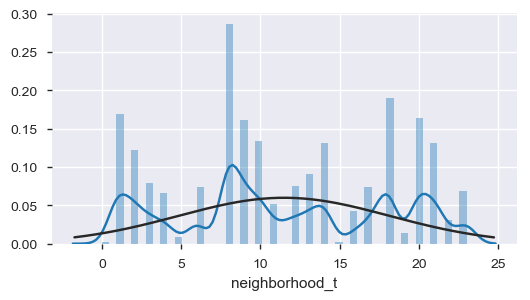

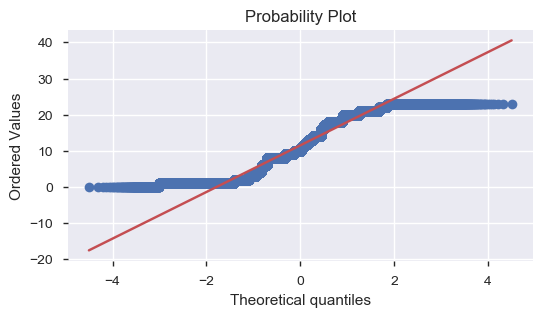

In [497]:
#histogram and normal probability plot for target and neighborhood_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['neighborhood_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['neighborhood_t'], plot=plt)

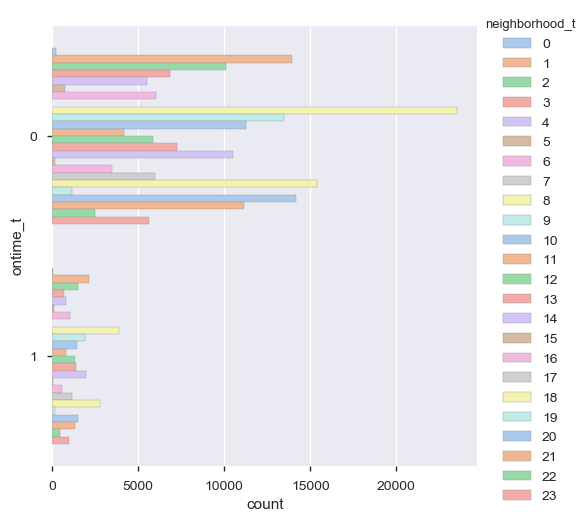

In [498]:
## Barplot and Countplot in Seaborn for target and neighborhood_t
sns.catplot(y="ontime_t", 
            hue="neighborhood_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [499]:
## Stats Model Results for target and ward_t
results = ols('ontime_t ~ C(ward_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     29.03
Date:                Sun, 10 Nov 2019   Prob (F-statistic):          2.26e-243
Time:                        05:35:24   Log-Likelihood:                -71468.
No. Observations:              207386   AIC:                         1.430e+05
Df Residuals:                  207340   BIC:                         1.435e+05
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.3482      0.032     10.789      0.000       0.285       0.411
C(ward_t)[T.1]     -0.2247      0.033     -6.857      0.000      -0.289      -0.160
C(ward_t)[T.2]     -0.1891      0.033     -5.686      0.000      -0.254      -0.124
C(ward_t)[T.3]     -0.1818      0.033     -5.502      0.000      -0.247      -0.117
C(ward_t)[T.4]     -0.1682      0.033     -5.055      0.000      -0.233      -0.103
C(ward_t)[T.5]     -0.2302      0.033     -6.872      0.000      -0.296      -0.165
C(ward_t)[T.6]     -0.1847      0.033     -5.573      0.000      -0.250      -0.120
C(ward_t)[T.7]     -0.2246      0.034     -6.669      0.000      -0.291      -0.159
C(ward_t)[T.8]     -0.2221      0.033     -6.713      0.000      -0.287      -0.157
C(ward_t)[T.9]     -0.2166      0.034     -6.455      0.000      -0.282      -0.151
C(ward_t)[T.10]    -0.1908      0.033     -5.820      0.000      -0.255      -0.127
C(ward_t)[T.11]    -0.1934      0.033     -5.863      0.000      -0.258      -0.129
C(ward_t)[T.12]    -0.1586      0.033     -4.829      0.000      -0.223      -0.094
C(ward_t)[T.13]    -0.1834      0.033     -5.564      0.000      -0.248      -0.119
C(ward_t)[T.14]    -0.1916      0.033     -5.844      0.000      -0.256      -0.127
C(ward_t)[T.15]    -0.1948      0.033     -5.897      0.000      -0.259      -0.130
C(ward_t)[T.16]    -0.2079      0.032     -6.411      0.000      -0.271      -0.144
C(ward_t)[T.17]    -0.1833      0.033     -5.609      0.000      -0.247      -0.119
C(ward_t)[T.18]    -0.1947      0.033     -5.987      0.000      -0.258      -0.131
C(ward_t)[T.19]    -0.2301      0.033     -7.041      0.000      -0.294      -0.166
C(ward_t)[T.20]    -0.2388      0.033     -7.230      0.000      -0.304      -0.174
C(ward_t)[T.21]    -0.1829      0.033     -5.569      0.000      -0.247      -0.119
C(ward_t)[T.22]    -0.2030      0.033     -6.184      0.000      -0.267      -0.139
C(ward_t)[T.23]    -0.1965      0.033     -5.967      0.000      -0.261      -0.132
C(ward_t)[T.24]    -0.2367      0.032     -7.290      0.000      -0.300      -0.173
C(ward_t)[T.25]    -0.2005      0.033     -6.121      0.000      -0.265      -0.136
C(ward_t)[T.26]    -0.2074      0.033     -6.344      0.000      -0.272      -0.143
C(ward_t)[T.27]    -0.1839      0.033     -5.608      0.000      -0.248      -0.120
C(ward_t)[T.28]    -0.2205      0.033     -6.740      0.000      -0.285      -0.156
C(ward_t)[T.29]    -0.1729      0.033     -5.299      0.000      -0.237      -0.109
C(ward_t)[T.30]    -0.2057      0.033     -6.279      0.000      -0.270      -0.141
C(ward_t)[T.31]    -0.1903      0.033     -5.836      0.000      -0.254      -0.126
C(ward_t)[T.32]    -0.1937      0.033     -5.940      0.000      -0.258      -0.130
C(ward_t)[T.33]    -0.1782      0.032     -5.490      0.000

In [500]:
## Tukey and Multicomparison Models for target and ward_t
mc = MultiComparison(df2['ontime_t'], df2['ward_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  0      1    -0.2247  -0.3542 -0.0952  True 
  0      2    -0.1891  -0.3207 -0.0576  True 
  0      3    -0.1818  -0.3124 -0.0512  True 
  0      4    -0.1682  -0.2998 -0.0367  True 
  0      5    -0.2302  -0.3626 -0.0978  True 
  0      6    -0.1847  -0.3158 -0.0537  True 
  0      7    -0.2246  -0.3577 -0.0915  True 
  0      8    -0.2221  -0.3529 -0.0913  True 
  0      9    -0.2166  -0.3492 -0.0839  True 
  0      10   -0.1908  -0.3204 -0.0612  True 
  0      11   -0.1934  -0.3238  -0.063  True 
  0      12   -0.1586  -0.2885 -0.0288  True 
  0      13   -0.1834  -0.3137 -0.0531  True 
  0      14   -0.1916  -0.3212  -0.062  True 
  0      15   -0.1948  -0.3253 -0.0642  True 
  0      16   -0.2079  -0.3361 -0.0797  True 
  0      17   -0.1833  -0.3126 -0.0541  True 
  0      18   -0.1947  -0.3233 -0.0661  True 
  0      19   -0.2301  -0.359

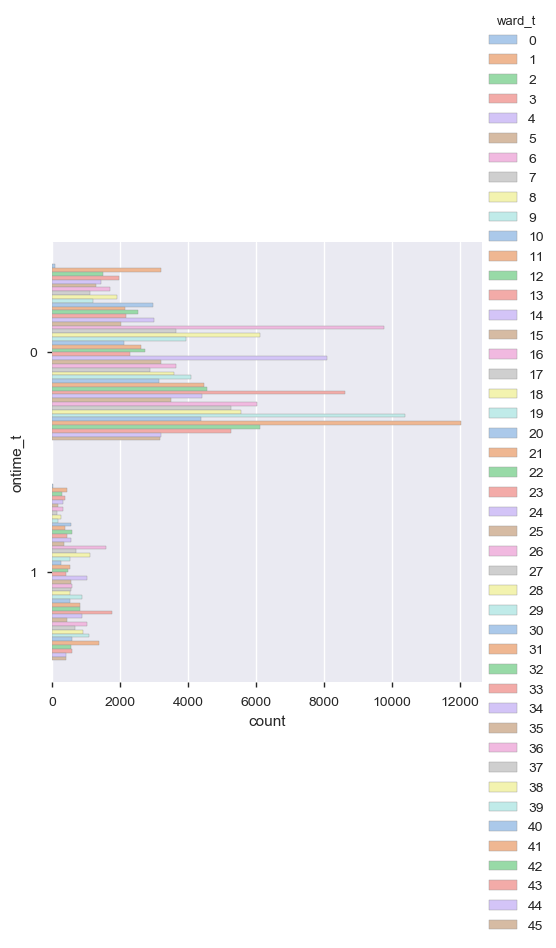

In [501]:
## Barplot and Countplot in Seaborn for target and ward_t
sns.catplot(y="ontime_t", 
            hue="ward_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [502]:
## Stats Model Results for target and reason_t
results = ols('ontime_t ~ C(reason_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.091
Model:                            OLS   Adj. R-squared:                  0.091
Method:                 Least Squares   F-statistic:                     835.3
Date:                Sun, 10 Nov 2019   Prob (F-statistic):               0.00
Time:                        05:35:29   Log-Likelihood:                -62169.
No. Observations:              207386   AIC:                         1.244e+05
Df Residuals:                  207360   BIC:                         1.247e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             1.0000      0.115      8.661      0.000       0.774       1.226
C(reason_t)[T.1]     -0.8621      0.123     -6.999      0.000      -1.103      -0.621
C(reason_t)[T.6]     -0.9778      0.125     -7.803      0.000      -1.223      -0.732
C(reason_t)[T.8]     -0.6102      0.116     -5.281      0.000      -0.837      -0.384
C(reason_t)[T.10]    -0.8889      0.139     -6.406      0.000      -1.161      -0.617
C(reason_t)[T.11]    -0.9572      0.115     -8.289      0.000      -1.184      -0.731
C(reason_t)[T.14]    -0.9396      0.116     -8.111      0.000      -1.167      -0.713
C(reason_t)[T.15]    -0.9263      0.115     -8.022      0.000      -1.153      -0.700
C(reason_t)[T.16]    -0.7550      0.116     -6.531      0.000      -0.982      -0.528
C(reason_t)[T.19]    -0.9674      0.120     -8.036      0.000      -1.203      -0.731
C(reason_t)[T.21]    -0.7192      0.116     -6.221      0.000      -0.946      -0.493
C(reason_t)[T.22]    -0.7360      0.116     -6.353      0.000      -0.963      -0.509
C(reason_t)[T.23]    -0.7662      0.115     -6.635      0.000      -0.993      -0.540
C(reason_t)[T.24]    -0.8602      0.116     -7.441      0.000      -1.087      -0.634
C(reason_t)[T.31]    -0.8795      0.118     -7.484      0.000      -1.110      -0.649
C(reason_t)[T.32]    -0.7845      0.116     -6.789      0.000      -1.011      -0.558
C(reason_t)[T.33]    -0.7143      0.169     -4.226      0.000      -1.046      -0.383
C(reason_t)[T.36]    -0.6728      0.116     -5.824      0.000      -0.899      -0.446
C(reason_t)[T.37]    -0.9143      0.115     -7.916      0.000      -1.141      -0.688
C(reason_t)[T.39]    -0.7338      0.115     -6.354      0.000      -0.960      -0.507
C(reason_t)[T.40]    -0.9436      0.115     -8.172      0.000      -1.170      -0.717
C(reason_t)[T.41]    -0.7122      0.116     -6.165      0.000      -0.939      -0.486
C(reason_t)[T.42]    -0.7302      0.116     -6.284      0.000      -0.958      -0.502
C(reason_t)[T.43]    -0.9490      0.116     -8.215      0.000      -1.175      -0.723
C(reason_t)[T.44]    -0.6667      0.176     -3.780      0.000      -1.012      -0.321
C(reason_t)[T.45]    -0.4805      0.121     -3.961      0.000      -0.718      -0.243
==============================================================================
Omnibus:                    65961.797   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           158235.209
Skew:                           1.836   Prob(JB):                         0.00
Kurtosis:                       5.198   Cond. No.                         874.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [503]:
## Tukey and Multicomparison Models for target and reason_t
mc = MultiComparison(df2['ontime_t'], df2['reason_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  0      1    -0.8621   -1.315 -0.4091  True 
  0      6    -0.9778  -1.4386 -0.5169  True 
  0      8    -0.6102  -1.0352 -0.1852  True 
  0      10   -0.8889  -1.3992 -0.3785  True 
  0      11   -0.9572  -1.3819 -0.5325  True 
  0      14   -0.9396  -1.3657 -0.5136  True 
  0      15   -0.9263   -1.351 -0.5017  True 
  0      16    -0.755  -1.1802 -0.3298  True 
  0      19   -0.9674  -1.4101 -0.5247  True 
  0      21   -0.7192  -1.1443  -0.294  True 
  0      22    -0.736  -1.1621 -0.3099  True 
  0      23   -0.7662  -1.1909 -0.3415  True 
  0      24   -0.8602  -1.2853  -0.435  True 
  0      31   -0.8795  -1.3116 -0.4473  True 
  0      32   -0.7845  -1.2094 -0.3595  True 
  0      33   -0.7143  -1.3359 -0.0927  True 
  0      36   -0.6728  -1.0976  -0.248  True 
  0      37   -0.9143   -1.339 -0.4895  True 
  0      39   -0.7338  -1.158

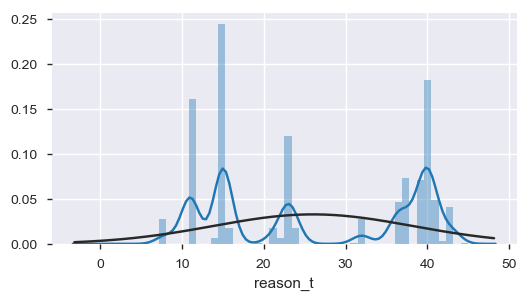

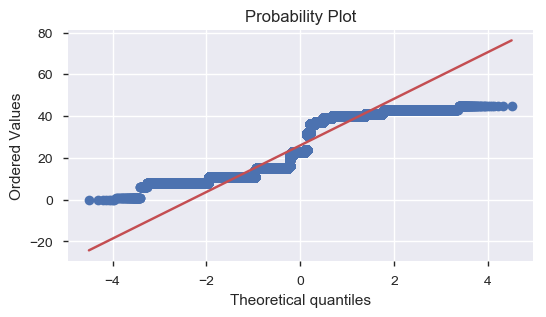

In [504]:
#histogram and normal probability plot for target and reason_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['reason_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['reason_t'], plot=plt)

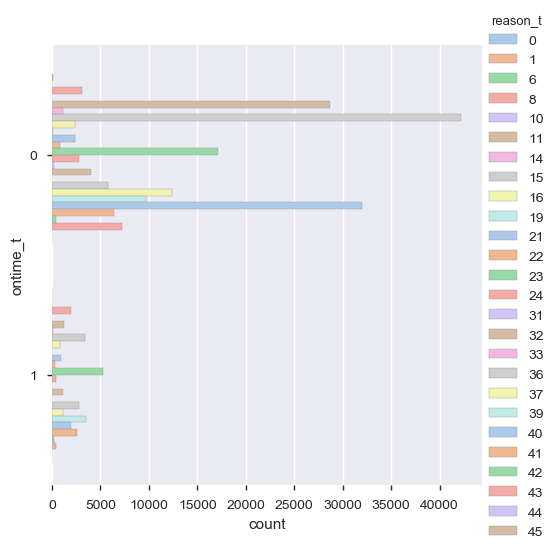

In [505]:
## Barplot and Countplot in Seaborn for target and reason_t
sns.catplot(y="ontime_t", 
            hue="reason_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

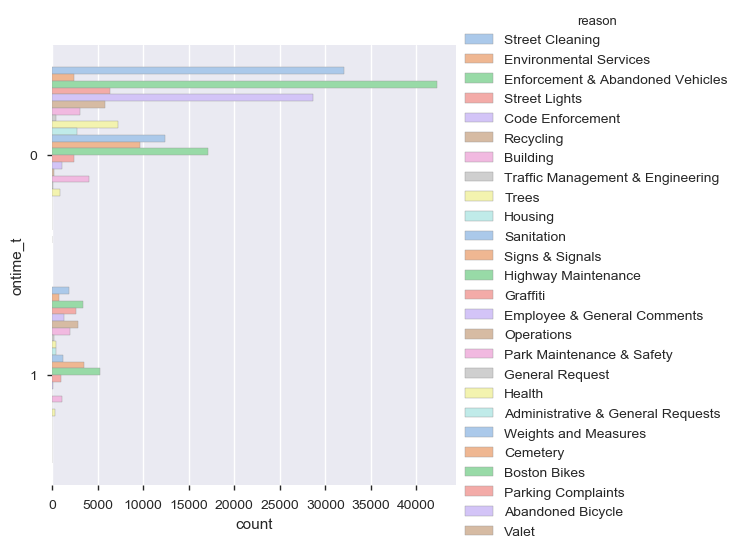

In [506]:
## Barplot and Countplot in Seaborn for and reason
sns.catplot(y="ontime_t", 
            hue="reason", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [507]:
## Grouping the over_time cases by reason and close_open_diff by count 
group_reason=df2.groupby(['reason'])['ontime_t'].count()
group_reason

reason
Abandoned Bicycle                        8
Administrative & General Requests       58
Boston Bikes                            45
Building                              5118
Cemetery                                18
Code Enforcement                     29945
Employee & General Comments           1209
Enforcement & Abandoned Vehicles     45606
Environmental Services                3200
General Request                         92
Graffiti                              3351
Health                                1178
Highway Maintenance                  22347
Housing                               3247
Operations                             224
Park Maintenance & Safety             5141
Parking Complaints                       7
Recycling                             8576
Sanitation                           13553
Signs & Signals                      13191
Street Cleaning                      33929
Street Lights                         9005
Traffic Management & Engineering       630
Tree

In [508]:
## Stats Model Results for target and type_t
results = ols('ontime_t ~ C(type_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.177
Method:                 Least Squares   F-statistic:                     336.9
Date:                Sun, 10 Nov 2019   Prob (F-statistic):               0.00
Time:                        05:37:36   Log-Likelihood:                -51824.
No. Observations:              207386   AIC:                         1.039e+05
Df Residuals:                  207252   BIC:                         1.053e+05
Df Model:                         133                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            1.0000      0.110      9.102      0.000       0.785       1.215
C(type_t)[T.1]      -0.5269      0.114     -4.602      0.000      -0.751      -0.302
C(type_t)[T.2]      -0.5550      0.110     -5.047      0.000      -0.771      -0.339
C(type_t)[T.12]     -0.8161      0.115     -7.108      0.000      -1.041      -0.591
C(type_t)[T.13]     -0.9778      0.119     -8.200      0.000      -1.211      -0.744
C(type_t)[T.14]     -1.0000      0.210     -4.753      0.000      -1.412      -0.588
C(type_t)[T.15]     -0.8788      0.122     -7.176      0.000      -1.119      -0.639
C(type_t)[T.17]     -0.8958      0.119     -7.549      0.000      -1.128      -0.663
C(type_t)[T.19]     -0.2873      0.111     -2.598      0.009      -0.504      -0.071
C(type_t)[T.20]     -0.9830      0.110     -8.943      0.000      -1.198      -0.768
C(type_t)[T.22]     -0.4390      0.120     -3.655      0.000      -0.674      -0.204
C(type_t)[T.24]     -0.8889      0.132     -6.732      0.000      -1.148      -0.630
C(type_t)[T.25]     -0.8273      0.113     -7.322      0.000      -1.049      -0.606
C(type_t)[T.27]     -0.9533      0.112     -8.518      0.000      -1.173      -0.734
C(type_t)[T.28]     -0.8172      0.110     -7.398      0.000      -1.034      -0.601
C(type_t)[T.29]     -1.0000      0.110     -9.067      0.000      -1.216      -0.784
C(type_t)[T.30]     -0.8716      0.113     -7.727      0.000      -1.093      -0.651
C(type_t)[T.32]     -1.0000      0.118     -8.504      0.000      -1.230      -0.770
C(type_t)[T.33]     -0.5901      0.111     -5.326      0.000      -0.807      -0.373
C(type_t)[T.34]     -0.9196      0.110     -8.352      0.000      -1.135      -0.704
C(type_t)[T.35]     -0.6857      0.110     -6.228      0.000      -0.901      -0.470
C(type_t)[T.36]     -0.7105      0.113     -6.303      0.000      -0.931      -0.490
C(type_t)[T.39]     -0.7660      0.119     -6.444      0.000      -0.999      -0.533
C(type_t)[T.40]     -0.7589      0.114     -6.673      0.000      -0.982      -0.536
C(type_t)[T.41]     -0.7207      0.114     -6.335      0.000      -0.944      -0.498
C(type_t)[T.43]     -0.9396      0.110     -8.524      0.000      -1.156      -0.724
C(type_t)[T.44]     -0.9232      0.110     -8.380      0.000      -1.139      -0.707
C(type_t)[T.45]     -0.5833      0.119     -4.915      0.000      -0.816      -0.351
C(type_t)[T.46]     -0.7192      0.110     -6.538      0.000      -0.935      -0.504
C(type_t)[T.47]     -0.8501      0.110     -7.726      0.000      -1.066      -0.634
C(type_t)[T.48]     -0.8009      0.111     -7.227      0.000      -1.018      -0.584
C(type_t)[T.51]     -0.6716      0.113     -5.938      0.000      -0.893      -0.450
C(type_t)[T.52]     -0.9518      0.110     -8.645      0.000      -1.168      -0.736
C(type_t)[T.53]     -0.

In [509]:
## Tukey and Multicomparison Models for target and type_t
mc = MultiComparison(df2['ontime_t'], df2['type_t'])
tkresult = mc.tukeyhsd()
 
print(tkresult)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
  0      1    -0.5269  -1.0341 -0.0197  True 
  0      2     -0.555  -1.0421 -0.0679  True 
  0      12   -0.8161  -1.3247 -0.3075  True 
  0      13   -0.9778   -1.506 -0.4496  True 
  0      14     -1.0    -1.932  -0.068  True 
  0      15   -0.8788  -1.4213 -0.3363  True 
  0      17   -0.8958  -1.4215 -0.3701  True 
  0      19   -0.2873  -0.7771  0.2025 False 
  0      20    -0.983  -1.4699 -0.4961  True 
  0      22    -0.439  -0.9711  0.0931 False 
  0      24   -0.8889  -1.4738 -0.3039  True 
  0      25   -0.8273  -1.3279 -0.3268  True 
  0      27   -0.9533   -1.449 -0.4575  True 
  0      28   -0.8172  -1.3065 -0.3279  True 
  0      29     -1.0   -1.4886 -0.5114  True 
  0      30   -0.8716  -1.3713 -0.3719  True 
  0      32     -1.0   -1.5209 -0.4791  True 
  0      33   -0.5901   -1.081 -0.0993  True 
  0      34   -0.9196  -1.407

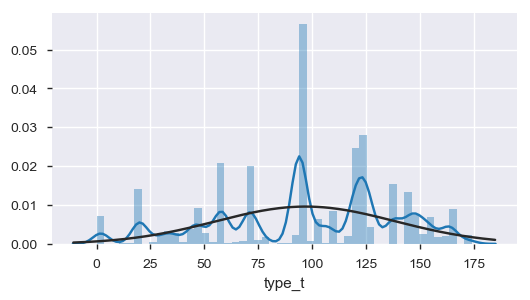

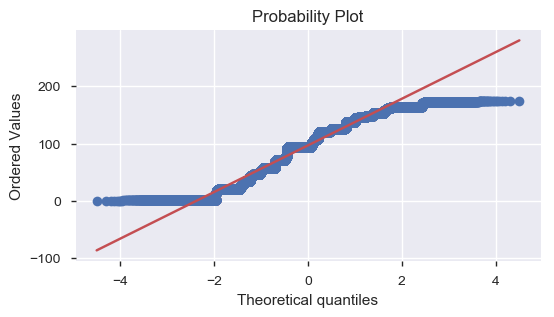

In [510]:
#histogram and normal probability plot for target and type_t
count, ax = plt.subplots(figsize=(6,3))
sns.distplot(df2['type_t'], fit=norm);

count, ax = plt.subplots(figsize=(6,3))
res = stats.probplot(df2['type_t'], plot=plt)

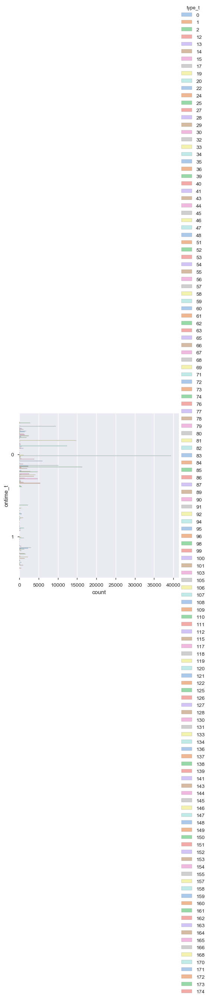

In [511]:
## Barplot and Countplot in Seaborn for target and type_t
sns.catplot(y="ontime_t", 
            hue="type_t", 
            kind="count",
            palette="pastel", 
            edgecolor=".6",
            data=df2);

In [512]:
## creating a dataframe with only the ontime cases = 0
df2_ontime=df2[df2['ontime_t'] == 0]
df2_ontime.head(5)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
878963,ONTIME,Citizens Connect App,3,8,Public Works Department,7,PWDx,7,C11,Pick up Dead Animal,...,146,1,8,-3,0,2,33,18,Sunday,7
750483,ONTIME,City Worker App,8,3,Public Works Department,1B,PWDx,14,A1,CE Collection,...,43,1,3,-1,0,1,37,12,Wednesday,3
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,197,0,14,-25,5,30,28,11,Thursday,4
699097,ONTIME,Constituent Call,5,12,Public Works Department,8,PWDx,10,E18,Pick up Dead Animal,...,187,0,13,-2,0,1,22,28,Monday,1
788396,ONTIME,Constituent Call,2,6,Transportation - Traffic Division,5,BTDT,5,C6,Abandoned Vehicles,...,61,0,20,-6,13,19,1,3,Thursday,4


In [513]:
## creating a dataframe with only the overdue cases
df2_overdue=df2[df2['ontime_t'] == 1]
df2_overdue.head(5)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
658360,OVERDUE,Citizens Connect App,2,6,Public Works Department,5,PWDx,5,C6,Street Light Outages,...,53,0,20,133,147,14,7,14,Wednesday,3
810508,OVERDUE,Constituent Call,6,9,Public Works Department,10A,PWDx,11,E13,Unshoveled Sidewalk,...,88,0,14,2,4,2,10,6,Wednesday,3
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,34,0,2,265,266,1,33,16,Thursday,4
695091,OVERDUE,Citizens Connect App,2,6,Transportation - Traffic Division,3,BTDT,5,C6,Abandoned Vehicles,...,67,0,8,34,53,18,20,17,Thursday,4
634984,OVERDUE,Constituent Call,6,9,Transportation - Traffic Division,2,BTDT,11,E13,Abandoned Vehicles,...,97,0,14,6,25,19,51,21,Thursday,4


In [514]:
## Stats Model Results for target and reason_t
results = ols('ontime_t ~ C(reason_t)', data=df2).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               ontime_t   R-squared:                       0.091
Model:                            OLS   Adj. R-squared:                  0.091
Method:                 Least Squares   F-statistic:                     835.3
Date:                Sun, 10 Nov 2019   Prob (F-statistic):               0.00
Time:                        05:37:45   Log-Likelihood:                -62169.
No. Observations:              207386   AIC:                         1.244e+05
Df Residuals:                  207360   BIC:                         1.247e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             1.0000      0.115      8.661      0.000       0.774       1.226
C(reason_t)[T.1]     -0.8621      0.123     -6.999      0.000      -1.103      -0.621
C(reason_t)[T.6]     -0.9778      0.125     -7.803      0.000      -1.223      -0.732
C(reason_t)[T.8]     -0.6102      0.116     -5.281      0.000      -0.837      -0.384
C(reason_t)[T.10]    -0.8889      0.139     -6.406      0.000      -1.161      -0.617
C(reason_t)[T.11]    -0.9572      0.115     -8.289      0.000      -1.184      -0.731
C(reason_t)[T.14]    -0.9396      0.116     -8.111      0.000      -1.167      -0.713
C(reason_t)[T.15]    -0.9263      0.115     -8.022      0.000      -1.153      -0.700
C(reason_t)[T.16]    -0.7550      0.116     -6.531      0.000      -0.982      -0.528
C(reason_t)[T.19]    -0.9674      0.120     -8.036      0.000      -1.203      -0.731
C(reason_t)[T.21]    -0.7192      0.116     -6.221      0.000      -0.946      -0.493
C(reason_t)[T.22]    -0.7360      0.116     -6.353      0.000      -0.963      -0.509
C(reason_t)[T.23]    -0.7662      0.115     -6.635      0.000      -0.993      -0.540
C(reason_t)[T.24]    -0.8602      0.116     -7.441      0.000      -1.087      -0.634
C(reason_t)[T.31]    -0.8795      0.118     -7.484      0.000      -1.110      -0.649
C(reason_t)[T.32]    -0.7845      0.116     -6.789      0.000      -1.011      -0.558
C(reason_t)[T.33]    -0.7143      0.169     -4.226      0.000      -1.046      -0.383
C(reason_t)[T.36]    -0.6728      0.116     -5.824      0.000      -0.899      -0.446
C(reason_t)[T.37]    -0.9143      0.115     -7.916      0.000      -1.141      -0.688
C(reason_t)[T.39]    -0.7338      0.115     -6.354      0.000      -0.960      -0.507
C(reason_t)[T.40]    -0.9436      0.115     -8.172      0.000      -1.170      -0.717
C(reason_t)[T.41]    -0.7122      0.116     -6.165      0.000      -0.939      -0.486
C(reason_t)[T.42]    -0.7302      0.116     -6.284      0.000      -0.958      -0.502
C(reason_t)[T.43]    -0.9490      0.116     -8.215      0.000      -1.175      -0.723
C(reason_t)[T.44]    -0.6667      0.176     -3.780      0.000      -1.012      -0.321
C(reason_t)[T.45]    -0.4805      0.121     -3.961      0.000      -0.718      -0.243
==============================================================================
Omnibus:                    65961.797   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           158235.209
Skew:                           1.836   Prob(JB):                         0.00
Kurtosis:                       5.198   Cond. No.                         874.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [515]:
## Creating a df3 for the modeling portion of the analysis 
## df3=df_time is the dataframe for all missing closed and target time variables.  
df3=df2

In [516]:
##  Creating a subsample for analysis for the modeling section
data_s=df3.sample(frac=1, random_state=99)
data_s.shape

(207386, 46)

In [517]:
#######################################################################################################

In [518]:
################################### creating the baseline model #######################################

In [519]:
## Baseline Model using Random Forest Model 
data_m0 = data_s[['ontime_t', 'source_t', 'city_council_district_t', 'fire_district_t', 'subject_t', 'pwd_district_t', 
                 'department_t','neighborhood_services_district','police_district_t',
                  'neighborhood_t', 'ward_t', 'reason_t', 'type_t','precinct','submittedphoto_t']]
data_m0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 842507 to 748994
Data columns (total 15 columns):
ontime_t                          207386 non-null int64
source_t                          207386 non-null int64
city_council_district_t           207386 non-null int64
fire_district_t                   207386 non-null int64
subject_t                         207386 non-null int64
pwd_district_t                    207386 non-null int64
department_t                      207386 non-null int64
neighborhood_services_district    207386 non-null int64
police_district_t                 207386 non-null int64
neighborhood_t                    207386 non-null int64
ward_t                            207386 non-null int64
reason_t                          207386 non-null int64
type_t                            207386 non-null int64
precinct                          207386 non-null int64
submittedphoto_t                  207386 non-null int64
dtypes: int64(15)
memory usage: 25.3 MB


In [520]:
# separating our independent and dependent variable
X = data_m0.drop(['ontime_t'], axis = 1)
y = data_m0["ontime_t"]

In [521]:
## Splitting the data into the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .35, random_state = 0)

In [522]:
# get shape of test and training sets
print('Training Set:')
print('Number of datapoints: ', X_train.shape[0])
print('Number of features:   ', X_train.shape[1])
print('\n')
print('Test Set:')
print('Number of datapoints: ', X_test.shape[0])
print('Number of features:   ', X_test.shape[1])

Training Set:
Number of datapoints:  134800
Number of features:    14


Test Set:
Number of datapoints:  72586
Number of features:    14


In [523]:
## Creating the RF model for baseline analysis 
rf=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=6, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [524]:
## Fitting the model
model1=rf.fit(X_train, y_train)
y_pred = model1.predict(X_test)

In [525]:
# Building feature importance into a DataFrame
fi = {'Features':X.columns.tolist(), 'Importance':model1.feature_importances_}
importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False)

In [526]:
## Printing Variable Importance 
print(importance)

                          Features  Importance
12                        precinct    0.258073
11                          type_t    0.223187
10                        reason_t    0.082089
0                         source_t    0.066603
9                           ward_t    0.066133
5                     department_t    0.054278
8                   neighborhood_t    0.040746
1          city_council_district_t    0.035167
3                        subject_t    0.033007
13                submittedphoto_t    0.032772
4                   pwd_district_t    0.029727
2                  fire_district_t    0.027655
6   neighborhood_services_district    0.027633
7                police_district_t    0.022929


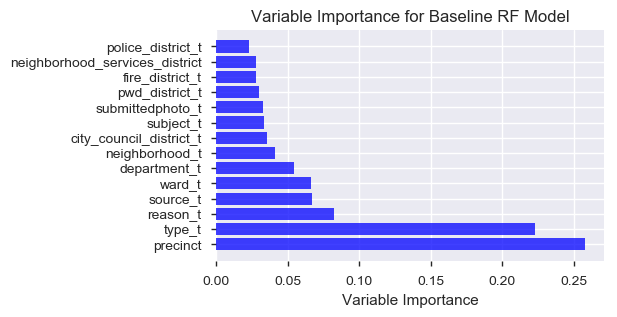

In [527]:
## Printing the Variable Importance Results 
count, ax = plt.subplots(figsize=(5,3))
plt.barh(importance.Features, importance.Importance, align='center', alpha=0.75, color='blue')
plt.xlabel('Variable Importance')
plt.title('Variable Importance for Baseline RF Model')

plt.show()

In [528]:
## Calcuating the Confusion Matrix 
confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
confusion_matrix

array([[59089,  3650],
       [ 6620,  3227]], dtype=int64)

In [529]:
## Creating the cool confusion matrix model 
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        1#print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="cyan" if cm[i, j] > thresh else "maroon")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

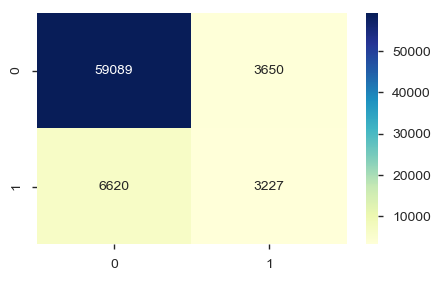

In [530]:
# visualize the confusion matrix with seaborn library
count, ax = plt.subplots(figsize=(5,3))
sns.heatmap(confusion_matrix,annot=True,fmt="d", cmap="YlGnBu") 
plt.show()

In [531]:
## RF Classification Report for the Precision, Recall and F1 Score
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.90      0.94      0.92     62739
          1       0.47      0.33      0.39      9847

avg / total       0.84      0.86      0.85     72586



In [532]:
##############################################  Phase 1 for Model Development

In [533]:
## Creating the original Dataset for boston 311 for analysis 
data_m = data_s[['ontime_t', 'source_t', 'city_council_district_t', 'fire_district_t', 'subject_t', 'pwd_district_t', 
                 'department_t','neighborhood_services_district','police_district_t',
                  'neighborhood_t', 'ward_t', 'reason_t', 'type_t','precinct','submittedphoto_t']]
data_m.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 842507 to 748994
Data columns (total 15 columns):
ontime_t                          207386 non-null int64
source_t                          207386 non-null int64
city_council_district_t           207386 non-null int64
fire_district_t                   207386 non-null int64
subject_t                         207386 non-null int64
pwd_district_t                    207386 non-null int64
department_t                      207386 non-null int64
neighborhood_services_district    207386 non-null int64
police_district_t                 207386 non-null int64
neighborhood_t                    207386 non-null int64
ward_t                            207386 non-null int64
reason_t                          207386 non-null int64
type_t                            207386 non-null int64
precinct                          207386 non-null int64
submittedphoto_t                  207386 non-null int64
dtypes: int64(15)
memory usage: 25.3 MB


In [534]:
##  Creating a subsample for analysis for the modeling section
data_m=data_m.sample(frac=0.20, random_state=99)
data_m.shape

(41477, 15)

In [535]:
# separating our independent and dependent variable
X = data_m.drop(['ontime_t'], axis = 1)
y = data_m["ontime_t"]

In [536]:
## Splitting the data into the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .35, random_state = 0)

In [537]:
# get shape of test and training sets
print('Training Set:')
print('Number of datapoints: ', X_train.shape[0])
print('Number of features:   ', X_train.shape[1])
print('\n')
print('Test Set:')
print('Number of datapoints: ', X_test.shape[0])
print('Number of features:   ', X_test.shape[1])

Training Set:
Number of datapoints:  26960
Number of features:    14


Test Set:
Number of datapoints:  14517
Number of features:    14


In [538]:
# Initiate 7 classifier models
ran = RandomForestClassifier(random_state=1)
knn = KNeighborsClassifier()
ext = ExtraTreesClassifier(random_state=1)
svc = SVC(probability=True)
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier(learning_rate=0.05)
mlp = MLPClassifier(random_state=1)



# Prepare lists
models = [ran, knn, ext, svc, ada, gb, mlp]         
scores = []

# Sequentially fit and cross validate all models
for mod in models:
    mod.fit(X_train, y_train)
    acc = cross_val_score(mod, X_test, y_test, scoring = "f1", cv = 5)
    scores.append(acc.mean())

In [539]:
# Creating a table of results, ranked from highest to lowest
results = pd.DataFrame({
    'Base Model': ['Random Forest', 'K Nearest Neighbour', 'SVC', 'AdaBoost','Extra Trees', 'GradientBoostingClassifier', 'multilayerperceptron'],
    'Score': scores})

result_df = results.sort_values(by='Score', ascending=False).reset_index(drop=True)
result_df.head(7)

,Base Model,Score
0,SVC,0.330498
1,Random Forest,0.319010
2,K Nearest Neighbour,0.252464
3,AdaBoost,0.153289
4,multilayerperceptron,0.128369
5,GradientBoostingClassifier,0.097673
6,Extra Trees,0.097666


(0.0, 0.55)

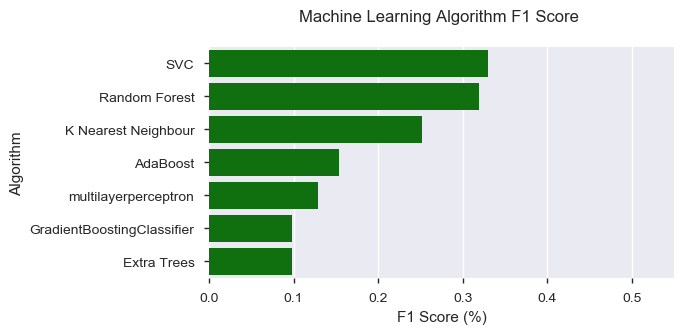

In [540]:
# Plot results for f1 scores
count, ax = plt.subplots(figsize=(6,3))
sns.barplot(x='Score', y = 'Base Model', data = result_df, color = 'green')
plt.title('Machine Learning Algorithm F1 Score \n')
plt.xlabel('F1 Score (%)')
plt.ylabel('Algorithm')
plt.xlim(0.0, 0.55)

In [541]:
# Building feature importance into a DataFrame
fi = {'Features':X.columns.tolist(), 'Importance':ran.feature_importances_}
importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False)

In [542]:
# Plot results
print(importance)

                          Features  Importance
12                        precinct    0.259120
11                          type_t    0.191799
10                        reason_t    0.086940
9                           ward_t    0.079338
0                         source_t    0.066933
8                   neighborhood_t    0.046940
5                     department_t    0.045594
1          city_council_district_t    0.038840
4                   pwd_district_t    0.033850
6   neighborhood_services_district    0.032698
13                submittedphoto_t    0.031284
2                  fire_district_t    0.031026
7                police_district_t    0.030412
3                        subject_t    0.025227


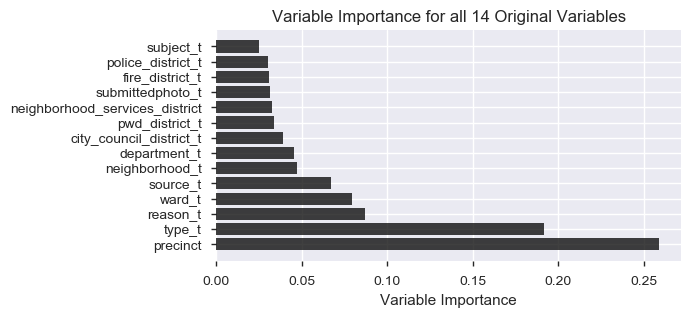

In [543]:
## Count plot of variable importance results 
count, ax = plt.subplots(figsize=(6,3))
plt.barh(importance.Features, importance.Importance, align='center', alpha=0.75, color='black')
plt.xlabel('Variable Importance')
plt.title('Variable Importance for all 14 Original Variables')

plt.show()

In [544]:
#####################################################################

In [545]:
## Creating second round of input attributes for phase 2 of model devlopment 
data_m2 = data_s[['ontime_t', 'precinct_t', 'type_t', 'reason_t', 'ward_t', 'source_t', 'neighborhood_t', 'department_t']]
data_m2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 842507 to 748994
Data columns (total 8 columns):
ontime_t          207386 non-null int64
precinct_t        207386 non-null int64
type_t            207386 non-null int64
reason_t          207386 non-null int64
ward_t            207386 non-null int64
source_t          207386 non-null int64
neighborhood_t    207386 non-null int64
department_t      207386 non-null int64
dtypes: int64(8)
memory usage: 14.2 MB


In [546]:
##  Creating a subsample for analysis for the modeling section
data_m2=data_m2.sample(frac=0.20, random_state=99)
data_m2.shape

(41477, 8)

In [547]:
# separating our independent and dependent variable
X = data_m2.drop(['ontime_t'], axis = 1)
y = data_m2["ontime_t"]

In [548]:
## Splitting the data into the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .35, random_state = 0)

In [549]:
# get shape of test and training sets
print('Training Set:')
print('Number of datapoints: ', X_train.shape[0])
print('Number of features:   ', X_train.shape[1])
print('\n')
print('Test Set:')
print('Number of datapoints: ', X_test.shape[0])
print('Number of features:   ', X_test.shape[1])

Training Set:
Number of datapoints:  26960
Number of features:    7


Test Set:
Number of datapoints:  14517
Number of features:    7


In [550]:
# Initiate models for the select 7
ran = RandomForestClassifier(random_state=1)
knn = KNeighborsClassifier()
svc = SVC(probability=True)
ext = ExtraTreesClassifier(random_state=1)
ada = AdaBoostClassifier(random_state=1)
gb =  GradientBoostingClassifier(learning_rate=0.05)
mlp = MLPClassifier(random_state=1)


 

# Lists
models = [ran, knn, svc, ext, ada, gb, mlp]         
scores_v2 = []

# Fit & cross validate
for mod in models:
    mod.fit(X_train, y_train)
    acc = cross_val_score(mod, X_test, y_test, scoring = "f1", cv = 5)
    scores_v2.append(acc.mean())

In [551]:
# Creating a table of individual results, ranked highest to lowest
results = pd.DataFrame({
    'Models': ['Random Forest', 'K Nearest Neighbour', 'Logistic Regression', 'SVC', 'Extra Trees', 'AdaBoost', 'GradientBoostingClassifier'],
    '1st Optimized Score': scores_v2})

result_df = results.sort_values(by='1st Optimized Score', ascending=False).reset_index(drop=True)
result_df.head(11)

,Models,1st Optimized Score
0,Random Forest,0.348793
1,SVC,0.337133
2,K Nearest Neighbour,0.274358
3,Logistic Regression,0.174109
4,GradientBoostingClassifier,0.102194
5,AdaBoost,0.099886
6,Extra Trees,0.086432


In [552]:
# Creating a table of grouped results, ranked highest to lowest
results = pd.DataFrame({
    'Base Model': ['Random Forest', 'K Nearest Neighbour', 'Logistic Regression', 'SVC', 'AdaBoost','Extra Trees', 'GradientBoostingClassifier'],
    'Score': scores,
    'Models': ['Random Forest', 'K Nearest Neighbour', 'Logistic Regression', 'SVC', 'Extra Trees', 'AdaBoost', 'GradientBoostingClassifier'],
    '1st Optimization': scores_v2})

result_df = results.sort_values(by='1st Optimization', ascending=False).reset_index(drop=True)
result_df.head(11)

,Base Model,Score,Models,1st Optimization
0,Random Forest,0.319010,Random Forest,0.348793
1,SVC,0.153289,SVC,0.337133
2,K Nearest Neighbour,0.252464,K Nearest Neighbour,0.274358
3,Logistic Regression,0.330498,Logistic Regression,0.174109
4,GradientBoostingClassifier,0.128369,GradientBoostingClassifier,0.102194
5,Extra Trees,0.097673,AdaBoost,0.099886
6,AdaBoost,0.097666,Extra Trees,0.086432


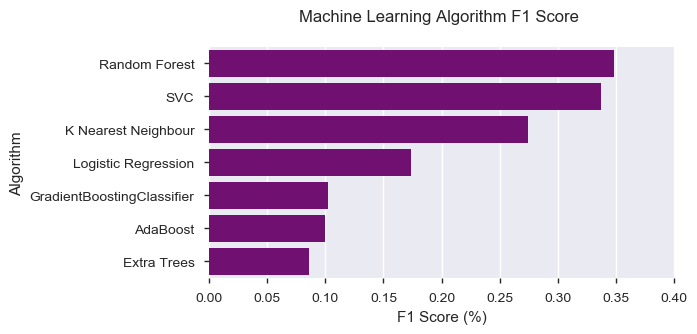

In [553]:
# Plot results for the F1 scores for phase 2
count, ax = plt.subplots(figsize=(6,3))
sns.barplot(x='1st Optimization', y = 'Models', data = result_df, color = 'purple')
plt.title('Machine Learning Algorithm F1 Score \n')
plt.xlabel('F1 Score (%)')
plt.ylabel('Algorithm')
plt.xlim(0, 0.4)
plt.show()

In [554]:
# Building feature importance into a DataFrame
fi = {'Features':X.columns.tolist(), 'Importance':ran.feature_importances_}
importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False)

In [555]:
print(importance)

         Features  Importance
0      precinct_t    0.375392
1          type_t    0.202615
3          ward_t    0.130573
2        reason_t    0.102253
5  neighborhood_t    0.097169
4        source_t    0.049127
6    department_t    0.042871


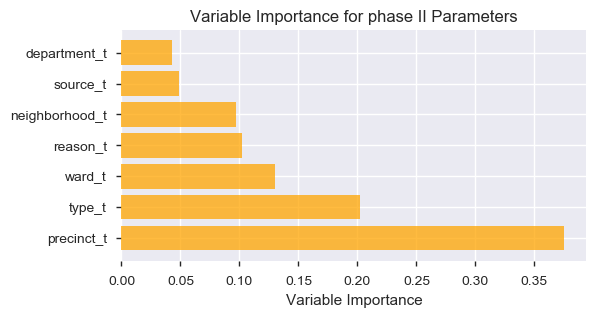

In [556]:
## Creating a variable importance plot
count, ax = plt.subplots(figsize=(6,3))
plt.barh(importance.Features, importance.Importance, align='center', alpha=0.75, color='orange')
plt.xlabel('Variable Importance')
plt.title('Variable Importance for phase II Parameters')

plt.show()

In [557]:
###########################################  Hyperparamter Tuning Section #################################

In [558]:
## Creating second round of input attributes for phase 2 of model devlopment 
data_m3 = data_s[['ontime_t', 'precinct_t', 'type_t', 'reason_t', 'ward_t', 'source_t', 'neighborhood_t', 'department_t']]
data_m3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 842507 to 748994
Data columns (total 8 columns):
ontime_t          207386 non-null int64
precinct_t        207386 non-null int64
type_t            207386 non-null int64
reason_t          207386 non-null int64
ward_t            207386 non-null int64
source_t          207386 non-null int64
neighborhood_t    207386 non-null int64
department_t      207386 non-null int64
dtypes: int64(8)
memory usage: 14.2 MB


In [559]:
##  Creating a subsample for analysis for the modeling section
data_m3=data_m3.sample(frac=0.25, random_state=99)
data_m3.shape

(51846, 8)

In [560]:
# separating our independent and dependent variable
X = data_m3.drop(['ontime_t'], axis = 1)
y = data_m3["ontime_t"]

In [561]:
## Splitting the data into the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .35, random_state = 0)

In [562]:
# get shape of test and training sets
print('Training Set:')
print('Number of datapoints: ', X_train.shape[0])
print('Number of features:   ', X_train.shape[1])
print('\n')
print('Test Set:')
print('Number of datapoints: ', X_test.shape[0])
print('Number of features:   ', X_test.shape[1])

Training Set:
Number of datapoints:  33699
Number of features:    7


Test Set:
Number of datapoints:  18147
Number of features:    7


In [563]:
# Cross validate model with Kfold stratified cross val
kfold = StratifiedKFold(n_splits=5)

In [564]:
### META MODELING  WITH ADABOOST, RF, EXTRATREES and GRADIENTBOOSTING

# Adaboost
DTC = DecisionTreeClassifier()

adaDTC = AdaBoostClassifier(DTC, random_state=7)

ada_param_grid = {"base_estimator__criterion" : ["gini", "entropy"],
              "base_estimator__splitter" :   ["best", "random"],
              "algorithm" : ["SAMME","SAMME.R"],
              "n_estimators" :[1,2],
              "learning_rate":  [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,1.5]}

gsadaDTC = GridSearchCV(adaDTC,param_grid = ada_param_grid, cv=kfold, scoring="f1", n_jobs= 4, verbose = 1)

gsadaDTC.fit(X_train,y_train)

ada_best = gsadaDTC.best_estimator_

Fitting 5 folds for each of 112 candidates, totalling 560 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done 294 tasks      | elapsed:   10.6s
[Parallel(n_jobs=4)]: Done 560 out of 560 | elapsed:   18.4s finished


In [565]:
## Printing the best model for adaboost
ada_best

AdaBoostClassifier(algorithm='SAMME',
          base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='random'),
          learning_rate=0.0001, n_estimators=1, random_state=7)

In [566]:
## Printing the best score for adaboost
gsadaDTC.best_score_

0.35489611238881147

In [567]:
#ExtraTrees model
ExtC = ExtraTreesClassifier()


## Search grid for optimal parameters
ex_param_grid = {"max_depth": [None],
              "max_features": [1, 3, 7],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "bootstrap": [False],
              "n_estimators" :[100,300],
              "criterion": ["gini"]}


gsExtC = GridSearchCV(ExtC,param_grid = ex_param_grid, cv=kfold, scoring="f1", n_jobs= 4, verbose = 1)

gsExtC.fit(X_train, y_train)

ExtC_best = gsExtC.best_estimator_


Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   37.4s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:  2.8min
[Parallel(n_jobs=4)]: Done 270 out of 270 | elapsed:  4.8min finished


In [568]:
## Printing the best Extra Tree Classifier Model
ExtC_best

ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features=7, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=10,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [569]:
# Best score for EXTRA TREES
gsExtC.best_score_

0.37894761748115746

In [570]:
####################################################################

In [571]:
# RFC Parameters tunning 
RFC = RandomForestClassifier()


## Search grid for optimal parameters
rf_param_grid = {"max_depth": [None],
              "max_features": [1, 3, 7],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "bootstrap": [False],
              "n_estimators" :[100,300],
              "criterion": ["gini"]}


gsRFC = GridSearchCV(RFC,param_grid = rf_param_grid, cv=kfold, scoring="f1", n_jobs= 4, verbose = 1)

gsRFC.fit(X_train, y_train)

RFC_best = gsRFC.best_estimator_


Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   52.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:  4.9min
[Parallel(n_jobs=4)]: Done 270 out of 270 | elapsed:  9.1min finished


In [572]:
## Printing the best Random Forest Model
RFC_best

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
            max_depth=None, max_features=3, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [573]:
## Best score for RF
gsRFC.best_score_

0.3714155493955076

In [574]:
##########################################################################

In [575]:
# Gradient boosting Hyperparameter tuning

GBC = GradientBoostingClassifier()
gb_param_grid = {'loss' : ["deviance"],
              'n_estimators' : [100,200,300],
              'learning_rate': [0.1, 0.05, 0.01],
              'max_depth': [4, 8],
              'min_samples_leaf': [100,150],
              'max_features': [0.3, 0.1] 
              }

gsGBC = GridSearchCV(GBC,param_grid = gb_param_grid, cv=kfold, scoring="f1", n_jobs= 4, verbose = 1)

gsGBC.fit(X_train, y_train)

GBC_best = gsGBC.best_estimator_


Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   20.7s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=4)]: Done 360 out of 360 | elapsed:  3.9min finished


In [576]:
## Printing the best model for GBC
GBC_best

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=8,
              max_features=0.3, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=100, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=300,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [577]:
# GBC Best score
gsGBC.best_score_

0.32355326215192154

In [578]:
#############################################################################

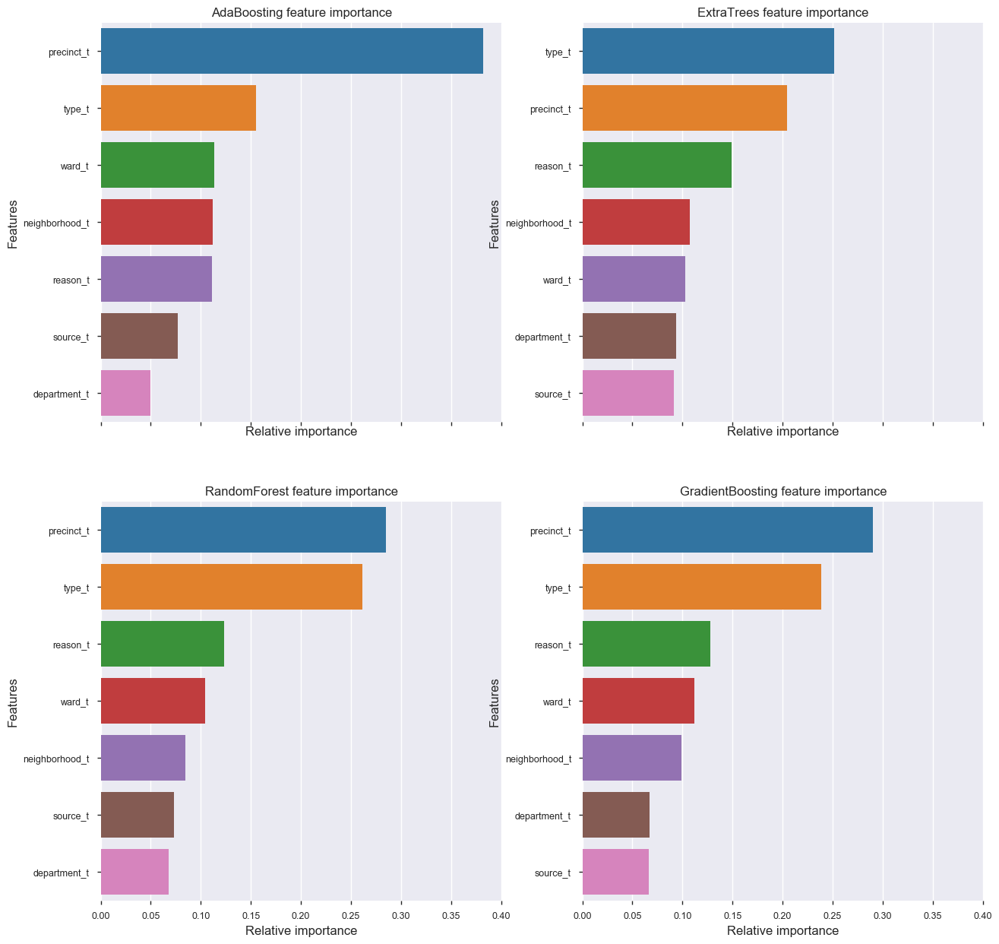

In [579]:
## PLotting the Feature Importance Values for the top four models 
nrows = ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, sharex="all", figsize=(15,15))

names_classifiers = [("AdaBoosting", ada_best),("ExtraTrees",ExtC_best),("RandomForest",RFC_best),("GradientBoosting",GBC_best)]

nclassifier = 0
for row in range(nrows):
    for col in range(ncols):
        name = names_classifiers[nclassifier][0]
        classifier = names_classifiers[nclassifier][1]
        indices = np.argsort(classifier.feature_importances_)[::-1][:40]
        g = sns.barplot(y=X_train.columns[indices][:40],x = classifier.feature_importances_[indices][:40] , orient='h',ax=axes[row][col])
        g.set_xlabel("Relative importance",fontsize=12)
        g.set_ylabel("Features",fontsize=12)
        g.tick_params(labelsize=9)
        g.set_title(name + " feature importance")
        nclassifier += 1

In [580]:
## Printing Hyperparamter Tuning Results for the top four Models 
results_ = pd.DataFrame({
    'Tuned Models': ["AdaBoosting", "Gradient Boosting", "Extra Tree Classifier", "Random Forest"],
    'Optimized f1 Results': [gsadaDTC.best_score_, gsGBC.best_score_, gsExtC.best_score_, gsRFC.best_score_]})

result_df = results_.sort_values(by='Optimized f1 Results', ascending=False)
result_df.head(11)

,Tuned Models,Optimized f1 Results
2,Extra Tree Classifier,0.378948
3,Random Forest,0.371416
0,AdaBoosting,0.354896
1,Gradient Boosting,0.323553


In [581]:
################################################ Champion Model #################################################

In [582]:
## Creating champion model variables 
data_m4 = data_s[['ontime_t', 'precinct_t', 'type_t', 'reason_t', 'ward_t', 'source_t', 'neighborhood_t', 
                  'department_t', 'city_council_district']]
data_m4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 842507 to 748994
Data columns (total 9 columns):
ontime_t                 207386 non-null int64
precinct_t               207386 non-null int64
type_t                   207386 non-null int64
reason_t                 207386 non-null int64
ward_t                   207386 non-null int64
source_t                 207386 non-null int64
neighborhood_t           207386 non-null int64
department_t             207386 non-null int64
city_council_district    207386 non-null object
dtypes: int64(8), object(1)
memory usage: 15.8+ MB


In [583]:
##  Creating a subsample for analysis for the modeling section
data_m4=data_m4.sample(frac=1, random_state=99)
data_m4.shape

(207386, 9)

In [584]:
# separating our independent and dependent variable
X = data_m4.drop(['ontime_t'], axis = 1)
y = data_m4["ontime_t"]

In [585]:
## Splitting the data into the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.35, random_state = 0)

In [586]:
# get shape of test and training sets
print('Training Set:')
print('Number of datapoints: ', X_train.shape[0])
print('Number of features:   ', X_train.shape[1])
print('\n')
print('Test Set:')
print('Number of datapoints: ', X_test.shape[0])
print('Number of features:   ', X_test.shape[1])

Training Set:
Number of datapoints:  134800
Number of features:    8


Test Set:
Number of datapoints:  72586
Number of features:    8


In [587]:
## Setting up the random forest with a balanced approach
rf=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features=7,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=6,
            min_samples_split=10, min_weight_fraction_leaf=0.0,
            n_estimators=75, n_jobs=1, oob_score=True, random_state=None,
            verbose=0, warm_start=False)

In [588]:
## Fitting the model
model1=rf.fit(X_train, y_train)
y_pred = model1.predict(X_test)

In [589]:
# Building feature importance into a DataFrame
fi = {'Features':X.columns.tolist(), 'Importance':model1.feature_importances_}
importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False)

In [590]:
## Printing Variable Importance 
print(importance)

                Features  Importance
1                 type_t    0.351557
0             precinct_t    0.192028
2               reason_t    0.182364
6           department_t    0.098862
4               source_t    0.056090
3                 ward_t    0.049786
5         neighborhood_t    0.039462
7  city_council_district    0.029851


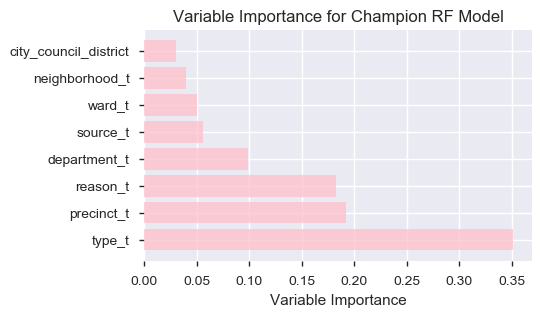

In [591]:
## Printing the Variable Importance Results 
count, ax = plt.subplots(figsize=(5,3))
plt.barh(importance.Features, importance.Importance, align='center', alpha=0.75, color='pink')
plt.xlabel('Variable Importance')
plt.title('Variable Importance for Champion RF Model')

plt.show()

In [592]:
## Calcuating the Confusion Matrix 
confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
confusion_matrix

array([[51205, 11582],
       [ 2744,  7055]], dtype=int64)

Recall metric in the train dataset: 71.99714256556791%


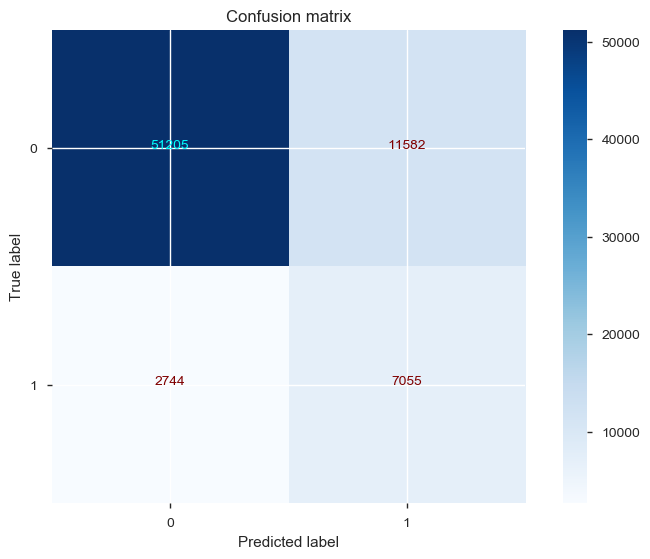

In [593]:
## Printing the Confusion Matrix
print("Recall metric in the train dataset: {}%".format(100*confusion_matrix[1,1]/(confusion_matrix[1,0]+confusion_matrix[1,1])))
class_names = [0,1]
plt.figure()
plot_confusion_matrix(confusion_matrix , classes=class_names, title='Confusion matrix')
plt.show()

In [594]:
## RF Classification Report for the Precision, Recall and F1 Score
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.95      0.82      0.88     62787
          1       0.38      0.72      0.50      9799

avg / total       0.87      0.80      0.83     72586



In [ ]:
###################### Random Forest Model Optimization 

In [595]:
## Creating group of variables for Random Forest
data_m5 = df_timeb[['ontime_t', 'precinct_t', 'type_t', 'reason_t', 'ward_t', 'source_t', 'neighborhood_t2', 'department_t', 
                    'week','city_council_district']]
data_m5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 606536 to 906550
Data columns (total 10 columns):
ontime_t                 207386 non-null int64
precinct_t               207386 non-null int64
type_t                   207386 non-null int64
reason_t                 207386 non-null int64
ward_t                   207386 non-null int64
source_t                 207386 non-null int64
neighborhood_t2          207386 non-null int64
department_t             207386 non-null int64
week                     207386 non-null int64
city_council_district    207386 non-null object
dtypes: int64(9), object(1)
memory usage: 27.4+ MB


In [596]:
##  Creating a subsample for analysis for the modeling section
data_m5=data_m5.sample(frac=1, random_state=99)
data_m5.shape

(207386, 10)

In [597]:
# separating our independent and dependent variable
X = data_m5.drop(['ontime_t'], axis = 1)
y = data_m5["ontime_t"]

In [598]:
## Splitting the data into the training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.35, random_state = 0)

In [599]:
# get shape of test and training sets
print('Training Set:')
print('Number of datapoints: ', X_train.shape[0])
print('Number of features:   ', X_train.shape[1])
print('\n')
print('Test Set:')
print('Number of datapoints: ', X_test.shape[0])
print('Number of features:   ', X_test.shape[1])

Training Set:
Number of datapoints:  134800
Number of features:    9


Test Set:
Number of datapoints:  72586
Number of features:    9


In [600]:
## Setting up the random forest with a balanced approach
rf=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features=7,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=6,
            min_samples_split=10, min_weight_fraction_leaf=0.0,
            n_estimators=75, n_jobs=1, oob_score=True, random_state=None,
            verbose=0, warm_start=False)

In [601]:
## Fitting the model
model1=rf.fit(X_train, y_train)
y_pred = model1.predict(X_test)

In [602]:
# Building feature importance into a DataFrame
fi = {'Features':X.columns.tolist(), 'Importance':model1.feature_importances_}
importance = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False)

In [603]:
## Printing Variable Importance 
print(importance)

                Features  Importance
1                 type_t    0.289480
7                   week    0.172680
2               reason_t    0.140696
0             precinct_t    0.139774
6           department_t    0.084572
3                 ward_t    0.051677
4               source_t    0.051502
5        neighborhood_t2    0.040300
8  city_council_district    0.029319


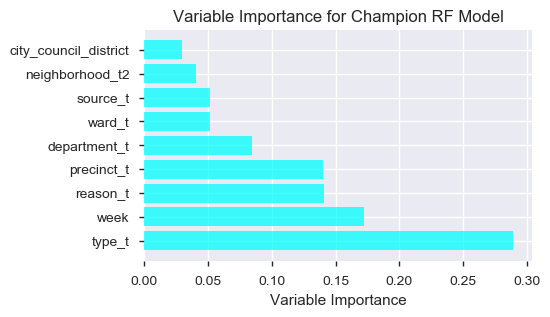

In [604]:
## Printing the Variable Importance Results 
count, ax = plt.subplots(figsize=(5,3))
plt.barh(importance.Features, importance.Importance, align='center', alpha=0.75, color='cyan')
plt.xlabel('Variable Importance')
plt.title('Variable Importance for Champion RF Model')

plt.show()

In [605]:
## Calcuating the Confusion Matrix 
confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
confusion_matrix

array([[54164,  8505],
       [ 3019,  6898]], dtype=int64)

Recall metric in the train dataset: 69.55732580417465%


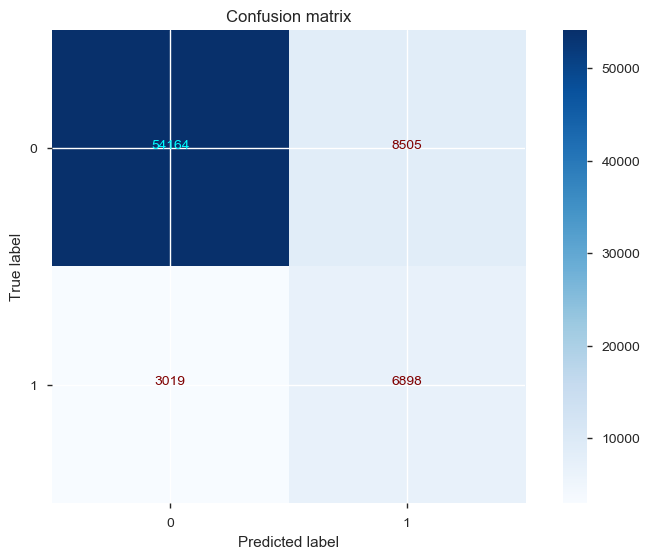

In [606]:
## Printing the Random Forest confusion matrix 
print("Recall metric in the train dataset: {}%".format(100*confusion_matrix[1,1]/(confusion_matrix[1,0]+confusion_matrix[1,1])))
class_names = [0,1]
plt.figure()
plot_confusion_matrix(confusion_matrix , classes=class_names, title='Confusion matrix')
plt.show()

In [607]:
## RF Classification Report for the Precision, Recall and F1 Score
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.95      0.86      0.90     62669
          1       0.45      0.70      0.54      9917

avg / total       0.88      0.84      0.85     72586



In [608]:
################################## Champion model for Extra Trees 

In [609]:
xtree=ExtraTreesClassifier(bootstrap=False, class_weight='balanced', criterion='gini',
           max_depth=None, max_features=7, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=10,
           min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [610]:
## Fitting the model for Extra Trees
model2=xtree.fit(X_train,y_train) 
y_pred = model2.predict(X_test)

In [611]:
# Building feature importance into a DataFrame
fi = {'Features':X.columns.tolist(), 'Importance':model2.feature_importances_}
importance2 = pd.DataFrame(fi, index=None).sort_values('Importance', ascending=False)

In [612]:
## Printing Variable Importance 
print(importance)

                Features  Importance
1                 type_t    0.289480
7                   week    0.172680
2               reason_t    0.140696
0             precinct_t    0.139774
6           department_t    0.084572
3                 ward_t    0.051677
4               source_t    0.051502
5        neighborhood_t2    0.040300
8  city_council_district    0.029319


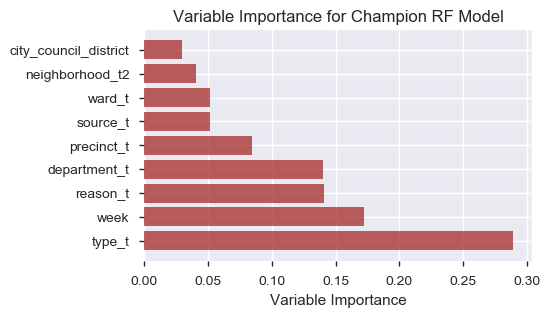

In [613]:
## Printing the Variable Importance Results 
count, ax = plt.subplots(figsize=(5,3))
plt.barh(importance2.Features, importance.Importance, align='center', alpha=0.75, color='brown')
plt.xlabel('Variable Importance')
plt.title('Variable Importance for Champion RF Model')

plt.show()

In [614]:
## Calcuating the Confusion Matrix 
confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
confusion_matrix

array([[53472,  9197],
       [ 3151,  6766]], dtype=int64)

In [615]:
## Extra Trees Classification Report for the Precision, Recall and F1 Score
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.94      0.85      0.90     62669
          1       0.42      0.68      0.52      9917

avg / total       0.87      0.83      0.85     72586



Recall metric in the train dataset: 68.22627810829889%


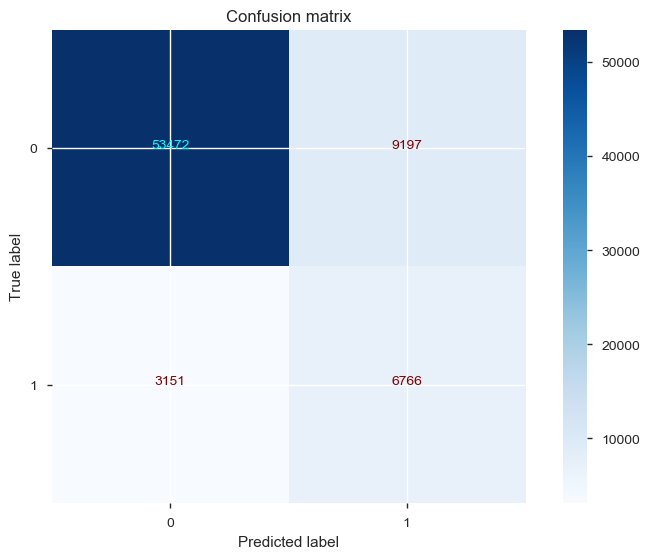

In [616]:
## Printing the Extra Trees Confusion Matrix 
print("Recall metric in the train dataset: {}%".format(100*confusion_matrix[1,1]/(confusion_matrix[1,0]+confusion_matrix[1,1])))
class_names = [0,1]
plt.figure()
plot_confusion_matrix(confusion_matrix , classes=class_names, title='Confusion matrix')
plt.show()

In [617]:
##################################### SMOTE#####################################################

In [618]:
## Creating group of variables for the SMOTE Approach 
data_m6 = df_timeb[['ontime_t', 'precinct_t', 'type_t', 'reason_t', 'ward_t', 'source_t', 'neighborhood_t', 'department_t', 
                    'week','city_council_district']]
data_m6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207386 entries, 606536 to 906550
Data columns (total 10 columns):
ontime_t                 207386 non-null int64
precinct_t               207386 non-null int64
type_t                   207386 non-null int64
reason_t                 207386 non-null int64
ward_t                   207386 non-null int64
source_t                 207386 non-null int64
neighborhood_t           207386 non-null int64
department_t             207386 non-null int64
week                     207386 non-null int64
city_council_district    207386 non-null object
dtypes: int64(9), object(1)
memory usage: 27.4+ MB


In [619]:
# separating our independent and dependent variable
X = data_m6.drop(['ontime_t'], axis = 1)
y = data_m6["ontime_t"]

In [620]:
 # split into 65:35 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.35, random_state = 0)

In [621]:
## Smote approach
sm = SMOTE(random_state = 2) 
X_train_res, y_train_res = sm.fit_sample(X_train, y_train.ravel())

In [622]:
## calcuating the f1 score 
f1_score(y_test, y_pred)

0.16621569385388482

In [623]:
## Calcuating the accurcy score 
accuracy_score(y_test, y_pred)

0.7028352574876698

In [624]:
## Calculating  the smote confusion matrix 
confusion_matrix

array([[53472,  9197],
       [ 3151,  6766]], dtype=int64)

In [625]:
## Printing the classification report for smote
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.86      0.78      0.82     62679
          1       0.13      0.22      0.17      9907

avg / total       0.76      0.70      0.73     72586



In [626]:
######################################  Geo Pandas Mapping Functions #######################################

In [627]:
# Shape of the Data and creating a sample size of 100%
 
data_s10=df1.sample(frac=1, random_state=99)
data_s10.shape

(207386, 46)

In [628]:
## Geo Panda references 
## https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972
## http://bostonopendata-boston.opendata.arcgis.com/datasets/3525b0ee6e6b427f9aab5d0a1d0a1a28_0/data?geometry=-71.208%2C42.268%2C-70.906%2C42.357&page=2

In [629]:
data_s10.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
878963,ONTIME,Citizens Connect App,3,8,Public Works Department,7,PWDx,7,C11,Pick up Dead Animal,...,146,1,8,-3,0,2,33,18,Sunday,7
750483,ONTIME,City Worker App,8,3,Public Works Department,1B,PWDx,14,A1,CE Collection,...,43,1,3,-1,0,1,37,12,Wednesday,3
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,197,0,14,-25,5,30,28,11,Thursday,4


In [630]:
## Importing the base map
data = gpd.read_file("C:/Users/jlpar/Documents/Springboard Curriculum/Data/Fire_Districts.shx", encoding="utf-8")
data

,geometry
0,(POLYGON ((-71.01674382905469 42.4027073297481...
1,POLYGON ((-71.12585436211464 42.37168777703847...
2,POLYGON ((-71.15765221350682 42.29567103954479...
3,(POLYGON ((-70.95849132335408 42.3595614967425...
4,POLYGON ((-71.07291090405376 42.35544538854614...
5,POLYGON ((-71.04451201740888 42.36133636957123...
6,"POLYGON ((-71.0598525874513 42.320022666095, -..."
7,(POLYGON ((-71.03590428499889 42.2951735302128...
8,"POLYGON ((-71.08950759881419 42.3345316676906,..."


In [631]:
## Creating the base map 
street_map=data
#fig,ax=plt.subplots(figsize=(15,15))


In [632]:
## Uploading the base map coordinates     
crs ={'init': 'epsg:4326'} 
data_s10.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t
878963,ONTIME,Citizens Connect App,3,8,Public Works Department,7,PWDx,7,C11,Pick up Dead Animal,...,146,1,8,-3,0,2,33,18,Sunday,7
750483,ONTIME,City Worker App,8,3,Public Works Department,1B,PWDx,14,A1,CE Collection,...,43,1,3,-1,0,1,37,12,Wednesday,3
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,197,0,14,-25,5,30,28,11,Thursday,4


In [633]:
## Creating the geometical locations  based on long and lat attributes
geometry = [Point(xy) for xy in zip( data_s10["longitude"], data_s10["latitude"])]
geometry[:3]

In [634]:
## Creating the geo  dataframe
geo_df = gpd.GeoDataFrame(data_s10, 
                         crs = crs,
                         geometry=geometry)
geo_df.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
878963,ONTIME,Citizens Connect App,3,8,Public Works Department,7,PWDx,7,C11,Pick up Dead Animal,...,1,8,-3,0,2,33,18,Sunday,7,POINT (-71.0578 42.2926)
750483,ONTIME,City Worker App,8,3,Public Works Department,1B,PWDx,14,A1,CE Collection,...,1,3,-1,0,1,37,12,Wednesday,3,POINT (-71.0681 42.3597)
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,0,14,-25,5,30,28,11,Thursday,4,POINT (-71.0587 42.3594)


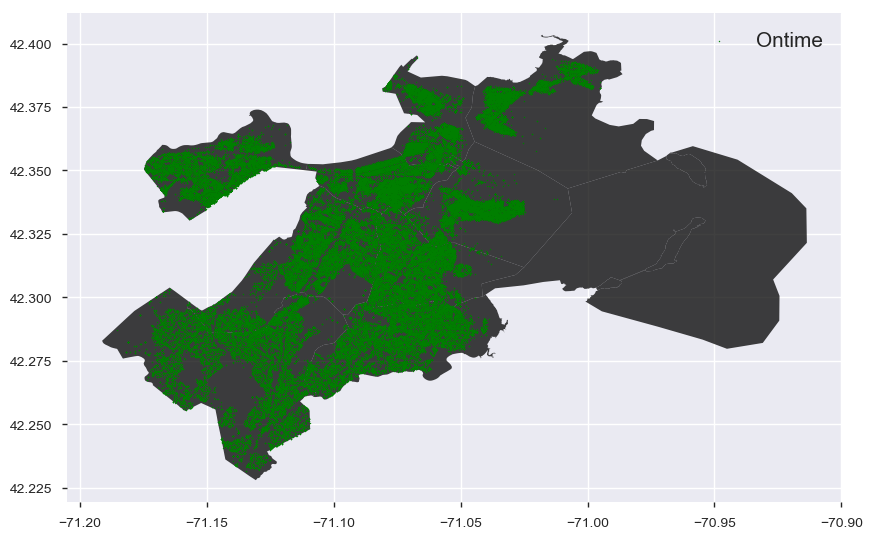

In [635]:
## Plotting the Geo map for all ontime cases 
fig,ax = plt.subplots(figsize = (10,10))
street_map.plot(ax=ax, alpha = 0.75, color = "black")
geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=0.5, color = 'green', marker = "o", label ="Ontime")
#geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=0.5, color = 'maroon', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

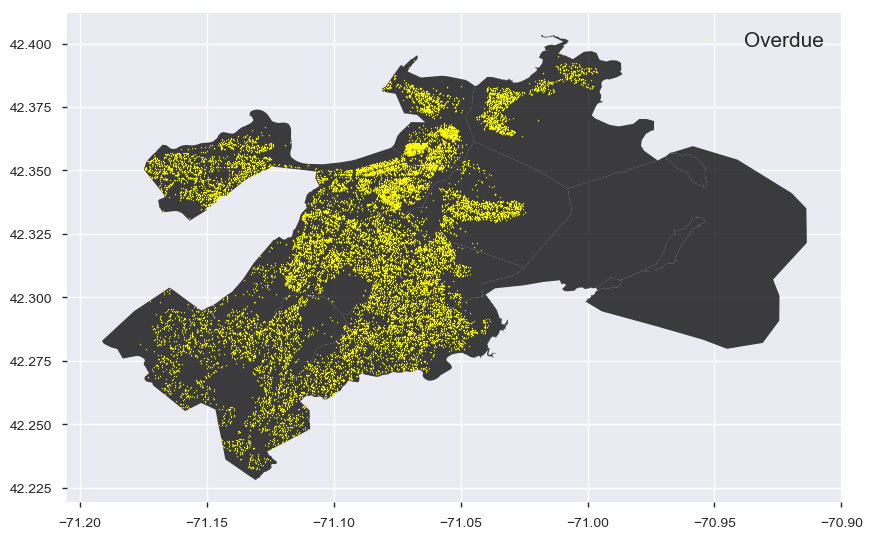

In [636]:
## Plotting the Geo map for all Overdue time cases 
fig,ax = plt.subplots(figsize = (10,10))
street_map.plot(ax=ax, alpha = 0.75, color = "black")
#geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=0.5, color = 'green', marker = "o", label ="Ontime")
geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=0.5, color = 'yellow', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

In [637]:
## creating a new dataframe that only has department based on ISD
data_s10_isp=data_s10[data_s10['department']=="ISD"]
data_s10_isp.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,0,14,-25,5,30,28,11,Thursday,4,POINT (-71.0587 42.3594)
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,0,2,265,266,1,33,16,Thursday,4,POINT (-71.0821 42.3435)


In [638]:
## Importing the base map 
data = gpd.read_file("C:/Users/jlpar/Documents/Springboard Curriculum/Data/Fire_Districts.shx", encoding="utf-8")
data

,geometry
0,(POLYGON ((-71.01674382905469 42.4027073297481...
1,POLYGON ((-71.12585436211464 42.37168777703847...
2,POLYGON ((-71.15765221350682 42.29567103954479...
3,(POLYGON ((-70.95849132335408 42.3595614967425...
4,POLYGON ((-71.07291090405376 42.35544538854614...
5,POLYGON ((-71.04451201740888 42.36133636957123...
6,"POLYGON ((-71.0598525874513 42.320022666095, -..."
7,(POLYGON ((-71.03590428499889 42.2951735302128...
8,"POLYGON ((-71.08950759881419 42.3345316676906,..."


In [639]:
## Creating the base map file 
street_map=data
#fig,ax=plt.subplots(figsize=(15,15))


In [640]:
## creating base geometry coordinates 
crs ={'init': 'epsg:4326'} 
data_s10_isp.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,0,14,-25,5,30,28,11,Thursday,4,POINT (-71.0587 42.3594)
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,0,2,265,266,1,33,16,Thursday,4,POINT (-71.0821 42.3435)
803799,ONTIME,Constituent Call,4,8,Inspectional Services,3,ISD,8,B3,Heat - Excessive Insufficient,...,0,12,-30,0,30,8,18,Monday,1,POINT (-71.0813 42.2931)


In [641]:
## Creating the base map and data base coordinates based on long and lat. 
geometry = [Point(xy) for xy in zip( data_s10_isp["longitude"], data_s10_isp["latitude"])]
geometry[:3]

In [642]:
## Creating the geo_df dataframe 
geo_df = gpd.GeoDataFrame(data_s10_isp, 
                         crs = crs,
                         geometry=geometry)
geo_df.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
862195,ONTIME,Citizens Connect App,6,9,Inspectional Services,2,ISD,11,E13,Rodent Activity,...,0,14,-25,5,30,28,11,Thursday,4,POINT (-71.0587 42.3594)
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,0,2,265,266,1,33,16,Thursday,4,POINT (-71.0821 42.3435)
803799,ONTIME,Constituent Call,4,8,Inspectional Services,3,ISD,8,B3,Heat - Excessive Insufficient,...,0,12,-30,0,30,8,18,Monday,1,POINT (-71.0813 42.2931)


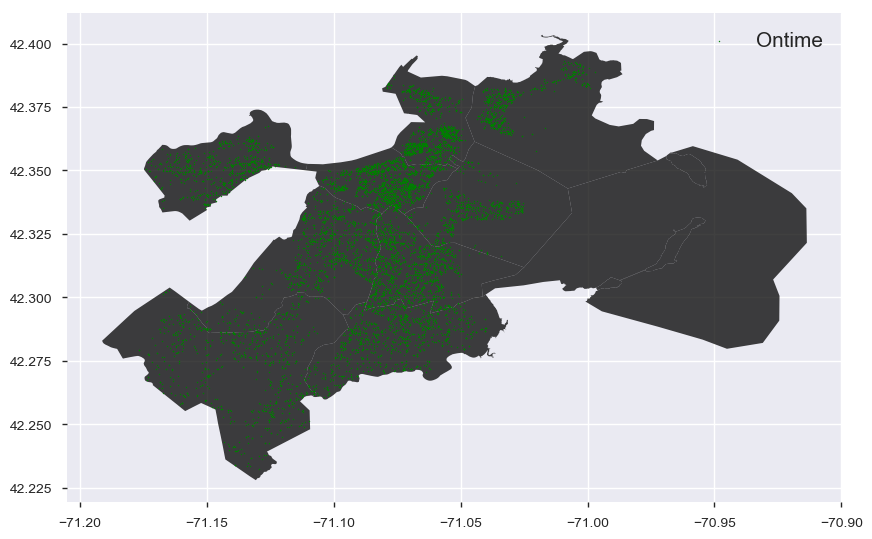

In [643]:
## Plotting the Geo map for all ISD ontime cases
fig,ax = plt.subplots(figsize = (10,10))
street_map.plot(ax=ax, alpha = 0.75, color = "black")
geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=0.5, color = 'green', marker = "o", label ="Ontime")
#geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=0.5, color = 'maroon', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

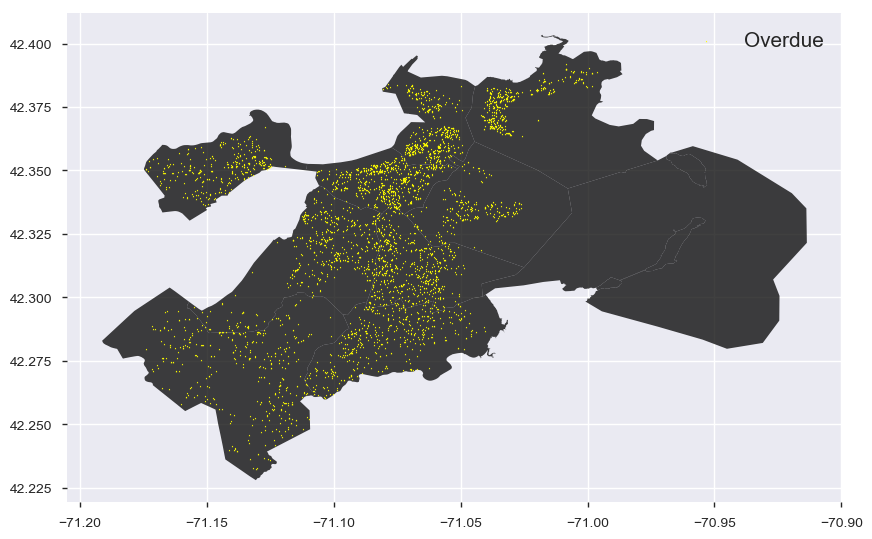

In [644]:
## Plotting the Geo map for all ISD Overdue cases
fig,ax = plt.subplots(figsize = (10,10))
street_map.plot(ax=ax, alpha = 0.75, color = "black")
#geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=0.5, color = 'green', marker = "o", label ="Ontime")
geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=0.5, color = 'yellow', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

In [645]:
#######################################################################################

In [646]:
## Creating a new dataframe where we filter department = DISB
data_s10_disb=data_s10[data_s10['department']=="DISB"]
data_s10_disb.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
893927,ONTIME,Self Service,4,8,Transportation - Traffic Division,7,DISB,8,C11,New Sign Crosswalk or Pavement Marking,...,0,8,-23,7,30,38,17,Tuesday,2,POINT (-71.0671 42.2944)
719742,OVERDUE,Constituent Call,1,1,Transportation - Traffic Division,9,DISB,1,A7,New Sign Crosswalk or Pavement Marking,...,0,10,320,350,30,29,16,Monday,1,POINT (-71.0333 42.3822)


In [647]:
## Importing the base map 
data = gpd.read_file("C:/Users/jlpar/Documents/Springboard Curriculum/Data/Wards.shx", encoding="utf-8")
data

,geometry
0,POLYGON ((-70.99599206852339 42.39471259372155...
1,(POLYGON ((-71.06845333546552 42.3853743681250...
2,(POLYGON ((-71.0521907862684 42.36891770803197...
3,POLYGON ((-71.07352623852815 42.34728398618122...
4,POLYGON ((-71.07414313107191 42.35769324515638...
5,"POLYGON ((-71.07067175629423 42.3408162248969,..."
6,POLYGON ((-71.04449581861093 42.35341163375831...
7,POLYGON ((-71.05615919430019 42.33659666482262...
8,POLYGON ((-71.06104725371075 42.34281390440795...
9,POLYGON ((-71.07670285369592 42.32288994714647...


In [648]:
## creating the base street map df
street_map=data
#fig,ax=plt.subplots(figsize=(15,15))


In [649]:
## creating base geometry coordinates 
crs ={'init': 'epsg:4326'} 
data_s10_disb.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
893927,ONTIME,Self Service,4,8,Transportation - Traffic Division,7,DISB,8,C11,New Sign Crosswalk or Pavement Marking,...,0,8,-23,7,30,38,17,Tuesday,2,POINT (-71.0671 42.2944)
719742,OVERDUE,Constituent Call,1,1,Transportation - Traffic Division,9,DISB,1,A7,New Sign Crosswalk or Pavement Marking,...,0,10,320,350,30,29,16,Monday,1,POINT (-71.0333 42.3822)
802735,ONTIME,Constituent Call,9,11,Public Works Department,4,DISB,15,D14,Requests for Street Cleaning,...,0,1,-1,0,1,7,14,Thursday,4,POINT (-71.13760000000001 42.3538)


In [650]:
## Creating the base map and data base coordinates based on long and lat. 
geometry = [Point(xy) for xy in zip( data_s10_disb["longitude"], data_s10_disb["latitude"])]
geometry[:3]

In [651]:
## Creating the geo_df dataframe 
geo_df = gpd.GeoDataFrame(data_s10_disb, 
                         crs = crs,
                         geometry=geometry)
geo_df.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
893927,ONTIME,Self Service,4,8,Transportation - Traffic Division,7,DISB,8,C11,New Sign Crosswalk or Pavement Marking,...,0,8,-23,7,30,38,17,Tuesday,2,POINT (-71.0671 42.2944)
719742,OVERDUE,Constituent Call,1,1,Transportation - Traffic Division,9,DISB,1,A7,New Sign Crosswalk or Pavement Marking,...,0,10,320,350,30,29,16,Monday,1,POINT (-71.0333 42.3822)
802735,ONTIME,Constituent Call,9,11,Public Works Department,4,DISB,15,D14,Requests for Street Cleaning,...,0,1,-1,0,1,7,14,Thursday,4,POINT (-71.13760000000001 42.3538)


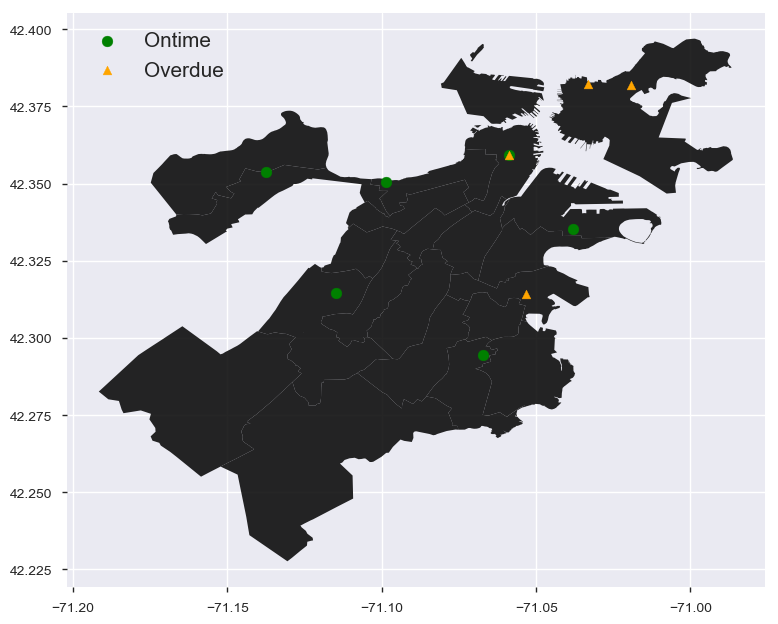

In [652]:
## Plotting the Geo map for all DISB for Ontime and  Overdue cases
fig,ax = plt.subplots(figsize = (9,9))
street_map.plot(ax=ax, alpha = 0.85, color = "black")
geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=60, color = 'green', marker = "o", label ="Ontime")
geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=40, color = 'orange', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

In [653]:
## Creating a new dataframe where we filter al close_open_diff > 250 for boston
data_s10_225=data_s10[data_s10['close_open_diff']>=220]
data_s10_225.head(2)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,0,2,265,266,1,33,16,Thursday,4,POINT (-71.0821 42.3435)
757853,OVERDUE,Citizens Connect App,2,3,Transportation - Traffic Division,1C,BTDT,3,A1,Sign Repair,...,0,9,362,376,14,39,28,Friday,5,POINT (-71.0587 42.3594)


In [654]:
## Importing the base map 
data = gpd.read_file("C:/Users/jlpar/Documents/Springboard Curriculum/Data/Fire_Districts.shx", encoding="utf-8")
data

,geometry
0,(POLYGON ((-71.01674382905469 42.4027073297481...
1,POLYGON ((-71.12585436211464 42.37168777703847...
2,POLYGON ((-71.15765221350682 42.29567103954479...
3,(POLYGON ((-70.95849132335408 42.3595614967425...
4,POLYGON ((-71.07291090405376 42.35544538854614...
5,POLYGON ((-71.04451201740888 42.36133636957123...
6,"POLYGON ((-71.0598525874513 42.320022666095, -..."
7,(POLYGON ((-71.03590428499889 42.2951735302128...
8,"POLYGON ((-71.08950759881419 42.3345316676906,..."


In [655]:
## creating the base streetmap
street_map=data
#fig,ax=plt.subplots(figsize=(15,15))


In [656]:
## creating base geometry coordinates 
crs ={'init': 'epsg:4326'} 
data_s10_225.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,0,2,265,266,1,33,16,Thursday,4,POINT (-71.0821 42.3435)
757853,OVERDUE,Citizens Connect App,2,3,Transportation - Traffic Division,1C,BTDT,3,A1,Sign Repair,...,0,9,362,376,14,39,28,Friday,5,POINT (-71.0587 42.3594)
747871,ONTIME,Employee Generated,2,4,Parks & Recreation Department,1C,PARK,6,D4,New Tree Requests,...,0,21,-23,342,365,36,7,Friday,5,POINT (-71.07600000000001 42.3365)


In [657]:
## Creating the base map and data base coordinates based on long and lat. 
geometry = [Point(xy) for xy in zip( data_s10_225["longitude"], data_s10_225["latitude"])]
geometry[:3]

In [658]:
## Creating the geo_df dataframe 
geo_df = gpd.GeoDataFrame(data_s10_225, 
                         crs = crs,
                         geometry=geometry)
geo_df.head(3)

,ontime,source,city_council_district,fire_district,subject,pwd_district,department,neighborhood_services_district,police_district,type,...,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day,day_of_week,day_of_week_t,geometry
735329,OVERDUE,Constituent Call,7,4,Inspectional Services,1C,ISD,14,D4,Unsafe Dangerous Conditions,...,0,2,265,266,1,33,16,Thursday,4,POINT (-71.0821 42.3435)
757853,OVERDUE,Citizens Connect App,2,3,Transportation - Traffic Division,1C,BTDT,3,A1,Sign Repair,...,0,9,362,376,14,39,28,Friday,5,POINT (-71.0587 42.3594)
747871,ONTIME,Employee Generated,2,4,Parks & Recreation Department,1C,PARK,6,D4,New Tree Requests,...,0,21,-23,342,365,36,7,Friday,5,POINT (-71.07600000000001 42.3365)


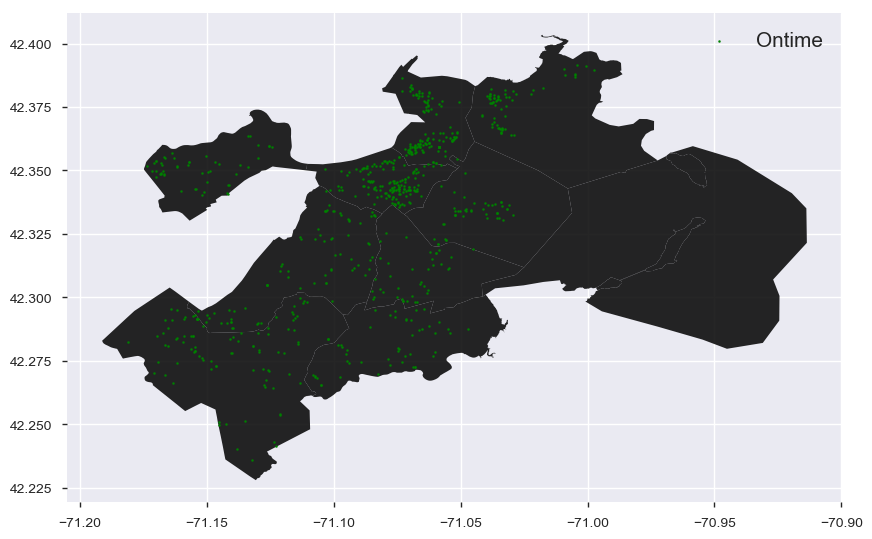

In [659]:
## Plotting the Geo map for all ontime cases more than 250 days over the close-open
fig,ax = plt.subplots(figsize = (10,10))
street_map.plot(ax=ax, alpha = 0.85, color = "black")
geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=2, color = 'green', marker = "o", label ="Ontime")
#geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=2, color = 'orange', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

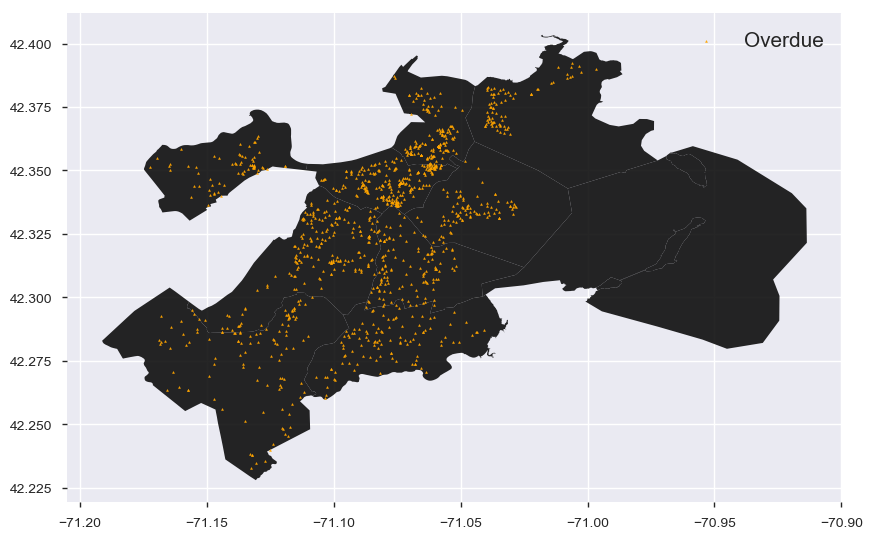

In [660]:
## Plotting the Geo map for all overdue cases more than 250 days over the close-open
fig,ax = plt.subplots(figsize = (10,10))
street_map.plot(ax=ax, alpha = 0.85, color = "black")
#geo_df[geo_df['ontime_t']==0].plot(ax=ax, markersize=2, color = 'green', marker = "o", label ="Ontime")
geo_df[geo_df['ontime_t']==1].plot(ax=ax, markersize=2, color = 'orange', marker = "^", label ="Overdue")
plt.legend(prop={'size':15})
plt.show()

In [661]:
df2.describe()

,neighborhood_services_district,precinct,latitude,longitude,ontime_t,source_t,source_t2,city_council_district_t,fire_district_t,fire_district_t2,...,reason_t,type_t,precinct_t,submittedphoto_t,neighborhood_t2,close_target_diff,close_open_diff,target_open_diff,week,day
count,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,...,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000,207386.000000
mean,8.981411,1732.905823,42.336009,-71.077197,0.135824,2.001066,2.000849,4.973754,7.014143,1.447224,...,26.008356,96.920973,100.367537,0.450566,11.577802,-14.904333,10.393773,25.081558,25.839738,15.327129
std,5.207665,18700.876441,0.031863,0.032980,0.342602,1.159662,1.158812,4.341275,4.622346,0.497208,...,12.183241,41.554011,75.116715,0.497551,6.653032,88.572770,43.293834,90.669426,14.664294,8.876556
min,0.000000,33.000000,42.231500,-71.185400,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,-720.000000,0.000000,-1.000000,1.000000,1.000000
25%,5.000000,406.000000,42.315500,-71.091500,0.000000,1.000000,1.000000,2.000000,4.000000,1.000000,...,15.000000,71.000000,35.000000,0.000000,8.000000,-4.000000,0.000000,1.000000,13.000000,8.000000
50%,9.000000,902.000000,42.347000,-71.065000,0.000000,2.000000,2.000000,4.000000,7.000000,1.000000,...,23.000000,94.000000,78.000000,0.000000,10.000000,-2.000000,0.000000,2.000000,26.000000,15.000000
75%,13.000000,1710.000000,42.359400,-71.058700,0.000000,3.000000,3.000000,7.000000,9.000000,2.000000,...,39.000000,125.000000,164.000000,1.000000,18.000000,-1.000000,2.000000,7.000000,38.000000,23.000000
max,33.000000,502001.000000,42.395100,-70.994900,1.000000,7.000000,6.000000,33.000000,33.000000,2.000000,...,45.000000,174.000000,254.000000,1.000000,23.000000,722.000000,738.000000,721.000000,52.000000,31.000000


In [662]:
##Creating a word cloud from the df1 type commplaint
text = " ".join(review for review in df2['type'])
print ("There are {} words in the combination of all review.".format(len(text)))

There are 5117637 words in the combination of all review.


In [663]:
## Creating the stopwords file 
stopWords = set(stopwords.words('english'))
stop=stopWords

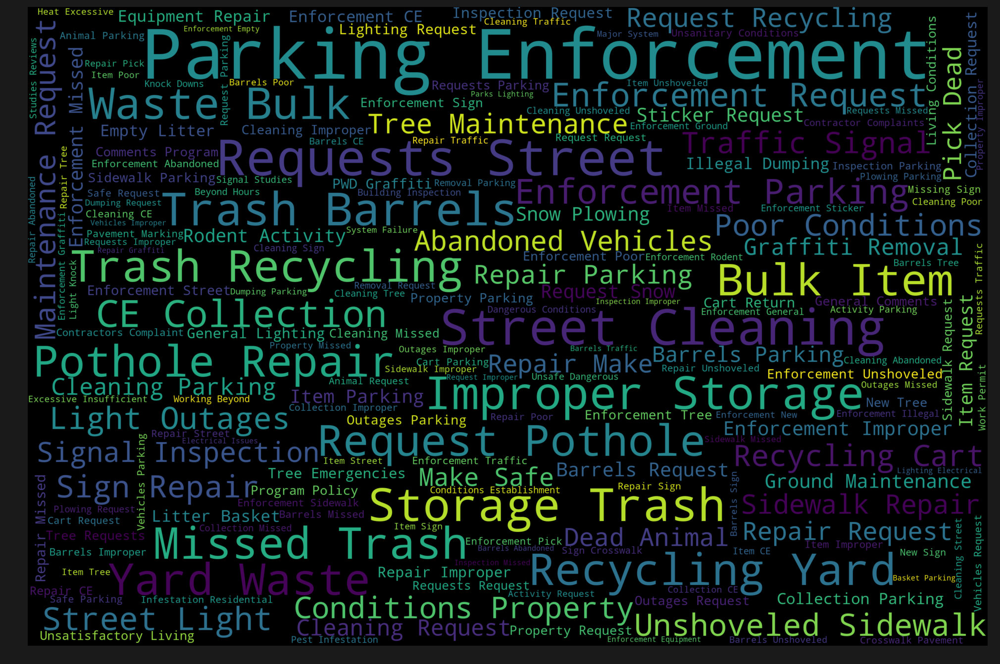

In [664]:
## Generating another wordcloud 
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stop).generate(str(text))
fig = plt.figure(
    figsize = (20, 20),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
###################################### The END